<a href="https://colab.research.google.com/github/tecexbarto/Dinosaurs/blob/main/Dinosaurios.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

***DINOSAURIOS: UN ANÁLISIS DE DATOS SOBRE ESTAS FASCINANTES CRIATURAS PREHISTÓRICAS***

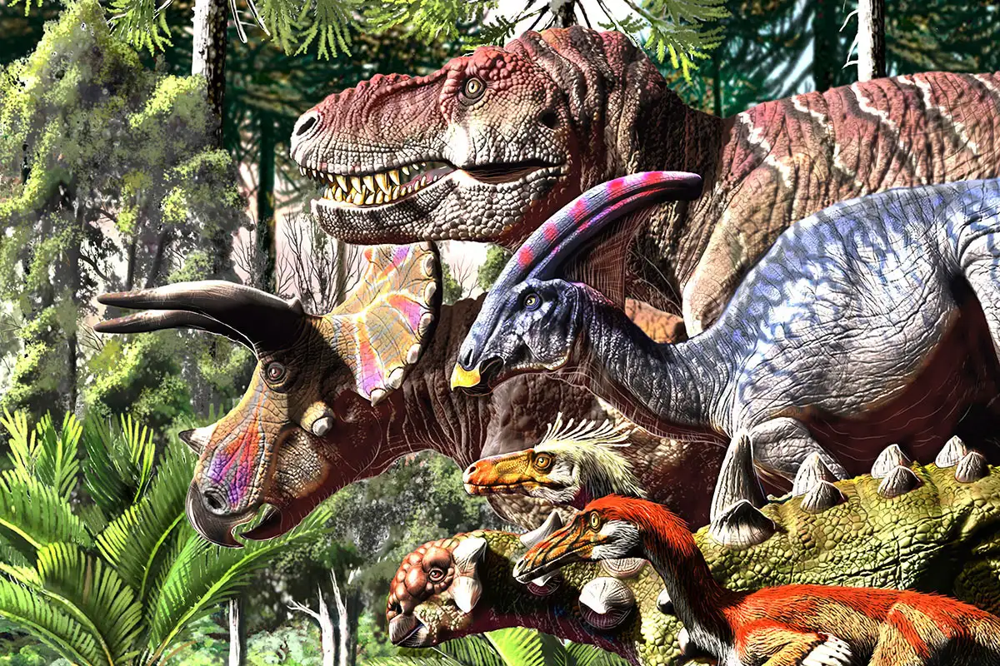

In [ ]:
import pandas as pd
import numpy as np
from bs4 import BeautifulSoup as bs
import requests as req
import matplotlib.pyplot as plt
import plotly.express as px

#IMPORTACIÓN DE DATOS

##NOTA

Un detalle que quisiera puntualizar es que las bases de datos que vamos a utilizar están conformadas por géneros, no por especies. Un género es una categoría utilizada para agrupar especies similares en función de características compartidas. Por ejemplo, Tyrannosaurus es un género del que conocemos actualmente dos especies: Tyrannosaurus Rex y Tyrannosaurus Mcraeensis. Así que Rex y Mcraeensis, respectivamente, harían mención a las dos especies conocidas de Tyrannosaurus.

Importaremos nuestra base de datos de cuatro artículos de Wikipedia:

-Un artículo que consta de géneros válidos de dinosaurios, esto es, aceptados por la comunidad paleontológica.

-Otro artículo consta de géneros dudosos, aquellos dinosaurios de los que, dada la escasez de evidencias halladas, es imposible determinar si pertenecen realmente a un determinado género o no.

-En el siguiente artículo se presentan géneros sinónimos de dinosaurios; estos son géneros que se establecieron después de que el animal ya estuviera catalogado con otro nombre. El género original se considera el válido, mientras que los géneros posteriores se consideran sinónimos.

-Por último tenemos el artículo de géneros válidos e informales de dinosaurios. Son géneros que no cumplen con los criterios formales para su uso científico, o bien se trata de apodos dados por investigadores o la prensa.

Como técnica de Web scraping, he optado por Beautiful Soup.


##TABLA DE GÉNEROS VÁLIDOS

In [ ]:
url='https://es.wikipedia.org/wiki/Anexo:G%C3%A9neros_v%C3%A1lidos_de_dinosaurios'

In [ ]:
#extraigo el contenido html de la web y lo almaceno como texto
html=req.get(url).text

In [ ]:
html

'<!DOCTYPE html>\n<html class="client-nojs vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector-feature-limited-width-clientpref-1 vector-feature-limited-width-content-enabled vector-feature-custom-font-size-clientpref-1 vector-feature-appearance-enabled vector-feature-appearance-pinned-clientpref-1 vector-feature-night-mode-disabled skin-theme-clientpref-day vector-toc-not-available" lang="es" dir="ltr">\n<head>\n<meta charset="UTF-8">\n<title>Anexo:Géneros válidos de dinosaurios - Wikipedia, la enciclopedia libre</title>\n<script>(function(){var className="client-js vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 ve

In [ ]:
# aqui beautiful soup analiza el contenido html que se ha obtenido anteriormente con la solicitud
soup=bs(html, 'html.parser')

In [ ]:
#extraemos todas las etiquetas de tipo tabla
soup.find_all('table')

[<table align="top" border="0" class="sortable wikitable" style="background:#ffffff">
 <tbody><tr>
 <th style="background:Linen; color:Black" width="120">Género
 </th>
 <th style="background:Linen; color:Black" width="210">Clasificación<sup class="reference separada" id="cite_ref-clasificacion_1-0"><a href="#cite_note-clasificacion-1"><span class="corchete-llamada">[</span>1<span class="corchete-llamada">]</span></a></sup>​
 </th>
 <th style="background:Linen; color:Black" width="150">Edad
 </th>
 <th style="background:Linen; color:Black" width="200">En lo que hoy es...
 </th>
 <th style="background:Linen; color:Black" width="150">Paleoilustración
 </th></tr>
 <tr>
 <td><i><a class="mw-redirect" href="/wiki/Aardonyx" title="Aardonyx">Aardonyx</a></i></td>
 <td><b>O</b>: <a href="/wiki/Saurischia" title="Saurischia">Saurischia</a><br/><b>So</b>: <a href="/wiki/Sauropodomorpha" title="Sauropodomorpha">Sauropodomorpha</a><br/><b>Io</b>: <a href="/wiki/Anchisauria" title="Anchisauria">Anch

In [ ]:
#todas estas etiquetas las asigno a la variable tabla
tabla=soup.find_all('table')

In [ ]:
#selecciono todas las tablas de la web, habiendo comprobado previamente que todas me interesan. Cada tabla corresponde a una letra del abecedario
dinosaurios_validos = soup.find_all('table')[:]

In [ ]:
#recorro las filas de todas las tablas, celda por celda, para extraer la información de aquellas, y crear un dataframe

datos_dinosaurios = []

for tabla in dinosaurios_validos:

    filas = tabla.find_all('tr')

    for fila in filas[1:]:

        celdas = fila.find_all('td')

        dic_dinosaurio = {
            'Género': celdas[0].text,
            'Clasificación': celdas[1].text,
            'Edad': celdas[2].text,
            'Localización': celdas[3].text
        }

        datos_dinosaurios.append(dic_dinosaurio)

df_dinosaurios_v = pd.DataFrame(datos_dinosaurios)

In [ ]:
#aquí tenemos el primer dataframe, el de los géneros de dinosaurios válidos
df_dinosaurios_v

,Género,Clasificación,Edad,Localización
0,Aardonyx,O: SaurischiaSo: SauropodomorphaIo: Anchisauria,Jurásico (Hettangiense),Sudáfrica
1,Abdarainurus,O: SaurischiaSo: SauropodomorphaIo: Titanosauria,Cretácico (Albiense),Mongolia
2,Abditosaurus,O: SaurischiaSo: SauropodomorphaIo: Titanosauria,Cretácico (Maastrichtiense),España
3,Abelisaurus[2]​,O: SaurischiaSo: TheropodaIo: Ceratosauria,Cretácico (Campaniense),Argentina
4,Abrictosaurus,O: OrnithischiaSo: NeornithischiaIo: Ornithopoda,Jurásico (entre Hettangiense y Sinemuriense),Sudáfrica
...,...,...,...,...
1230,Zuniceratops[50]​,O: OrnithischiaSo: NeornithischiaIo: Ceratopsia,Cretácico (Turoniense),Estados Unidos
1231,Zuolong,O: SaurischiaSo: TheropodaIo: Coelurosauria,Jurásico (Oxfordiense),China
1232,Zuoyunlong,O: OrnithischiaSo: NeornithischiaIo: Ornithopoda,Cretácico (Cenomaniense),China
1233,Zupaysaurus,O: SaurischiaSo: TheropodaIo:,Triásico (Noriense y Rhaetiense),Argentina


##TABLA DE GÉNEROS DUDOSOS

In [ ]:
url_2='https://es.wikipedia.org/wiki/Anexo:G%C3%A9neros_dudosos_de_dinosaurios'

In [ ]:
html_2=req.get(url_2).text

In [ ]:
html_2

'<!DOCTYPE html>\n<html class="client-nojs vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector-feature-limited-width-clientpref-1 vector-feature-limited-width-content-enabled vector-feature-custom-font-size-clientpref-1 vector-feature-appearance-enabled vector-feature-appearance-pinned-clientpref-1 vector-feature-night-mode-disabled skin-theme-clientpref-day vector-toc-not-available" lang="es" dir="ltr">\n<head>\n<meta charset="UTF-8">\n<title>Anexo:Géneros dudosos de dinosaurios - Wikipedia, la enciclopedia libre</title>\n<script>(function(){var className="client-js vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 ve

In [ ]:
soup_2=bs(html_2, 'html.parser')

In [ ]:
soup_2.find_all('table')

[<table align="top" border="0" class="sortable wikitable" style="background:#ffffff">
 <tbody><tr>
 <th style="background:Linen; color:Black" width="120">Género
 </th>
 <th style="background:Linen; color:Black" width="210">Clasificación<sup class="reference separada" id="cite_ref-clasificacion_1-0"><a href="#cite_note-clasificacion-1"><span class="corchete-llamada">[</span>1<span class="corchete-llamada">]</span></a></sup>​
 </th>
 <th style="background:Linen; color:Black" width="150">Edad
 </th>
 <th style="background:Linen; color:Black" width="200">En lo que hoy es...
 </th>
 <th style="background:Linen; color:Black" width="150">Paleoilustración
 </th></tr>
 <tr>
 <td><i><a class="mw-redirect" href="/wiki/Acanthopholis" title="Acanthopholis">Acanthopholis</a></i></td>
 <td><b>O</b>: <a href="/wiki/Ornithischia" title="Ornithischia">Ornithischia</a><br/><b>So</b>: <a href="/wiki/Thyreophora" title="Thyreophora">Thyreophora</a><br/><b>Io</b>: <a href="/wiki/Ankylosauria" title="Ankylos

In [ ]:
tabla_2=soup_2.find_all('table')

In [ ]:
dinosaurios_dudosos = soup_2.find_all('table')[:]

In [ ]:
datos_dinosaurios_2 = []

for tabla_2 in dinosaurios_dudosos:

    filas_2 = tabla_2.find_all('tr')

    for fila_2 in filas_2[1:]:

        celdas_2 = fila_2.find_all('td')

        dic_dinosaurio_2 = {
            'Género': celdas_2[0].text,
            'Clasificación': celdas_2[1].text,
            'Edad': celdas_2[2].text,
            'Localización': celdas_2[3].text
        }

        datos_dinosaurios_2.append(dic_dinosaurio_2)

df_dinosaurios_d = pd.DataFrame(datos_dinosaurios_2)

In [ ]:
df_dinosaurios_d

,Género,Clasificación,Edad,Localización
0,Acanthopholis,O: OrnithischiaSo: ThyreophoraIo: Ankylosauria,Cretácico (entre Aptiense y Cenomaniense),Inglaterra
1,Aepisaurus,O: SaurischiaSo: SauropodomorphaIo: Sauropoda,Cretácico (Albiense),Francia
2,Aetonyx,O: SaurischiaSo: SauropodomorphaIo: Prosauropoda,Jurásico (Hettangiense),Sudáfrica
3,Agathaumas,O: OrnithischiaSo: NeornithischiaIo: Ceratopsia,Cretácico (Maastrichtiense),Estados Unidos
4,Agrosaurus,O: SaurischiaSo: SauropodomorphaIo:,Triásico (Rhaetiense),Inglaterra
...,...,...,...,...
144,Willinakaqe,O: OrnithischiaSo: NeornithischiaIo: Ornithopoda,Cretácico (Campaniense y Maastrichtiense),Argentina
145,Zapsalis,O: SaurischiaSo: Theropoda Io: Coelurosauria,Cretácico (Campaniense),Estados Unidos
146,Zhejiangosaurus,O: OrnithischiaSo: ThyreophoraIo: Ankylosauria,Cretácico (Cenomaniense),China
147,Zigongosaurus,O: SaurischiaSo: SauropodomorphaIo: Sauropoda,Jurásico (Batoniano y Calloviano),China


##TABLA DE GÉNEROS SINÓNIMOS

In [ ]:
url_3='https://es.wikipedia.org/wiki/Anexo:G%C3%A9neros_sin%C3%B3nimos_de_dinosaurios'

In [ ]:
html_3=req.get(url_3).text

In [ ]:
html_3

'<!DOCTYPE html>\n<html class="client-nojs vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector-feature-limited-width-clientpref-1 vector-feature-limited-width-content-enabled vector-feature-custom-font-size-clientpref-1 vector-feature-appearance-enabled vector-feature-appearance-pinned-clientpref-1 vector-feature-night-mode-disabled skin-theme-clientpref-day vector-toc-not-available" lang="es" dir="ltr">\n<head>\n<meta charset="UTF-8">\n<title>Anexo:Géneros sinónimos de dinosaurios - Wikipedia, la enciclopedia libre</title>\n<script>(function(){var className="client-js vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 

In [ ]:
soup_3=bs(html_3, 'html.parser')

In [ ]:
soup_3.find_all('table')

[<table align="top" border="0" class="sortable wikitable" style="background:#ffffff">
 <tbody><tr>
 <th style="background:Linen; color:Black" width="120">Género
 </th>
 <th style="background:Linen; color:Black" width="210">Clasificación<sup class="reference separada" id="cite_ref-clasificacion_1-0"><a href="#cite_note-clasificacion-1"><span class="corchete-llamada">[</span>1<span class="corchete-llamada">]</span></a></sup>​
 </th>
 <th style="background:Linen; color:Black" width="150">Edad
 </th>
 <th style="background:Linen; color:Black" width="200">En lo que hoy es...
 </th>
 <th style="background:Linen; color:Black" width="150">Sinónimo más antiguo
 </th></tr>
 <tr>
 <td><i><a class="mw-redirect" href="/wiki/Abdallahsaurus" title="Abdallahsaurus">Abdallahsaurus</a></i>
 </td>
 <td><b>O</b>: <a href="/wiki/Saurischia" title="Saurischia">Saurischia</a>
 <p><b>So</b>: <a href="/wiki/Sauropodomorpha" title="Sauropodomorpha">Sauropodomorpha</a>
 </p><p><b>Io</b>: <a href="/wiki/Sauropoda

In [ ]:
tabla_3=soup_3.find_all('table')

In [ ]:
dinosaurios_sinonimos = soup_3.find_all('table')[:]

In [ ]:
datos_dinosaurios_3 = []

for tabla_3 in dinosaurios_sinonimos:

    filas_3 = tabla_3.find_all('tr')

    for fila_3 in filas_3[1:]:

        celdas_3 = fila_3.find_all('td')

        dic_dinosaurio_3 = {
            'Género': celdas_3[0].text,
            'Clasificación': celdas_3[1].text.replace('\n', ''),
            'Edad': celdas_3[2].text.replace('\n', ''),
            'Localización': celdas_3[3].text.replace('\n', ''),
            'Sinónimo más antiguo': celdas_3[4].text.replace('\n', '')
        }

        datos_dinosaurios_3.append(dic_dinosaurio_3)

df_dinosaurios_s = pd.DataFrame(datos_dinosaurios_3)

In [ ]:
df_dinosaurios_s

,Género,Clasificación,Edad,Localización,Sinónimo más antiguo
0,Abdallahsaurus\n,O: SaurischiaSo: SauropodomorphaIo: Sauropoda,Jurásico (Kimmeridgiense y Titoniense),Tanzania,Giraffatitan
1,Ajancingenia,O: SaurischiaSo: TheropodaIo: Oviraptorosauria,Cretácico (Campaniense),Mongolia,Heyuannia
2,Aliwalia,O: SaurischiaSo: SauropodomorphaIo: Prosauropoda,Triásico (Carniense),Sudáfrica,Eucnemesaurus
3,Alashansaurus,O: SaurischiaSo: TheropodaIo: Carcharodontosau...,Cretácico (Turoniense),China,Shaochilong
4,Ammosaurus,O: SaurischiaSo: SauropodomorphaIo: Sauropoda,Jurásico (Sinemuriense),Estados Unidos,Anchisaurus
...,...,...,...,...,...
85,Uintasaurus,O: SaurischiaSo: SauropodomorphaIo: Macronaria,Jurásico (Kimmeridgiense y Titoniense),Estados Unidos,Camarasaurus
86,Umarsaurus,O: OrnithischiaSo: NeornithischiaIo: Ornithopoda,Cretácico (Maastrichtiense),Mongolia,Barsboldia
87,Vectisaurus,O: SaurischiaSo: SauropodomorphaIo: Prosauropoda,,,Mantellisaurus
88,Wadhurstia,,,,Hypselospinus


##TABLA DE GÉNEROS INVÁLIDOS E INFORMALES

In [ ]:
url_4='https://es.wikipedia.org/wiki/Anexo:G%C3%A9neros_inv%C3%A1lidos_e_informales_de_dinosaurios'

In [ ]:
html_4=req.get(url_4).text

In [ ]:
html_4

'<!DOCTYPE html>\n<html class="client-nojs vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector-feature-limited-width-clientpref-1 vector-feature-limited-width-content-enabled vector-feature-custom-font-size-clientpref-1 vector-feature-appearance-enabled vector-feature-appearance-pinned-clientpref-1 vector-feature-night-mode-disabled skin-theme-clientpref-day vector-toc-not-available" lang="es" dir="ltr">\n<head>\n<meta charset="UTF-8">\n<title>Anexo:Géneros inválidos e informales de dinosaurios - Wikipedia, la enciclopedia libre</title>\n<script>(function(){var className="client-js vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-sticky-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-

In [ ]:
soup_4=bs(html_4, 'html.parser')

In [ ]:
soup_4.find_all('table')

[<table align="top" border="0" class="sortable wikitable" style="background:#ffffff">
 <tbody><tr>
 <th style="background:Linen; color:Black" width="120">Género
 </th>
 <th style="background:Linen; color:Black" width="210">Clasificación<sup class="reference separada" id="cite_ref-clasificación_1-0"><a href="#cite_note-clasificación-1"><span class="corchete-llamada">[</span>1<span class="corchete-llamada">]</span></a></sup>​
 </th>
 <th style="background:Linen; color:Black" width="150">Edad
 </th>
 <th style="background:Linen; color:Black" width="200">En lo que hoy es...
 </th>
 <th style="background:Linen; color:Black" width="150">Imagen
 </th></tr>
 <tr>
 <td>"<a class="mw-redirect" href="/wiki/Alamotyrannus" title="Alamotyrannus">Alamotyrannus</a>"</td>
 <td><b>O</b>: <a href="/wiki/Saurischia" title="Saurischia">Saurischia</a><br/><b>So</b>: <a href="/wiki/Theropoda" title="Theropoda">Theropoda</a><br/><b>Io</b>: <a href="/wiki/Tyrannosauridae" title="Tyrannosauridae">Tyrannosaurida

In [ ]:
tabla_4=soup_4.find_all('table')

In [ ]:
dinosaurios_invalidos = soup_4.find_all('table')[:]

In [ ]:
datos_dinosaurios_4 = []

for tabla_4 in dinosaurios_invalidos:

    filas_4 = tabla_4.find_all('tr')

    for fila_4 in filas_4[1:]:

        celdas_4 = fila_4.find_all('td')

        dic_dinosaurio_4 = {
            'Género': celdas_4[0].text,
            'Clasificación': celdas_4[1].text,
            'Edad': celdas_4[2].text,
            'Localización': celdas_4[3].text
        }

        datos_dinosaurios_4.append(dic_dinosaurio_4)

df_dinosaurios_i = pd.DataFrame(datos_dinosaurios_4)

In [ ]:
df_dinosaurios_i

,Género,Clasificación,Edad,Localización
0,"""Alamotyrannus""",O: SaurischiaSo: TheropodaIo: Tyrannosauridae,Cretácico (Maastrichtiense),Estados Unidos
1,"""Alan el Dinosaurio""",O: SaurischiaSo: SauropodomorphaIo: Sauropoda,Jurásico (Aaleniense),Inglaterra
2,"""Allosaurus robustus""",O: SaurischiaSo: TheropodaIo: Carnosauria,Cretácico (Aptiense),Estados Unidos
3,"""Angloposeidon""",O: SaurischiaSo: SauropodomorphaIo: Sauropoda,Cretácico (Barremiense),Inglaterra
4,"""Archeoraptor""",O: SaurischiaSo: TheropodaCl: Maniraptora,Cretácico (Aptiense),China
...,...,...,...,...
86,"""Wyomingraptor""",O: SaurischiaSo: TheropodaIo: Carnosauria,Jurásico (Kimmeridgiense),Estados Unidos
87,Xinghesaurus,O: SaurischiaSo: SauropodomorphaIo: Sauropoda,Cretácico (Campaniense),China
88,"""Yibinosaurus""",O: SaurischiaSo: SauropodomorphaIo: Sauropoda,Jurásico (Toarciense),China
89,"""Yuanmouraptor""",O: SaurischiaSo: TheropodaIo: Carnosauria,Jurásico (Bajociense),China


#LIMPIEZA DE DATOS

Tras un primer vistazo en el apartado anterior, hemos podido observar que los dataframes presentan errores y detalles que queremos pulir. Procedemos pues a la limpieza de los df de forma individual.

##TABLA DE GÉNEROS VÁLIDOS

In [ ]:
#este es el aspecto que originalmente presenta el df tras haber sido importado
df_dinosaurios_v

,Género,Clasificación,Edad,Localización
0,Aardonyx,O: SaurischiaSo: SauropodomorphaIo: Anchisauria,Jurásico (Hettangiense),Sudáfrica
1,Abdarainurus,O: SaurischiaSo: SauropodomorphaIo: Titanosauria,Cretácico (Albiense),Mongolia
2,Abditosaurus,O: SaurischiaSo: SauropodomorphaIo: Titanosauria,Cretácico (Maastrichtiense),España
3,Abelisaurus[2]​,O: SaurischiaSo: TheropodaIo: Ceratosauria,Cretácico (Campaniense),Argentina
4,Abrictosaurus,O: OrnithischiaSo: NeornithischiaIo: Ornithopoda,Jurásico (entre Hettangiense y Sinemuriense),Sudáfrica
...,...,...,...,...
1230,Zuniceratops[50]​,O: OrnithischiaSo: NeornithischiaIo: Ceratopsia,Cretácico (Turoniense),Estados Unidos
1231,Zuolong,O: SaurischiaSo: TheropodaIo: Coelurosauria,Jurásico (Oxfordiense),China
1232,Zuoyunlong,O: OrnithischiaSo: NeornithischiaIo: Ornithopoda,Cretácico (Cenomaniense),China
1233,Zupaysaurus,O: SaurischiaSo: TheropodaIo:,Triásico (Noriense y Rhaetiense),Argentina


A simple vista observamos algunos corchetes en la columna Género, los cuales son caracteres que no deseamos. Dado que el dataframe es demasiado extenso para revisar todos los registros a ojo, revisamos mediante el método contains en todas las columnas que lo componen, para verificar si tenemos corchetes en otros campos.

In [ ]:
#en la columna Género sí que hay corchetes, como ya habíamos comprobado
df_dinosaurios_v[df_dinosaurios_v['Género'].str.contains('\[.*\]', regex=True)]

,Género,Clasificación,Edad,Localización
3,Abelisaurus[2]​,O: SaurischiaSo: TheropodaIo: Ceratosauria,Cretácico (Campaniense),Argentina
5,Abrosaurus[3]​,O: SaurischiaSo: SauropodomorphaIo: Macronaria,Jurásico (entre Bathoniense y Calloviense),China
7,Acantholipan[4]​,O: OrnithischiaSo: ThyreophoraIo: Ankylosauria,Cretácico (Santoniense),México
10,Achillesaurus[5]​,O: SaurischiaSo: TheropodaIo: Alvarezsauria,Cretácico (Santoniense),Argentina
13,Acrocanthosaurus[6]​,O: SaurischiaSo: TheropodaIo: Carnosauria,Cretácico (Albiense),Estados Unidos
17,Adelolophus[7]​,O: OrnithischiaSo: NeornithischiaIo: Iguanodontia,Cretácico (Campaniense),Estados Unidos
18,Adeopapposaurus[8]​,O: SaurischiaSo: SauropodomorphaIo: Plateosauria,Jurásico (Pliensbachiense),Argentina
29,Agustinia[10]​,O: SaurischiaSo: SauropodomorphaIo: Sauropoda,Cretácico (Aptiense),Argentina
92,Aquilops[11]​,O: OrnithischiaSo: NeornithischiaIo: Marginoce...,Cretácico (Albiense),Estados Unidos
124,Australodocus[12]​,O: SaurischiaSo: SauropodomorphaIo: Sauropoda,Jurásico (Titoniense),Tanzania


In [ ]:
#en la columna Clasificación no encontramos corchetes
df_dinosaurios_v[df_dinosaurios_v['Clasificación'].str.contains('\[.*\]', regex=True)]

,Género,Clasificación,Edad,Localización


In [ ]:
#tampoco en la columna Edad
df_dinosaurios_v[df_dinosaurios_v['Edad'].str.contains('\[.*\]', regex=True)]

,Género,Clasificación,Edad,Localización


In [ ]:
#parece que en la columna Localización sí que se encuentran algunos de estos elementos no deseados
df_dinosaurios_v[df_dinosaurios_v['Localización'].str.contains('\[.*\]', regex=True)]

,Género,Clasificación,Edad,Localización
28,Agujaceratops,O: OrnithischiaSo: NeornithischiaIo: Ceratopsia,Cretácico (Campaniense),Estados Unidos México[9]​
766,Nipponosaurus,O: OrnithischiaSo: NeornithischiaIo: Ornithopoda,Cretácico (entre Santoniense y Campaniense),Rusia[29]​
918,Richardoestesia,O: SaurischiaSo: TheropodaIo:,Cretácico (Campaniense),Canadá Estados Unidos México[32]​
1102,Tototlmimus,O: SaurischiaSo: TheropodaIo: Coelurosauria,Cretácico (Campaniense),México[41]​
1122,Tyrannosaurus,O: SaurischiaSo: TheropodaIo: Coelurosauria,Cretácico (Maastrichtiense),Estados Unidos Canadá México[42]​
1197,Yehuecauhceratops,O: OrnithischiaSo: NeornithischiaIo: Ceratopsia,Cretácico (Campaniense),México[9]​


In [ ]:
#una vez localizados estos caracteres, eliminamos los corchetes en las columnas que sabemos que los contienen
columnas_corchetes = ['Género', 'Localización']
df_dinosaurios_v[columnas_corchetes] = df_dinosaurios_v[columnas_corchetes].apply(lambda x: x.str.replace(r'\[.*\]', '', regex=True))

Apreciamos un problema en la columna Clasificación. Parece que se han solapado algunas palabras entre sí. En el siguiente registro por ejemplo, Saurischia se solapa con So, y Sauropodomorpha con Io.

In [ ]:
df_dinosaurios_v.head(1)

,Género,Clasificación,Edad,Localización
0,Aardonyx,O: SaurischiaSo: SauropodomorphaIo: Anchisauria,Jurásico (Hettangiense),Sudáfrica


In [ ]:
#creamos una función que corrija los valores de la columna Clasificación
#Esta función toma los valores de dicha columna y busca cualquier letra mayúscula que esté precedida por una letra minúscula y la reemplaza por una coma y un espacio en blanco
import re

def corregir_clasificacion(taxón):
    return re.sub(r'(?<=[a-z])(?=[A-Z])', ', ', taxón)

#aplicamos esta función a la columna Clasificación
df_dinosaurios_v['Clasificación'] = df_dinosaurios_v['Clasificación'].apply(corregir_clasificacion)

In [ ]:
#comprobamos también que no hay nulos en el dataframe
df_dinosaurios_v.isnull().sum()

Género           0
Clasificación    0
Edad             0
Localización     0
dtype: int64

In [ ]:
#verificamos cómo ha quedado la tabla tras nuestras correcciones
df_dinosaurios_v

,Género,Clasificación,Edad,Localización
0,Aardonyx,"O: Saurischia, So: Sauropodomorpha, Io: Anchis...",Jurásico (Hettangiense),Sudáfrica
1,Abdarainurus,"O: Saurischia, So: Sauropodomorpha, Io: Titano...",Cretácico (Albiense),Mongolia
2,Abditosaurus,"O: Saurischia, So: Sauropodomorpha, Io: Titano...",Cretácico (Maastrichtiense),España
3,Abelisaurus​,"O: Saurischia, So: Theropoda, Io: Ceratosauria",Cretácico (Campaniense),Argentina
4,Abrictosaurus,"O: Ornithischia, So: Neornithischia, Io: Ornit...",Jurásico (entre Hettangiense y Sinemuriense),Sudáfrica
...,...,...,...,...
1230,Zuniceratops​,"O: Ornithischia, So: Neornithischia, Io: Cerat...",Cretácico (Turoniense),Estados Unidos
1231,Zuolong,"O: Saurischia, So: Theropoda, Io: Coelurosauria",Jurásico (Oxfordiense),China
1232,Zuoyunlong,"O: Ornithischia, So: Neornithischia, Io: Ornit...",Cretácico (Cenomaniense),China
1233,Zupaysaurus,"O: Saurischia, So: Theropoda, Io:",Triásico (Noriense y Rhaetiense),Argentina


##TABLA DE GÉNEROS DUDOSOS

In [ ]:
#este es el aspecto que originalmente presenta el df tras haber sido importado
df_dinosaurios_d

,Género,Clasificación,Edad,Localización
0,Acanthopholis,O: OrnithischiaSo: ThyreophoraIo: Ankylosauria,Cretácico (entre Aptiense y Cenomaniense),Inglaterra
1,Aepisaurus,O: SaurischiaSo: SauropodomorphaIo: Sauropoda,Cretácico (Albiense),Francia
2,Aetonyx,O: SaurischiaSo: SauropodomorphaIo: Prosauropoda,Jurásico (Hettangiense),Sudáfrica
3,Agathaumas,O: OrnithischiaSo: NeornithischiaIo: Ceratopsia,Cretácico (Maastrichtiense),Estados Unidos
4,Agrosaurus,O: SaurischiaSo: SauropodomorphaIo:,Triásico (Rhaetiense),Inglaterra
...,...,...,...,...
144,Willinakaqe,O: OrnithischiaSo: NeornithischiaIo: Ornithopoda,Cretácico (Campaniense y Maastrichtiense),Argentina
145,Zapsalis,O: SaurischiaSo: Theropoda Io: Coelurosauria,Cretácico (Campaniense),Estados Unidos
146,Zhejiangosaurus,O: OrnithischiaSo: ThyreophoraIo: Ankylosauria,Cretácico (Cenomaniense),China
147,Zigongosaurus,O: SaurischiaSo: SauropodomorphaIo: Sauropoda,Jurásico (Batoniano y Calloviano),China


A simple vista no localizamos ningún corchete, pero vamos a verificar si hay alguno, dado que la anterior tabla sí que tenía.

In [ ]:
#en efecto sí que encontramos algún corchete en la columna Género
df_dinosaurios_d[df_dinosaurios_d['Género'].str.contains('\[.*\]', regex=True)]

,Género,Clasificación,Edad,Localización
75,Mandschurosaurus[2]​,O: OrnithischiaSo: NeornithischiaIo: Ornithopoda,Cretácico (Campaniense),China Laos
127,Teihivenator[3]​,O: SaurischiaSo: TheropodaIo: Coelurosauria,Cretácico (Maastrichtiense),Estados Unidos


In [ ]:
#en la columna Clasificación no encontramos corchetes
df_dinosaurios_d[df_dinosaurios_d['Clasificación'].str.contains('\[.*\]', regex=True)]

,Género,Clasificación,Edad,Localización


In [ ]:
#tampoco en la columna Edad
df_dinosaurios_d[df_dinosaurios_d['Edad'].str.contains('\[.*\]', regex=True)]

,Género,Clasificación,Edad,Localización


In [ ]:
#finalmente en la columna Localización tampoco se encuentran algunos de estos elementos no deseados
df_dinosaurios_d[df_dinosaurios_d['Localización'].str.contains('\[.*\]', regex=True)]

,Género,Clasificación,Edad,Localización


In [ ]:
#una vez localizados estos caracteres, eliminamos los corchetes en la columna que sabemos que los contiene
df_dinosaurios_d['Género'] = df_dinosaurios_d['Género'].str.replace(r'\[.*\]', '', regex=True)

Nos encargamos del problema del solapamiento en la columna Clasificación

In [ ]:
#como ya tenemos la función creada, únicamente tenemos que aplicarla a la columna que queremos
df_dinosaurios_d['Clasificación'] = df_dinosaurios_d['Clasificación'].apply(corregir_clasificacion)

In [ ]:
#comprobamos también que no hay nulos en el dataframe
df_dinosaurios_d.isnull().sum()

Género           0
Clasificación    0
Edad             0
Localización     0
dtype: int64

In [ ]:
#verificamos cómo ha quedado la tabla tras nuestras correcciones
df_dinosaurios_d

,Género,Clasificación,Edad,Localización
0,Acanthopholis,"O: Ornithischia, So: Thyreophora, Io: Ankylosa...",Cretácico (entre Aptiense y Cenomaniense),Inglaterra
1,Aepisaurus,"O: Saurischia, So: Sauropodomorpha, Io: Sauropoda",Cretácico (Albiense),Francia
2,Aetonyx,"O: Saurischia, So: Sauropodomorpha, Io: Prosau...",Jurásico (Hettangiense),Sudáfrica
3,Agathaumas,"O: Ornithischia, So: Neornithischia, Io: Cerat...",Cretácico (Maastrichtiense),Estados Unidos
4,Agrosaurus,"O: Saurischia, So: Sauropodomorpha, Io:",Triásico (Rhaetiense),Inglaterra
...,...,...,...,...
144,Willinakaqe,"O: Ornithischia, So: Neornithischia, Io: Ornit...",Cretácico (Campaniense y Maastrichtiense),Argentina
145,Zapsalis,"O: Saurischia, So: Theropoda Io: Coelurosauria",Cretácico (Campaniense),Estados Unidos
146,Zhejiangosaurus,"O: Ornithischia, So: Thyreophora, Io: Ankylosa...",Cretácico (Cenomaniense),China
147,Zigongosaurus,"O: Saurischia, So: Sauropodomorpha, Io: Sauropoda",Jurásico (Batoniano y Calloviano),China


##TABLA DE GÉNEROS SINÓNIMOS

In [ ]:
#este es el aspecto que originalmente presenta el df tras haber sido importado
df_dinosaurios_s

,Género,Clasificación,Edad,Localización,Sinónimo más antiguo
0,Abdallahsaurus\n,O: SaurischiaSo: SauropodomorphaIo: Sauropoda,Jurásico (Kimmeridgiense y Titoniense),Tanzania,Giraffatitan
1,Ajancingenia,O: SaurischiaSo: TheropodaIo: Oviraptorosauria,Cretácico (Campaniense),Mongolia,Heyuannia
2,Aliwalia,O: SaurischiaSo: SauropodomorphaIo: Prosauropoda,Triásico (Carniense),Sudáfrica,Eucnemesaurus
3,Alashansaurus,O: SaurischiaSo: TheropodaIo: Carcharodontosau...,Cretácico (Turoniense),China,Shaochilong
4,Ammosaurus,O: SaurischiaSo: SauropodomorphaIo: Sauropoda,Jurásico (Sinemuriense),Estados Unidos,Anchisaurus
...,...,...,...,...,...
85,Uintasaurus,O: SaurischiaSo: SauropodomorphaIo: Macronaria,Jurásico (Kimmeridgiense y Titoniense),Estados Unidos,Camarasaurus
86,Umarsaurus,O: OrnithischiaSo: NeornithischiaIo: Ornithopoda,Cretácico (Maastrichtiense),Mongolia,Barsboldia
87,Vectisaurus,O: SaurischiaSo: SauropodomorphaIo: Prosauropoda,,,Mantellisaurus
88,Wadhurstia,,,,Hypselospinus


Primero comprobamos si tenemos algún corchete en el dataframe. Verificamos que no es así en ninguna de las columnas

In [ ]:
df_dinosaurios_s[df_dinosaurios_s['Género'].str.contains('\[.*\]', regex=True)]

,Género,Clasificación,Edad,Localización,Sinónimo más antiguo


In [ ]:
df_dinosaurios_s[df_dinosaurios_s['Clasificación'].str.contains('\[.*\]', regex=True)]

,Género,Clasificación,Edad,Localización,Sinónimo más antiguo


In [ ]:
df_dinosaurios_s[df_dinosaurios_s['Edad'].str.contains('\[.*\]', regex=True)]

,Género,Clasificación,Edad,Localización,Sinónimo más antiguo


In [ ]:
df_dinosaurios_s[df_dinosaurios_s['Localización'].str.contains('\[.*\]', regex=True)]

,Género,Clasificación,Edad,Localización,Sinónimo más antiguo


In [ ]:
df_dinosaurios_s[df_dinosaurios_s['Sinónimo más antiguo'].str.contains('\[.*\]', regex=True)]

,Género,Clasificación,Edad,Localización,Sinónimo más antiguo


Lo que sí que hay que solucionar es el solapamiento de la columna Clasificación

In [ ]:
#como ya tenemos la función creada, únicamente tenemos que aplicarla a la columna que queremos
df_dinosaurios_s['Clasificación'] = df_dinosaurios_s['Clasificación'].apply(corregir_clasificacion)

In [ ]:
#comprobamos también que no hay nulos en el dataframe
df_dinosaurios_s.isnull().sum()

Género                  0
Clasificación           0
Edad                    0
Localización            0
Sinónimo más antiguo    0
dtype: int64

In [ ]:
#verificamos cómo ha quedado la tabla tras nuestras correcciones
df_dinosaurios_s

,Género,Clasificación,Edad,Localización,Sinónimo más antiguo
0,Abdallahsaurus\n,"O: Saurischia, So: Sauropodomorpha, Io: Sauropoda",Jurásico (Kimmeridgiense y Titoniense),Tanzania,Giraffatitan
1,Ajancingenia,"O: Saurischia, So: Theropoda, Io: Oviraptorosa...",Cretácico (Campaniense),Mongolia,Heyuannia
2,Aliwalia,"O: Saurischia, So: Sauropodomorpha, Io: Prosau...",Triásico (Carniense),Sudáfrica,Eucnemesaurus
3,Alashansaurus,"O: Saurischia, So: Theropoda, Io: Carcharodont...",Cretácico (Turoniense),China,Shaochilong
4,Ammosaurus,"O: Saurischia, So: Sauropodomorpha, Io: Sauropoda",Jurásico (Sinemuriense),Estados Unidos,Anchisaurus
...,...,...,...,...,...
85,Uintasaurus,"O: Saurischia, So: Sauropodomorpha, Io: Macron...",Jurásico (Kimmeridgiense y Titoniense),Estados Unidos,Camarasaurus
86,Umarsaurus,"O: Ornithischia, So: Neornithischia, Io: Ornit...",Cretácico (Maastrichtiense),Mongolia,Barsboldia
87,Vectisaurus,"O: Saurischia, So: Sauropodomorpha, Io: Prosau...",,,Mantellisaurus
88,Wadhurstia,,,,Hypselospinus


##TABLA DE GÉNEROS INVÁLIDOS E INFORMALES

In [ ]:
#este es el aspecto que originalmente presenta el df tras haber sido importado
df_dinosaurios_i

,Género,Clasificación,Edad,Localización
0,"""Alamotyrannus""",O: SaurischiaSo: TheropodaIo: Tyrannosauridae,Cretácico (Maastrichtiense),Estados Unidos
1,"""Alan el Dinosaurio""",O: SaurischiaSo: SauropodomorphaIo: Sauropoda,Jurásico (Aaleniense),Inglaterra
2,"""Allosaurus robustus""",O: SaurischiaSo: TheropodaIo: Carnosauria,Cretácico (Aptiense),Estados Unidos
3,"""Angloposeidon""",O: SaurischiaSo: SauropodomorphaIo: Sauropoda,Cretácico (Barremiense),Inglaterra
4,"""Archeoraptor""",O: SaurischiaSo: TheropodaCl: Maniraptora,Cretácico (Aptiense),China
...,...,...,...,...
86,"""Wyomingraptor""",O: SaurischiaSo: TheropodaIo: Carnosauria,Jurásico (Kimmeridgiense),Estados Unidos
87,Xinghesaurus,O: SaurischiaSo: SauropodomorphaIo: Sauropoda,Cretácico (Campaniense),China
88,"""Yibinosaurus""",O: SaurischiaSo: SauropodomorphaIo: Sauropoda,Jurásico (Toarciense),China
89,"""Yuanmouraptor""",O: SaurischiaSo: TheropodaIo: Carnosauria,Jurásico (Bajociense),China


Primero comprobamos si tenemos algún corchete en el dataframe. Verificamos que no es así en ninguna de las columnas

In [ ]:
df_dinosaurios_i[df_dinosaurios_i['Género'].str.contains('\[.*\]', regex=True)]

,Género,Clasificación,Edad,Localización


In [ ]:
df_dinosaurios_i[df_dinosaurios_i['Clasificación'].str.contains('\[.*\]', regex=True)]

,Género,Clasificación,Edad,Localización


In [ ]:
df_dinosaurios_i[df_dinosaurios_i['Edad'].str.contains('\[.*\]', regex=True)]

,Género,Clasificación,Edad,Localización


In [ ]:
df_dinosaurios_i[df_dinosaurios_i['Localización'].str.contains('\[.*\]', regex=True)]

,Género,Clasificación,Edad,Localización


Lo que sí que hay que solucionar es el solapamiento de la columna Clasificación

In [ ]:
#como ya tenemos la función creada, únicamente tenemos que aplicarla a la columna que queremos
df_dinosaurios_i['Clasificación'] = df_dinosaurios_i['Clasificación'].apply(corregir_clasificacion)

In [ ]:
#comprobamos también que no hay nulos en el dataframe
df_dinosaurios_i.isnull().sum()

Género           0
Clasificación    0
Edad             0
Localización     0
dtype: int64

In [ ]:
#verificamos cómo ha quedado la tabla tras nuestras correcciones
df_dinosaurios_i

,Género,Clasificación,Edad,Localización
0,"""Alamotyrannus""","O: Saurischia, So: Theropoda, Io: Tyrannosauridae",Cretácico (Maastrichtiense),Estados Unidos
1,"""Alan el Dinosaurio""","O: Saurischia, So: Sauropodomorpha, Io: Sauropoda",Jurásico (Aaleniense),Inglaterra
2,"""Allosaurus robustus""","O: Saurischia, So: Theropoda, Io: Carnosauria",Cretácico (Aptiense),Estados Unidos
3,"""Angloposeidon""","O: Saurischia, So: Sauropodomorpha, Io: Sauropoda",Cretácico (Barremiense),Inglaterra
4,"""Archeoraptor""","O: Saurischia, So: Theropoda, Cl: Maniraptora",Cretácico (Aptiense),China
...,...,...,...,...
86,"""Wyomingraptor""","O: Saurischia, So: Theropoda, Io: Carnosauria",Jurásico (Kimmeridgiense),Estados Unidos
87,Xinghesaurus,"O: Saurischia, So: Sauropodomorpha, Io: Sauropoda",Cretácico (Campaniense),China
88,"""Yibinosaurus""","O: Saurischia, So: Sauropodomorpha, Io: Sauropoda",Jurásico (Toarciense),China
89,"""Yuanmouraptor""","O: Saurischia, So: Theropoda, Io: Carnosauria",Jurásico (Bajociense),China


#TRANSFORMACIÓN DE DATOS

Vamos a recopilar la información de todas las tablas en una sola tabla. Pensamos que eso nos resultará útil a la hora de realizar algunos análisis posteriores.

In [ ]:
#antes de unir las tablas, creamos el campo status, que indica la condición de validez taxonómica del género de dinosaurio, como 'válido' o ´dudoso'
df_dinosaurios_v['Status'] = 'Válido'
df_dinosaurios_d['Status'] = 'Dudoso'
df_dinosaurios_i['Status'] = 'Inválido o informal'

In [ ]:
#concatenamos los distintos df para crear el df recopilatorio
df_dinosaurios = pd.concat([df_dinosaurios_v, df_dinosaurios_d, df_dinosaurios_i], axis=0).reset_index(drop=True)

In [ ]:
df_dinosaurios

,Género,Clasificación,Edad,Localización,Status
0,Aardonyx,"O: Saurischia, So: Sauropodomorpha, Io: Anchis...",Jurásico (Hettangiense),Sudáfrica,Válido
1,Abdarainurus,"O: Saurischia, So: Sauropodomorpha, Io: Titano...",Cretácico (Albiense),Mongolia,Válido
2,Abditosaurus,"O: Saurischia, So: Sauropodomorpha, Io: Titano...",Cretácico (Maastrichtiense),España,Válido
3,Abelisaurus​,"O: Saurischia, So: Theropoda, Io: Ceratosauria",Cretácico (Campaniense),Argentina,Válido
4,Abrictosaurus,"O: Ornithischia, So: Neornithischia, Io: Ornit...",Jurásico (entre Hettangiense y Sinemuriense),Sudáfrica,Válido
...,...,...,...,...,...
1470,"""Wyomingraptor""","O: Saurischia, So: Theropoda, Io: Carnosauria",Jurásico (Kimmeridgiense),Estados Unidos,Inválido o informal
1471,Xinghesaurus,"O: Saurischia, So: Sauropodomorpha, Io: Sauropoda",Cretácico (Campaniense),China,Inválido o informal
1472,"""Yibinosaurus""","O: Saurischia, So: Sauropodomorpha, Io: Sauropoda",Jurásico (Toarciense),China,Inválido o informal
1473,"""Yuanmouraptor""","O: Saurischia, So: Theropoda, Io: Carnosauria",Jurásico (Bajociense),China,Inválido o informal


Tras realizar esta concatenación nos preguntamos si habrá algún género de dinosaurio que haya terminado en varias categorías. Por ejemplo, un mismo género que tenga status de válido y dudoso. Sabemos que la etiquetacion y clasificación de estos seres extintos es un tema convulso y cambiante, así que queremos cerciorarnos de que no existen duplicidades en nuestros registros.

In [ ]:
#desgraciadamente confirmamos que sí que hay algunos géneros que aparecen duplicados
dinosaurios_duplicados = df_dinosaurios[df_dinosaurios.duplicated(subset=['Género'], keep=False)]
dinosaurios_duplicados

,Género,Clasificación,Edad,Localización,Status
320,Dromaeosauroides,"O: Saurischia, So: Theropoda, Io: Coelurosauria",Cretácico (Valanginiense),Dinamarca,Válido
838,Pectinodon,"O: Saurischia, So: Theropoda, Io:\n",Cretácico (Campaniense y Maastrichtiense),\n,Válido
1274,Dromaeosauroides,"O: Saurischia, So: Theropoda, Io: Dromaeosauridae",Cretácico (Berriasiense),Dinamarca,Dudoso
1334,Pectinodon,"O: Saurischia, So: Theropoda, Io: Deinonychosa...",Cretácico (Maastrichtiense),Estados Unidos,Dudoso
1415,"""Hironosaurus""","O: Ornithischia, So: Neornithischia, Io: Ornit...",Cretácico (Maastrichtiense),Japón,Inválido o informal
1429,"""Hironosaurus""","O: Ornithischia, So: Neornithischia, Io: Ornit...",Cretácico (Campaniense),China,Inválido o informal


En el caso del Dromaeosauroides y el Pectinodon, parece que hoy en día existe un cierto consenso científico de que se trata de géneros válidos, así que eliminaremos los registros con status dudoso.

En el caso del Hironosaurus, lo revisamos y se trata de un error de nuestras bases de datos originales. Tal género aparece duplicado, pero ubicado en dos países distintos. Borraremos, pues, el registro en el que aparece como Localizacion China, ya que el hallazgo de la criatura se produjo en Japón.

In [ ]:
#antes de ello, vemos que al registro que queremos conservar de Pectinodon le falta el valor en el campo Localización, así que se lo asignamos, dado que tenemos otro registro del mismo género que sí lo tiene
df_dinosaurios.loc[838, 'Localización'] = 'Estados Unidos'

In [ ]:
#eliminamos los índices que no queremos
indices_eliminar = [1274, 1334, 1429]
df_dinosaurios.drop(indices_eliminar, inplace=True)

In [ ]:
#podemos verificar ahora que sí hay coincidencia entre el número de géneros de dinosaurios y el número de registros
n_generos = df_dinosaurios['Género'].nunique()
print("El dataframe tiene", n_generos, "géneros")
df_dinosaurios_shape = df_dinosaurios.shape
print("El dataframe tiene", df_dinosaurios.shape[0], "filas")

El dataframe tiene 1472 géneros
El dataframe tiene 1472 filas


En el caso del df de géneros sinónimos, no vamos a seguir la estrategia anterior de realizar una concatenación. Pensamos que incluirlo de forma íntegra en el df recopilatorio "df_dinosaurios" sería redundante por su propia naturaleza. Pensamos que será mejor que aparezca en aquel df recopilatorio como una columna añadida que indique si el género dispone de algún género sinónimo.

In [ ]:
#creamos un nuevo df a partir del original de géneros sinónimos, solo con las columnas que nos interesa trasladar al df recopilatorio, las cuales renombramos
df_dinosaurios_s_2 = df_dinosaurios_s[['Género', 'Sinónimo más antiguo']].rename(columns={'Género': 'Sinónimo', 'Sinónimo más antiguo': 'Género'})

In [ ]:
#hacemos un merge del df_dinosaurios con el nuevo df de géneros sinónimos
df_dino = pd.merge(df_dinosaurios, df_dinosaurios_s_2, on='Género', how= 'left')

In [ ]:
#advertimos que tenemos más registros que en el df_dinosaurios original. Eso ha sucedido por que hay algunos géneros válidos que tienen más de un género sinónimo.
#Eso ha ocasionado que tengamos más de un registro para algunos dinosaurios, algo que no deseamos que suceda
df_dino

,Género,Clasificación,Edad,Localización,Status,Sinónimo
0,Aardonyx,"O: Saurischia, So: Sauropodomorpha, Io: Anchis...",Jurásico (Hettangiense),Sudáfrica,Válido,NaN
1,Abdarainurus,"O: Saurischia, So: Sauropodomorpha, Io: Titano...",Cretácico (Albiense),Mongolia,Válido,NaN
2,Abditosaurus,"O: Saurischia, So: Sauropodomorpha, Io: Titano...",Cretácico (Maastrichtiense),España,Válido,NaN
3,Abelisaurus​,"O: Saurischia, So: Theropoda, Io: Ceratosauria",Cretácico (Campaniense),Argentina,Válido,NaN
4,Abrictosaurus,"O: Ornithischia, So: Neornithischia, Io: Ornit...",Jurásico (entre Hettangiense y Sinemuriense),Sudáfrica,Válido,NaN
...,...,...,...,...,...,...
1491,"""Wyomingraptor""","O: Saurischia, So: Theropoda, Io: Carnosauria",Jurásico (Kimmeridgiense),Estados Unidos,Inválido o informal,NaN
1492,Xinghesaurus,"O: Saurischia, So: Sauropodomorpha, Io: Sauropoda",Cretácico (Campaniense),China,Inválido o informal,NaN
1493,"""Yibinosaurus""","O: Saurischia, So: Sauropodomorpha, Io: Sauropoda",Jurásico (Toarciense),China,Inválido o informal,NaN
1494,"""Yuanmouraptor""","O: Saurischia, So: Theropoda, Io: Carnosauria",Jurásico (Bajociense),China,Inválido o informal,NaN


In [ ]:
#para asegurarse de que cada género válido solo tenga un registro, agrupamos por la columna Género, luego hacemos un join de los valores no nulos de la columna Sinónimo separando estos valores mediante comas para cada registro
#también nos encargamos de rellenar con el valor NaN aquellos espacios vacíos; luego tomaremos la decisión de qué hacer con ellos
df_agrupado = df_dino.groupby('Género')['Sinónimo'].apply(lambda x: ', '.join(x.dropna()) if x.notnull().any() else pd.NA).reset_index()

In [ ]:
#hacemos un merge entre el df dinosaurios original y el df agrupado que contiene la columna de los sinónimos
df_dinosaurios_rev = pd.merge(df_dinosaurios, df_agrupado, how='left')

In [ ]:
df_dinosaurios_rev.head()

,Género,Clasificación,Edad,Localización,Status,Sinónimo
0,Aardonyx,"O: Saurischia, So: Sauropodomorpha, Io: Anchis...",Jurásico (Hettangiense),Sudáfrica,Válido,<NA>
1,Abdarainurus,"O: Saurischia, So: Sauropodomorpha, Io: Titano...",Cretácico (Albiense),Mongolia,Válido,<NA>
2,Abditosaurus,"O: Saurischia, So: Sauropodomorpha, Io: Titano...",Cretácico (Maastrichtiense),España,Válido,<NA>
3,Abelisaurus​,"O: Saurischia, So: Theropoda, Io: Ceratosauria",Cretácico (Campaniense),Argentina,Válido,<NA>
4,Abrictosaurus,"O: Ornithischia, So: Neornithischia, Io: Ornit...",Jurásico (entre Hettangiense y Sinemuriense),Sudáfrica,Válido,<NA>


In [ ]:
#ahora sí es el momento de pensar qué hacemos con los espacios vacíos de la columna Sinónimo. Optamos por añadir este mensaje que indica que no hay sinónimos
df_dinosaurios_rev['Sinónimo'].fillna("No existe ningún género sinónimo", inplace=True)

In [ ]:
df_dinosaurios_rev

,Género,Clasificación,Edad,Localización,Status,Sinónimo
0,Aardonyx,"O: Saurischia, So: Sauropodomorpha, Io: Anchis...",Jurásico (Hettangiense),Sudáfrica,Válido,No existe ningún género sinónimo
1,Abdarainurus,"O: Saurischia, So: Sauropodomorpha, Io: Titano...",Cretácico (Albiense),Mongolia,Válido,No existe ningún género sinónimo
2,Abditosaurus,"O: Saurischia, So: Sauropodomorpha, Io: Titano...",Cretácico (Maastrichtiense),España,Válido,No existe ningún género sinónimo
3,Abelisaurus​,"O: Saurischia, So: Theropoda, Io: Ceratosauria",Cretácico (Campaniense),Argentina,Válido,No existe ningún género sinónimo
4,Abrictosaurus,"O: Ornithischia, So: Neornithischia, Io: Ornit...",Jurásico (entre Hettangiense y Sinemuriense),Sudáfrica,Válido,No existe ningún género sinónimo
...,...,...,...,...,...,...
1467,"""Wyomingraptor""","O: Saurischia, So: Theropoda, Io: Carnosauria",Jurásico (Kimmeridgiense),Estados Unidos,Inválido o informal,No existe ningún género sinónimo
1468,Xinghesaurus,"O: Saurischia, So: Sauropodomorpha, Io: Sauropoda",Cretácico (Campaniense),China,Inválido o informal,No existe ningún género sinónimo
1469,"""Yibinosaurus""","O: Saurischia, So: Sauropodomorpha, Io: Sauropoda",Jurásico (Toarciense),China,Inválido o informal,No existe ningún género sinónimo
1470,"""Yuanmouraptor""","O: Saurischia, So: Theropoda, Io: Carnosauria",Jurásico (Bajociense),China,Inválido o informal,No existe ningún género sinónimo


In [ ]:
#comprobamos que hemos vuelto a eliminar las duplicidades en los géneros
n_generos_2 = df_dinosaurios_rev['Género'].nunique()
print("El dataframe tiene", n_generos_2, "géneros")
df_dinosaurios_shape_2 = df_dinosaurios_rev.shape
print("El dataframe tiene", df_dinosaurios_shape_2[0], "filas")

El dataframe tiene 1472 géneros
El dataframe tiene 1472 filas


Procedemos a ordenar alfabéticamente los nombres de la columna Género, ya que ahora mismo están ordenados según el status

In [ ]:
#Pero vemos que no se ordenan los valores de la manera deseada, tanto por la zona superior como la inferior del df
df_dinosaurios_rev.sort_values(by='Género', ascending=True).reset_index(drop=True)

,Género,Clasificación,Edad,Localización,Status,Sinónimo
0,Bruhathkayosaurus,"O: Saurischia, So: Sauropodomorpha, Io: Sauropoda",Cretácico (Maastrichtiense),India,Dudoso,No existe ningún género sinónimo
1,"""Alamotyrannus""","O: Saurischia, So: Theropoda, Io: Tyrannosauridae",Cretácico (Maastrichtiense),Estados Unidos,Inválido o informal,No existe ningún género sinónimo
2,"""Alan el Dinosaurio""","O: Saurischia, So: Sauropodomorpha, Io: Sauropoda",Jurásico (Aaleniense),Inglaterra,Inválido o informal,No existe ningún género sinónimo
3,"""Allosaurus robustus""","O: Saurischia, So: Theropoda, Io: Carnosauria",Cretácico (Aptiense),Estados Unidos,Inválido o informal,No existe ningún género sinónimo
4,"""Angloposeidon""","O: Saurischia, So: Sauropodomorpha, Io: Sauropoda",Cretácico (Barremiense),Inglaterra,Inválido o informal,No existe ningún género sinónimo
...,...,...,...,...,...,...
1467,Zuoyunlong,"O: Ornithischia, So: Neornithischia, Io: Ornit...",Cretácico (Cenomaniense),China,Válido,No existe ningún género sinónimo
1468,Zupaysaurus,"O: Saurischia, So: Theropoda, Io:",Triásico (Noriense y Rhaetiense),Argentina,Válido,No existe ningún género sinónimo
1469,Zuul,"O: Ornithischia, So: Thyreophora, Io: Ankylosa...",Cretácico (Campaniense),Estados Unidos,Válido,No existe ningún género sinónimo
1470,Epidendrosaurus,"O: Saurischia, So: Theropoda, Io:",Jurásico (Titoniense),China,Válido,No existe ningún género sinónimo


In [ ]:
#Convertimos los valores ordenados a una lista para ver si podemos obtener más informacion acerca de por qué los nombres no se ordenan correctamente
generos_ordenados = df_dinosaurios_rev['Género'].tolist()
print(generos_ordenados)

['Aardonyx', 'Abdarainurus', 'Abditosaurus', 'Abelisaurus\u200b', 'Abrictosaurus', 'Abrosaurus\u200b', 'Abydosaurus', 'Acantholipan\u200b', 'Achelousaurus', 'Acheroraptor', 'Achillesaurus\u200b', 'Achillobator', 'Acristavus', 'Acrocanthosaurus\u200b', 'Acrotholus', 'Adamantisaurus', 'Adasaurus', 'Adelolophus\u200b', 'Adeopapposaurus\u200b', 'Adratiklit', 'Adynomosaurus', 'Aegyptosaurus', 'Aeolosaurus', 'Aepyornithomimus', 'Aerosteon', 'Afromimus', 'Afrovenator', 'Agilisaurus', 'Agujaceratops', 'Agustinia\u200b', 'Ahshislepelta', 'Ajkaceratops', 'Ajnabia', 'Akainacephalus', 'Alamosaurus', 'Alaskacephale', 'Albalophosaurus', 'Albertaceratops', 'Albertadromeus', 'Albertavenator', 'Albertonykus', 'Albertosaurus', 'Albinykus', 'Alcovasaurus', 'Alectrosaurus', 'Aletopelta', 'Alioramus', 'Allosaurus', 'Almas', 'Alnashetri', 'Altirhinus', 'Alvarezsaurus', 'Alwalkeria', 'Alxasaurus', 'Amanzia', 'Amargasaurus', 'Amargatitanis', 'Amazonsaurus', 'Ambopteryx', 'Ampelognathus', 'Ampelosaurus', 'Amph

In [ ]:
#Ahora ya hemos podido ver que hay algunos caracteres situados antes y después de los valores de la columna Género que son los causantes de este problema, así que los eliminamos
df_dinosaurios_rev['Género'] = df_dinosaurios_rev['Género'].str.strip()

#Volvemos a ordenar los valores de la columna Género de manera alfabética
df_dinosaurios_rev = df_dinosaurios_rev.sort_values(by='Género').reset_index(drop=True)

In [ ]:
#convertimos a lista una vez más para comprobar si hemos solucionado el problema. Aunque hemos acabado con los caracteres no deseados de antes del valor, todavia no hemos logrado eliminar los de después del valor
generos_ordenados_2 = df_dinosaurios_rev['Género'].tolist()
print(generos_ordenados_2)

['"Alamotyrannus"', '"Alan el Dinosaurio"', '"Allosaurus robustus"', '"Angloposeidon"', '"Archeoraptor"', '"Arzobispo"', '"Atlantohadros"', '"Bakesaurus"', '"Barackosaurus"', '"Bayosaurus"', '"Beelemodon"', '"Biconcavoposeidon"', '"Bihariosaurus"', '"Biscoveosaurus"', '"Capitalsaurus"', '"Changdusaurus"', '"Changtusaurus"', '"Cinizasaurus"', '"Comanchesaurus"', '"Cryptotyrannus"', '"Dachongosaurus"', '"Dachungosaurus"', '"Damalasaurus"', '"Duranteceratops"', '"El que no puede ser nombrado"', '"Ferropectis"', '"Gadolosaurus"', '"Gallimimus mongoliensis"', '"Grusimimus"', '"Hanwulosaurus"', '"Heilongjiangosaurus"', '"Hironosaurus"', '"Jindipelta"', '"Kagasaurus"', '"Katsuyamasaurus"', '"Kitadanisaurus"', '"Koreanosaurus"', '"Koreasaurus"', '"Lancangjiangosaurus"', '"Lancangosaurus"', '"Lancanjiangosaurus"', '"Likhoelesaurus"', '"Madsenius"', '"Magulodon"', '"Mangahouanga"', '"Megacervixosaurus"', '"Microcephale"', '"Microdontosaurus"', '"Mifunesaurus"', '"Newtonsaurus"', '"Ngexisaurus"',

In [ ]:
import re

#utilizamos la siguiente expresión regular para eliminar definitivamente los caracteres no alfanuméricos de antes y después de los valores en la columna Género
#de esta manera también eliminamos los entrecomillados de los géneros con Status inválidos e informales, que pensamos que no son necesarios
df_dinosaurios_rev['Género'] = df_dinosaurios_rev['Género'].apply(lambda x: re.sub(r'^\W+|\W+$', '', x))

#volvemos a ordenar los valores de la columna Género de manera alfabética
df_dinosaurios_rev = df_dinosaurios_rev.sort_values(by='Género').reset_index(drop=True)

In [ ]:
#y también volvemos a crear una lista, donde nos aseguramos que esta vez sí está libre de caracteres no deseados
generos_ordenados_3 = df_dinosaurios_rev['Género'].tolist()
print(generos_ordenados_3)

['Aardonyx', 'Abdarainurus', 'Abditosaurus', 'Abelisaurus', 'Abrictosaurus', 'Abrosaurus', 'Abydosaurus', 'Acantholipan', 'Acanthopholis', 'Achelousaurus', 'Acheroraptor', 'Achillesaurus', 'Achillobator', 'Acristavus', 'Acrocanthosaurus', 'Acrotholus', 'Adamantisaurus', 'Adasaurus', 'Adelolophus', 'Adeopapposaurus', 'Adratiklit', 'Adynomosaurus', 'Aegyptosaurus', 'Aeolosaurus', 'Aepisaurus', 'Aepyornithomimus', 'Aerosteon', 'Aetonyx', 'Afromimus', 'Afrovenator', 'Agathaumas', 'Agilisaurus', 'Agrosaurus', 'Agujaceratops', 'Agustinia', 'Ahshislepelta', 'Ajkaceratops', 'Ajnabia', 'Akainacephalus', 'Alamosaurus', 'Alamotyrannus', 'Alan el Dinosaurio', 'Alaskacephale', 'Albalophosaurus', 'Albertaceratops', 'Albertadromeus', 'Albertavenator', 'Albertonykus', 'Albertosaurus', 'Albinykus', 'Alcovasaurus', 'Alectrosaurus', 'Aletopelta', 'Algoasaurus', 'Alioramus', 'Allosaurus', 'Allosaurus robustus', 'Almas', 'Alnashetri', 'Alocodon', 'Altirhinus', 'Alvarezsaurus', 'Alwalkeria', 'Alxasaurus', '

Otro punto que queremos abordar es el de la columna Clasificación. Para que la taxonomía de los animales sea más clara, vamos a crear tres columnas a partir de la actual columna Clasificación: Orden (O), Suborden (So) e Infraorden (Io).  Un Orden es una categoría taxonómica de nivel superior que agrupa a organismos con características similares, mientras que un Suborden y un Infraorden son subdivisiones más específicas dentro de un Orden, utilizadas para clasificar grupos más pequeños de organismos con características aún más similares.

In [ ]:
#creamos las tres columnas nuevas. Dividimos los datos de la columna Clasificación cuando haya comas y trasladamos los resultados de tales divisiones a las nuevas columnas
df_dinosaurios_rev[['Orden', 'Suborden', 'Infraorden']] = df_dinosaurios_rev['Clasificación'].str.split(', ', expand=True)

In [ ]:
#eliminamos en las nuevas columnas los prefijos taxonómicos, O, So y Io, ya que pensamos que no son necesarios
df_dinosaurios_rev['Orden'] = df_dinosaurios_rev['Orden'].str.replace('O: ', '')
df_dinosaurios_rev['Suborden'] = df_dinosaurios_rev['Suborden'].str.replace('So: ', '')
df_dinosaurios_rev['Infraorden'] = df_dinosaurios_rev['Infraorden'].str.replace('Io: ', '')

In [ ]:
#borramos la columna Clasificación
df_dinosaurios_rev = df_dinosaurios_rev.drop ('Clasificación', axis = 1)

In [ ]:
#creamos una copia del df original para poder trabajar con un nombre más corto y tener una copia de seguridad
df_d = df_dinosaurios_rev.copy()

#ANÁLISIS DE DATOS

##ANÁLISIS EXPLORATORIO DE DATOS

Vamos a iniciar el análisis de datos con un analisis exploratorio, que nos servirá para comprender su naturaleza, características y posibles patrones.

In [ ]:
df_d

,Género,Edad,Localización,Status,Sinónimo,Orden,Suborden,Infraorden
0,Aardonyx,Jurásico (Hettangiense),Sudáfrica,Válido,No existe ningún género sinónimo,Saurischia,Sauropodomorpha,Anchisauria
1,Abdarainurus,Cretácico (Albiense),Mongolia,Válido,No existe ningún género sinónimo,Saurischia,Sauropodomorpha,Titanosauria
2,Abditosaurus,Cretácico (Maastrichtiense),España,Válido,No existe ningún género sinónimo,Saurischia,Sauropodomorpha,Titanosauria
3,Abelisaurus,Cretácico (Campaniense),Argentina,Válido,No existe ningún género sinónimo,Saurischia,Theropoda,Ceratosauria
4,Abrictosaurus,Jurásico (entre Hettangiense y Sinemuriense),Sudáfrica,Válido,No existe ningún género sinónimo,Ornithischia,Neornithischia,Ornithopoda
...,...,...,...,...,...,...,...,...
1467,Zuniceratops,Cretácico (Turoniense),Estados Unidos,Válido,No existe ningún género sinónimo,Ornithischia,Neornithischia,Ceratopsia
1468,Zuolong,Jurásico (Oxfordiense),China,Válido,No existe ningún género sinónimo,Saurischia,Theropoda,Coelurosauria
1469,Zuoyunlong,Cretácico (Cenomaniense),China,Válido,No existe ningún género sinónimo,Ornithischia,Neornithischia,Ornithopoda
1470,Zupaysaurus,Triásico (Noriense y Rhaetiense),Argentina,Válido,No existe ningún género sinónimo,Saurischia,Theropoda,Io:


En primer lugar vamos a explicar qué significa cada campo del dataframe

| Variable  | Definicion |
|-----------|-----------|
| Género   | Categoría taxonómica que agrupa especies similares y estrechamente relacionadas
| Edad  | Periodo geológico en el que vivió el organismo
| Localización   | País en el que se realizó el hallazgo de los restos
| Status   | Estado de validez taxonómica del organismo
| Sinónimo  | Enumera, de haberlos, otros géneros alternativos referidos al mismo organismo
| Orden  | Categoría jerárquica para clasificar los organismos
| Suborden  | Categoría más específica que el Orden
| Infraorden  | Categoría más específica que el Suborden

In [ ]:
#hagamos un head para observar los primeros registros
df_d.head()

,Género,Edad,Localización,Status,Sinónimo,Orden,Suborden,Infraorden
0,Aardonyx,Jurásico (Hettangiense),Sudáfrica,Válido,No existe ningún género sinónimo,Saurischia,Sauropodomorpha,Anchisauria
1,Abdarainurus,Cretácico (Albiense),Mongolia,Válido,No existe ningún género sinónimo,Saurischia,Sauropodomorpha,Titanosauria
2,Abditosaurus,Cretácico (Maastrichtiense),España,Válido,No existe ningún género sinónimo,Saurischia,Sauropodomorpha,Titanosauria
3,Abelisaurus,Cretácico (Campaniense),Argentina,Válido,No existe ningún género sinónimo,Saurischia,Theropoda,Ceratosauria
4,Abrictosaurus,Jurásico (entre Hettangiense y Sinemuriense),Sudáfrica,Válido,No existe ningún género sinónimo,Ornithischia,Neornithischia,Ornithopoda


In [ ]:
#también un tail para los últimos
df_d.tail()

,Género,Edad,Localización,Status,Sinónimo,Orden,Suborden,Infraorden
1467,Zuniceratops,Cretácico (Turoniense),Estados Unidos,Válido,No existe ningún género sinónimo,Ornithischia,Neornithischia,Ceratopsia
1468,Zuolong,Jurásico (Oxfordiense),China,Válido,No existe ningún género sinónimo,Saurischia,Theropoda,Coelurosauria
1469,Zuoyunlong,Cretácico (Cenomaniense),China,Válido,No existe ningún género sinónimo,Ornithischia,Neornithischia,Ornithopoda
1470,Zupaysaurus,Triásico (Noriense y Rhaetiense),Argentina,Válido,No existe ningún género sinónimo,Saurischia,Theropoda,Io:
1471,Zuul,Cretácico (Campaniense),Estados Unidos,Válido,No existe ningún género sinónimo,Ornithischia,Thyreophora,Ankylosauria


In [ ]:
#y tomamos a su vez una muestra aleatoria de los registros
df_d.sample(5)

,Género,Edad,Localización,Status,Sinónimo,Orden,Suborden,Infraorden
1308,Titanomachya,Cretácico (Maastrichtiense),Argentina,Válido,No existe ningún género sinónimo,Saurischia,Sauropodomorpha,Sauropoda
1238,Sugiyamasaurus,Cretácico (Aptiense),Japón,Inválido o informal,No existe ningún género sinónimo,Saurischia,Sauropodomorpha,Sauropoda
1253,Tanius,Cretácico (Maastrichtiense),China,Válido,No existe ningún género sinónimo,Ornithischia,Neornithischia,Ornithopoda
238,Byronosaurus,Cretácico (Campaniense),Mongolia,Válido,No existe ningún género sinónimo,Saurischia,Theropoda,Deinonychosauria
244,Callovosaurus,Jurásico (Calloviense),Inglaterra,Válido,No existe ningún género sinónimo,Ornithischia,Neornithischia,Ornithopoda


In [ ]:
dinosaurs_shape = df_d.shape
print("Este dataframe tiene", dinosaurs_shape[0], "filas y", dinosaurs_shape[1], "columnas")

Este dataframe tiene 1472 filas y 8 columnas


In [ ]:
#con el método info obtenemos información útil
#todas las columnas contienen cadenas de caracteres; a priori nos parece apropiado el tipo de dato que se les ha asignado por defecto
df_d.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1472 entries, 0 to 1471
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Género        1472 non-null   object
 1   Edad          1472 non-null   object
 2   Localización  1472 non-null   object
 3   Status        1472 non-null   object
 4   Sinónimo      1472 non-null   object
 5   Orden         1472 non-null   object
 6   Suborden      1468 non-null   object
 7   Infraorden    1425 non-null   object
dtypes: object(8)
memory usage: 92.1+ KB


Vamos a contar los valores que tenemos de las diferentes columnas.

Empezamos con la columna Género. En su momento ya habíamos comprobado que teníamos tantos géneros distintos como registros (que es lo esperado), pero vamos a comprobarlo ahora también, ya que desde entonces hemos realizado en el dataframe algunos cambios.


In [ ]:
#lamentablemente tenemos de nuevo menos géneros que filas, así que ha de existir alguna duplicidad
n_generos_3 = df_d['Género'].nunique()
print("El dataframe tiene", n_generos_3, "géneros")
df_dinosaurios_shape_3 = df_d.shape
print("El dataframe tiene", df_dinosaurios_shape_3[0], "filas")

El dataframe tiene 1470 géneros
El dataframe tiene 1472 filas


In [ ]:
#localizamos los géneros duplicados.
dinosaurios_dupli = df_d[df_d.duplicated(subset=['Género'], keep=False)]
dinosaurios_dupli

,Género,Edad,Localización,Status,Sinónimo,Orden,Suborden,Infraorden
687,Koreanosaurus,Cretácico (Santoniense y Campaniense),Corea del Sur,Válido,No existe ningún género sinónimo,Ornithischia,Neornithischia,Ornithopoda
688,Koreanosaurus,Cretácico (Aptiense y Albiense),Corea del Sur,Inválido o informal,No existe ningún género sinónimo,Saurischia,Theropoda,Deinonychosauria
1271,Teihivenator,Cretácico (Maastrichtiense),Estados Unidos,Dudoso,No existe ningún género sinónimo,Saurischia,Theropoda,Coelurosauria
1272,Teihivenator,Cretácico (Campaniense y Maastrichtiense),Estados Unidos,Válido,No existe ningún género sinónimo,Saurischia,Theropoda,Coelurosauria


En cuanto al género Koreanosaurus, investigamos sobre este y encuentro que se trata de dos dinosaurios con el mismo nombre:

-El primero es un dinosaurio herbívoro de tipo Ornitópodo cuyo status es válido.

-El segundo es un carnívoro terópodo del que se ha hallado solo un fémur y cuya clasificación es un tanto comprometida por la escasez de pruebas. Parece que en algunos lugares también aparece con el nombre de Koreasaurus.

Dado que se trata de dos dinosaurios distintos, vamos a mantener los dos. Eso sí, modificaremos un ápice el nombre del género del Koreanosaurus ornitópodo para distinguir los dos animales más fácilmente: le añadiremos una b, que es la primera letra del nombre de la única especie conocida perteneciente a ese género, que es boseongensis.

In [ ]:
#cambiamos el valor del género que deseamos
df_d.loc[687, 'Género'] = 'Koreanosaurus b.'

En cuanto al Teihivenator, he encontrado varias opiniones acerca de su status. Parece que en la actualidad no existe un consenso entre los expertos sobre la validez del género, así que opto por ser conservador y mantener el registro con género dudoso.

In [ ]:
#eliminamos pues el registro que no deseamos
df_d.drop(1272, inplace=True)

In [ ]:
#vemos que ya no tenemos géneros duplicados
n_generos_3 = df_d['Género'].nunique()
print("El dataframe tiene", n_generos_3, "géneros")
df_dinosaurios_shape_3 = df_d.shape
print("El dataframe tiene", df_dinosaurios_shape_3[0], "filas")

El dataframe tiene 1471 géneros
El dataframe tiene 1471 filas


Continuamos con el campo Localización. ¿De cúantos países tenemos registros en nuestro dataset?

In [ ]:
#al intentar hallar el número de paises, detectamos caracteres no deseados
df_d['Localización'].unique()

array(['\xa0Sudáfrica', '\xa0Mongolia', '\xa0España', '\xa0Argentina',
       '\xa0China', '\xa0Estados Unidos', '\xa0México', '\xa0Inglaterra',
       '\xa0Canadá', '\xa0Brasil', '\xa0Marruecos', '\xa0Egipto\xa0Níger',
       '\xa0Argentina\xa0Brasil', '\xa0Francia', '\xa0Níger',
       '\xa0Estados Unidos \xa0México\u200b', '\xa0Hungría', '\xa0Japón',
       '\xa0Canadá\xa0Estados Unidos', '\xa0China\xa0Mongolia',
       '\xa0Estados Unidos\xa0Portugal', '\xa0Portugal', '\xa0India',
       '\xa0Suiza', '\xa0Rusia', '\xa0Angola', '\xa0Antártida',
       '\xa0Argentina \xa0Brasil  \xa0Uruguay', '\xa0Chile',
       '\xa0Kazajistán', '\xa0Madagascar', '\xa0Inglaterra\xa0Rumania',
       '\xa0Tanzania', '\xa0Uzbekistán', '\xa0Australia', '\xa0Alemania',
       '\xa0Mongolia\xa0China', '\xa0Rumania', '\xa0Pakistán',
       '\xa0Reino Unido\xa0España', '\xa0Países\xa0Bajos',
       '\xa0Inglaterra\xa0Francia', '\xa0Estados Unidos\xa0Canadá',
       '\xa0República Checa', '\xa0China\xa0Uzbek

In [ ]:
#Realizamos varias correcciones
#creamos un nuevo df donde dividimos la columna Localización por los caracteres '\xa0' y '\n'; luego expandimos la lista para que cada elemento sea una fila; finalmente eliminamos los espacios en blanco de antes y después de los elementos
df_paises = df_d['Localización'].str.split('\xa0|\n').explode().str.strip()

#eliminamos la cadena vacía que se origina en este listado
df_paises = df_paises[df_paises != '']

#también eliminamos caracteres no deseados, o corregimos los nombres de algunos países, mediante reemplazos
df_paises= df_paises.str.replace('\u200b', '').replace('China o', 'China').replace('Mongolia |', '').replace('Mongolia o', 'Mongolia').replace('Países', 'Países Bajos').replace('Bajos', 'Países Bajos')

In [ ]:
#ya podemos obtener la lista de países
paises_unicos = df_paises.unique()
#ordenamos la lista
paises_unicos.sort()

In [ ]:
print(paises_unicos)

['' 'Alemania' 'Angola' 'Antártida' 'Argelia' 'Argentina' 'Australia'
 'Austria' 'Brasil' 'Bélgica' 'Canadá' 'Chile' 'China' 'Colombia'
 'Corea del Sur' 'Croacia' 'Dinamarca' 'Ecuador' 'Egipto' 'España'
 'Estados Unidos' 'Francia' 'Gales' 'Groenlandia' 'Hungría' 'India'
 'Inglaterra' 'Italia' 'Japón' 'Kazajistán' 'Kirguistán' 'Laos' 'Lesoto'
 'Libia' 'Madagascar' 'Malaui' 'Marruecos' 'Mongolia' 'México'
 'Nueva Zelanda' 'Níger' 'Pakistán' 'Países Bajos' 'Polonia' 'Portugal'
 'Reino Unido' 'República Checa' 'Rumania' 'Rusia' 'Sudáfrica' 'Suiza'
 'Svalbard' 'Tailandia' 'Tanzania' 'Tayikistán' 'Túnez' 'Ucrania'
 'Uruguay' 'Uzbekistán' 'Venezuela' 'Zimbabue']


In [ ]:
#como vemos que una string vacía permanece, la eliminamos
df_paises = df_paises[df_paises.str.strip() != '']

In [ ]:
#comprobamos que ya no existe esa string vacía, Esta es la lista de los países que integran nuestro dataset
paises_unicos = df_paises.unique()
paises_unicos.sort()
print(paises_unicos)

['Alemania' 'Angola' 'Antártida' 'Argelia' 'Argentina' 'Australia'
 'Austria' 'Brasil' 'Bélgica' 'Canadá' 'Chile' 'China' 'Colombia'
 'Corea del Sur' 'Croacia' 'Dinamarca' 'Ecuador' 'Egipto' 'España'
 'Estados Unidos' 'Francia' 'Gales' 'Groenlandia' 'Hungría' 'India'
 'Inglaterra' 'Italia' 'Japón' 'Kazajistán' 'Kirguistán' 'Laos' 'Lesoto'
 'Libia' 'Madagascar' 'Malaui' 'Marruecos' 'Mongolia' 'México'
 'Nueva Zelanda' 'Níger' 'Pakistán' 'Países Bajos' 'Polonia' 'Portugal'
 'Reino Unido' 'República Checa' 'Rumania' 'Rusia' 'Sudáfrica' 'Suiza'
 'Svalbard' 'Tailandia' 'Tanzania' 'Tayikistán' 'Túnez' 'Ucrania'
 'Uruguay' 'Uzbekistán' 'Venezuela' 'Zimbabue']


In [ ]:
n_paises = len(paises_unicos)
print("En nuestro dataset hay dinosaurios de", n_paises, "países.")

En nuestro dataset hay dinosaurios de 60 países.


Antes de continuar con la elaboración del gráfico de los paises, corregimos también en nuestro datraframe original el símbolo '|' que hemos detectado junto a Mongolia en algún registro.

In [ ]:
df_d['Localización'] = df_d['Localización'].str.replace('|', '')

In [ ]:
#a continuación vamos a ver cuántos registros de géneros de dinosaurios tenemos de cada país
df_paises.value_counts()

Localización
China              327
Estados Unidos     293
Argentina          164
Mongolia           110
Inglaterra          83
Canadá              69
Brasil              44
España              42
Francia             35
Sudáfrica           34
India               27
Australia           24
Portugal            24
Japón               22
Alemania            20
Níger               19
Tanzania            17
Marruecos           17
México              16
Rumania             15
Tailandia           14
Rusia               13
Uzbekistán          13
Reino Unido         12
Pakistán            12
Madagascar           9
Lesoto               8
Corea del Sur        7
Egipto               7
Antártida            7
Kazajistán           6
Suiza                6
Austria              5
Zimbabue             5
Hungría              5
Chile                5
Países Bajos         4
Gales                4
Túnez                3
Italia               3
Laos                 3
Kirguistán           3
Uruguay              

In [ ]:
#ahora lo vemos en porcentajes
df_paises.value_counts(normalize=True)

Localización
China              0.206700
Estados Unidos     0.185209
Argentina          0.103666
Mongolia           0.069532
Inglaterra         0.052465
Canadá             0.043616
Brasil             0.027813
España             0.026549
Francia            0.022124
Sudáfrica          0.021492
India              0.017067
Australia          0.015171
Portugal           0.015171
Japón              0.013906
Alemania           0.012642
Níger              0.012010
Tanzania           0.010746
Marruecos          0.010746
México             0.010114
Rumania            0.009482
Tailandia          0.008850
Rusia              0.008217
Uzbekistán         0.008217
Reino Unido        0.007585
Pakistán           0.007585
Madagascar         0.005689
Lesoto             0.005057
Corea del Sur      0.004425
Egipto             0.004425
Antártida          0.004425
Kazajistán         0.003793
Suiza              0.003793
Austria            0.003161
Zimbabue           0.003161
Hungría            0.003161
Chile  

In [ ]:
#vamos a graficar la representación de los países, pero primero vamos a convertir los datos de los registros en un df
df_frecuencia_paises = df_paises.value_counts().reset_index()
df_frecuencia_paises

,Localización,count
0,China,327
1,Estados Unidos,293
2,Argentina,164
3,Mongolia,110
4,Inglaterra,83
5,Canadá,69
6,Brasil,44
7,España,42
8,Francia,35
9,Sudáfrica,34


In [ ]:
import plotly.graph_objs as go

fig = go.Figure()
fig.add_trace(go.Bar(x=df_frecuencia_paises['Localización'], y=df_frecuencia_paises['count'], marker_color='#636EFA', hoverinfo='y', textposition='none'))
fig.update_layout(title='Distribución de géneros de dinosaurios por país', title_x=0.5, xaxis=dict(title='País', tickangle=-45), yaxis=dict(title='Número de géneros'), plot_bgcolor='rgba(0,0,0,0)', width=1500, height=1000)
fig.show()

China y Estados Unidos son los dos países donde más géneros de dinosaurios (recordemos que género no es lo mismo de especie. Hay géneros de los que conocemos una sola especie, pero hay otros géneros que incluyen varias especies) se han encontrado. Esto no tiene que estar ligado necesariamente con el hallazgo de yacimiento fósiles, ya que para ello tendríamos que conocer también cuantos especímenes se han encontrado de cada género de dinosaurio, y esa información no aparece en nuestro dataset.

Podemos apreciar que hubo dinosaurios en los cinco continentes, a lo largo y ancho de nuestro planeta, e incluso en la Antártida. En nuestras bases de datos tenemos siete géneros de dinosaurios que habitaron ese continente. Seguramente habría muchos más, y no debe sorprendernos; aunque hoy en día la Antártida sea de las regiones más inhóspitas del planeta, durante la era de los dinosaurios estaba cubierta por inabarcables bosques con una temperatura de unos 30 grados.

Vayamos ahora con la columna Status.

In [ ]:
#veamos cuántos valores únicos hay en tal columna
status_unique = df_d['Status'].unique()
print(status_unique)

['Válido' 'Dudoso' 'Inválido o informal']


In [ ]:
#y la cantidad de registros para cada valor
df_d['Status'].value_counts()

Status
Válido                 1234
Dudoso                  147
Inválido o informal      90
Name: count, dtype: int64

In [ ]:
#vemos los registros para cada valor también en porcentaje, donde confirmamos que más del 80% de los géneros tienen el status de válido
df_d['Status'].value_counts(normalize=True)

Status
Válido                 0.838885
Dudoso                 0.099932
Inválido o informal    0.061183
Name: proportion, dtype: float64

In [ ]:
n_status = df_d['Status'].nunique()
print("En la columna Status hay", n_status, 'valores únicos')

En la columna Status hay 3 valores únicos


Ahora es el turno de la columna Sinónimo

In [ ]:
#queremos saber cuántos de nuestros géneros tienen algun género sinónimo
registros_sinonimos = df_d[df_d['Sinónimo'] != 'No existe ningún género sinónimo']
cantidad_sinonimos = len(registros_sinonimos)
print('Tenemos en nuestros registros', cantidad_sinonimos, 'géneros de dinosaurios con sinónimos')

Tenemos en nuestros registros 53 géneros de dinosaurios con sinónimos


In [ ]:
#en el df_dinosaurios_s contábamos con 90 registros de dinosaurios sinónimos.
df_dinosaurios_s.shape

(90, 5)

 Que ahora tengamos solo 53 géneros de dinosaurios no quiere decir que hayamos perdido información, sino que la hemos estructurado de manera distinta. Ahora tenemos recopilado los géneros sinónimos, en función de sus géneros originales. Por ejemplo, Tyrannosaurus posee varios géneros sinónimos (Dinotyrannus , Dynamosaurus , Manospondylus , Stygivenator), que antes ocupaban cuatro registros, y que ahora están recogidos en un único registro.

A continuación vamos con las columnas relativas a la taxonomía. Empezamos con Orden.

In [ ]:
#podemos observar que todavía permanecen algunos prefijos taxonómicos que no deseamos
orden_unique = df_d['Orden'].unique()
print(orden_unique)

['Saurischia' 'Ornithischia'
 'O Ornithischia So: Thyreophora  Io Stegosauria'
 'O:Saurischia So: Theropoda' 'Saurischia So' ': Saurischia'
 'Ornithischia  So: Neornithischia  Io: Ceratopsia' ': Ornithischia'
 'O:Saurischia' 'O:So:Io:']


In [ ]:
#reemplazamos los valores con errores por los correctos
dic_orden = {
    'O Ornithischia So: Thyreophora  Io Stegosauria': 'Ornithischia',
    'O:Saurischia So: Theropoda': 'Saurischia',
    'Saurischia So': 'Saurischia',
    ': Saurischia': 'Saurischia',
    'Ornithischia  So: Neornithischia  Io: Ceratopsia': 'Ornithischia',
    ': Ornithischia': 'Ornithischia',
    'O:Saurischia': 'Saurischia',
    'O:So:Io:': 'Sin registro'
}

df_d['Orden'] = df_d['Orden'].replace(dic_orden)

In [ ]:
#ya hemos obtenido los valores únicos del campo Orden
orden_unique = df_d['Orden'].unique()
print(orden_unique)

['Saurischia' 'Ornithischia' 'Sin registro']


In [ ]:
n_orden = len(orden_unique)
print('La columna Orden tiene', n_orden, "valores únicos.")

La columna Orden tiene 3 valores únicos.


Vemos que los dinosaurios se dividen en dos grandes órdenes:

-Saurischia, también conocidos como dinosaurios con cadera de reptil.

-Ornithischia o los llamados dinosaurios con cadera de ave. No obstante, pese a este parecido superficial, las actuales aves descienden de los saurisquios.

In [ ]:
#hacemos un recuento de cuántos géneros tenemos de cada orden
df_d['Orden'].value_counts()

Orden
Saurischia      952
Ornithischia    518
Sin registro      1
Name: count, dtype: int64

In [ ]:
#tambien lo vemos en porcentaje. Más del sesenta por ciento de los dinosaurios de nuestro dataset son saurisquios
df_d['Orden'].value_counts(normalize=True)

Orden
Saurischia      0.647179
Ornithischia    0.352141
Sin registro    0.000680
Name: proportion, dtype: float64

In [ ]:
df_orden = df_d['Orden'].value_counts(normalize=True).reset_index().round(2)

In [ ]:
colores_verdes = ['#228B22', '#3CB371', '#00FF00', '#32CD32', '#7FFF00', '#ADFF2F', '#00FA9A', '#2E8B57',
                  '#8FBC8F', '#98FB98', '#00FF7F', '#7CFC00', '#7FFF00', '#00FF7F', '#00FA9A', '#90EE90',
                  '#20B2AA', '#7FFFD4', '#AFEEEE', '#2F4F4F', '#008080', '#008B8B', '#00CED1', '#48D1CC',
                  '#20B2AA', '#5F9EA0', '#4682B4', '#6495ED', '#4169E1', '#0000FF', '#0000CD', '#00008B',
                  '#000080', '#191970', '#8A2BE2', '#9932CC', '#9400D3', '#8B008B', '#800080', '#4B0082',
                  '#6A5ACD', '#483D8B', '#7B68EE', '#9370DB', '#8B4789', '#9400D3', '#9932CC', '#8A2BE2']

In [ ]:
#hacemos un gráfico para mostrar la distribución de los órdenes en los dinosaurios
fig_orden = px.pie(df_orden, values='proportion', names='Orden', title='Distribución de Órdenes', hole=0.5, color_discrete_sequence = colores_verdes)
fig_orden.update_layout(title_x=0.5, width=800, height=600)
fig_orden.show()

Vemos cómo aproximadamente un 65% de nuestros registros pertenecen al Orden Saurischia, esto es, dinosaurios con cadera de reptil.

Continuando con las columnas taxonómicas, nos adentramos en el campo Suborden

In [ ]:
#aquí también tenemos algunos errores
suborden_unique = df_d['Suborden'].unique()
print(suborden_unique)

['Sauropodomorpha' 'Theropoda' 'Neornithischia' 'Thyreophora' 'Cerapoda'
 'Ornithopoda' 'Theropoda?Io:' None 'So:Io: Iguanodontia' 'So:Theropoda'
 'Ankylosauria' 'Theropodalo: Coelurosauria'
 'Sauropodomorpha?Io: Sauropoda' 'Theropoda?Io: Oviraptorosauria'
 'Theropoda Io: Carnosauria' 'Io:Oviraptorosauria' 'Io:Tetanurae' 'So:Io:'
 'Neornithischialo: Ornithopoda' 'Theropodalo: Carnosauria' 'theropoda'
 'Thyreophora?Io: Stegosauria' 'Neornithischia?Io:' 'Io:'
 'Theropoda Io: Coelurosauria' "Theropoda'" 'Saurischia' 'Marginocephalia'
 'Thyreophora?Io: Ankylosauria' 'Theropoda Io: Ceratosauria'
 'So:Neornithischia' 'Theropoda Io:']


In [ ]:
#reemplazamos los valores con errores por los correctos
dic_suborden = {
    'Theropoda?Io:': 'Theropoda',
    'So:Theropoda': 'Theropoda',
    'Theropodalo: Coelurosauria': 'Theropoda',
    'Sauropodomorpha?Io: Sauropoda': 'Sauropodomorpha',
    'Theropoda?Io: Oviraptorosauria': 'Theropoda',
    'Theropoda Io: Carnosauria': 'Theropoda',
    'Io:Oviraptorosauria': 'Theropoda',
    'Io:Tetanurae': 'Theropoda',
    'So:Io:': 'Sin registro',
    'Neornithischialo: Ornithopoda': 'Neornithischia',
    'Theropodalo: Carnosauria': 'Theropoda',
    'theropoda': 'Theropoda',
    'Thyreophora?Io: Stegosauria': 'Thyreophora',
    'Neornithischia?Io:': 'Neornithischia',
    'Io:': 'Sin registro',
    'Theropoda Io: Coelurosauria': 'Theropoda',
    "Theropoda'": 'Theropoda',
    'Saurischia': 'Sin registro',
    'Thyreophora?Io: Ankylosauria': 'Thyreophora',
    'Theropoda Io: Ceratosauria': 'Theropoda',
    'So:Neornithischia': 'Neornithischia',
    'Theropoda Io:': 'Theropoda',
    None: 'Sin registro',
    'So:Io: Iguanodontia': 'Neornithischia',
    'Ankylosauria': 'Thyreophora',
    'Ornithopoda': 'Neornithischia',
    'Marginocephalia': 'Neornithischia',
    'Cerapoda': 'Neornithischia'
}

df_d['Suborden'] = df_d['Suborden'].replace(dic_suborden)

A continuación qusiera añadir unas consideraciones acerca de los reemplazos que he realizado en la columna Suborden:

-En algunos casos los reemplazos son evidentes porque además del Suborden, aparece el taxón del Infraorden, que es un dato que no necesitamos en la columna. También en otros casos encontramos caracteres no deseados.

-Si solo aparece el Infraorden, se puede deducir sin problemas el Suborden al que pertenece, ya que cada Infraorden pertenece únicamente a un Suborden. Eso no sucede al contrario. Es decir, si solo tuviéramos el Suborden, no podríamos averiguar el Infraorden correspondiente, ya que por cada Suborden hay varios Infraórdenes vinculados.

-La clasificación de los dinosaurios (en realidad, de todos los organismos), es una materia bastante compleja y no libre de debate, con lo que es fácil encontrarse errores o inexactitudes. En nuestro dataset hemos encontrado algunos casos en los que aparece un clado en lugar de un Suborden. Un clado es como una rama en el árbol filogenético que representa a un grupo de organismos que comparten un ancestro común y todos sus descendientes; bajo mi opinión, se trata de una categoría algo más genérica que el Suborden. Es el caso por ejemplo de Marginocephalia, que incluye tanto a los dinosaurios de cráneo grueso como aquellos con cabezas adornadas por poderosos cuernos. En estas ocasiones he reemplazado el clado por el suborden correspondiente.

-En otros casos, en los que no me ha sido posible recuperar el dato que faltaría, he reemplazado por el string 'Sin registro'.

Todas estas erratas se deben, o bien por las sucesivas transformaciones que hemos aplicado a nuestros datos, o bien por que nuestras fuentes de datos originales tampoco estaban exentas de errores, como pudimos comprobar en más de una ocasión.

In [ ]:
#con aquellos reemplazos obtenemos los Subórdenes que tenemos en nuestros registros
suborden_unique = df_d['Suborden'].unique()
print(suborden_unique)

['Sauropodomorpha' 'Theropoda' 'Neornithischia' 'Thyreophora'
 'Sin registro']


In [ ]:
n_suborden = len(suborden_unique)
print('La columna Suborden tiene', n_suborden, "valores únicos.")

La columna Suborden tiene 5 valores únicos.


Vamos a dar unas breves notas sobre los subórdenes:

-Los sauropodomorfos suelen ser herbívoros de cuello largo. Algunos alcanzaron tamaños descomunales.

-Los terópodos son en su mayoría carnívoros. El que es seguramente el dinosaurio más famoso, el Tyrannosaurus rex, pertenece a este suborden.

-Los Neornithischia son herbívoros que incluyen por ejemplo a los dinosaurios con pico de pato.

-Los Thyreophora son herbívoros acorazados, como el Ankylosaurus.



In [ ]:
#vemos cuántos registros tenemos de cada suborden
df_d['Suborden'].value_counts()

Suborden
Theropoda          539
Sauropodomorpha    409
Neornithischia     370
Thyreophora        135
Sin registro        18
Name: count, dtype: int64

In [ ]:
#lo vemos también en porcentaje. Señalar que los subórdenes que están sin registrar se sitúan en torno al 1%, lo cual nos parece una cifra bastante positiva.
df_d['Suborden'].value_counts(normalize=True)

Suborden
Theropoda          0.366417
Sauropodomorpha    0.278042
Neornithischia     0.251530
Thyreophora        0.091774
Sin registro       0.012237
Name: proportion, dtype: float64

In [ ]:
df_suborden = df_d['Suborden'].value_counts(normalize=True).reset_index().round(2)

In [ ]:
#hacemos un gráfico para mostrar la distribución de los subórdenes en los dinosaurios
fig_suborden = px.pie(df_suborden, values='proportion', names='Suborden', title='Distribución de Subórdenes', hole=0.5, color_discrete_sequence = colores_verdes)
fig_suborden.update_layout(title_x=0.5, width=1000, height=800)
fig_suborden.show()

Los carnívoros terópodos son el suborden más común en nuestros registros de dinhosaurios, seguidos por los sauropodomorphos. Juntos representan más del 65 por ciento de los subórdenes.

Para terminar con las columnas relacionadas con la clasificación, vamos con Infraorden, que sería la categoría más específica de las tres.

In [ ]:
#aquí también tenemos algunos errores, tal y como esperábamos
infraorden_unique = df_d['Infraorden'].unique()
print(infraorden_unique)

['Anchisauria' 'Titanosauria' 'Ceratosauria' 'Ornithopoda' 'Macronaria'
 'Ankylosauria' 'Ceratopsia' 'Deinonychosauria' 'Alvarezsauria'
 'Iguanodontia' 'Carnosauria' 'Pachycephalosauria' 'Plateosauria'
 'Stegosauria' 'Sauropoda' 'Ornithomimosauria' 'Coelurosauria'
 'Prosauropoda' 'Megalosauria' 'Io:' 'Tyrannosauridae' None
 'Therizinosauria' 'Oviraptorosauria' 'Hadrosauroidea' 'Marginocephalia'
 'Cl: Maniraptora' 'Io:\n' 'Tetanurae' 'Cl: Coelurosauria' 'Maniraptora'
 'Cl:' 'Io:\xa0: Ornithopoda' 'Averostra' 'Neoceratosauria' ''
 'Eusauropoda' 'Io:Ceratopsia' 'Io:Pachycephalosauria' 'Io'
 'Io Coelurosauria:' 'Cerapoda' 'Io Ceratosauria:' 'Alvarezsauridae'
 'Sauropoda?' 'Coelophysoidea' 'Troodontidae' 'Carcharodontosauria' '['
 'Dromaeosauridae' 'Io:Sauropoda' 'Heterodontosauriformes' 'Megaraptora'
 '\xa0' 'Pachycephalosauria?' 'Coelurosauria?' 'Ornithopoda '
 'Io:Coelurosauria' ' Coelurosauria' ' Carnosauria' 'Ornithischia'
 'Sauropodiformes']


In [ ]:
#reemplazamos los valores con errores por los correctos
dic_infraorden = {
    'Anchisauria': 'Sauropoda',
    'Titanosauria': 'Sauropoda',
    'Macronaria': 'Sauropoda',
    'Deinonychosauria': 'Coelurosauria',
    'Alvarezsauria': 'Maniraptora',
    'Iguanodontia': 'Ornithopoda',
    'Plateosauria': 'Prosauropoda',
    'Megalosauria': 'Tetanurae',
    'Io:': 'Sin registro',
    'Tyrannosauridae': 'Coelurosauria',
    None: 'Sin registro',
    'Oviraptorosauria': 'Coelurosauria',
    'Hadrosauroidea': 'Ornithopoda',
    'Marginocephalia': 'Marginocephalia*',
    'Cl: Maniraptora': 'Coelurosauria',
    'Io:\n': 'Sin registro',
    'Cl: Coelurosauria': 'Coelurosauria',
    'Maniraptora': 'Coelurosauria',
    'Cl:': 'Sin registro',
    'Io:\xa0: Ornithopoda': 'Ornithopoda',
    'Averostra': 'Averostra*',
    'Neoceratosauria': 'Ceratosauria',
    '': 'Sin registro',
    'Eusauropoda': 'Sauropoda',
    'Io:Ceratopsia': 'Ceratopsia',
    'Io:Pachycephalosauria': 'Pachycephalosauria',
    'Io': 'Sin registro',
    'Io Coelurosauria:': 'Coelurosauria',
    'Cerapoda': 'Cerapoda*',
    'Io Ceratosauria:': 'Ceratosauria',
    'Alvarezsauridae': 'Coelurosauria',
    'Sauropoda?': 'Sauropoda',
    'Coelophysoidea': 'Ceratosauria',
    'Troodontidae': 'Coelurosauria',
    'Carcharodontosauria': 'Carnosauria',
    '[': 'Sin registro',
    'Dromaeosauridae': 'Coelurosauria',
    'Io:Sauropoda': 'Sauropoda',
    'Heterodontosauriformes': 'Ornithopoda',
    'Megaraptora': 'Tetanurae',
    '\xa0': 'Sin registro',
    'Pachycephalosauria?': 'Pachycephalosauria',
    'Coelurosauria?': 'Coelurosauria',
    'Ornithopoda ': 'Ornithopoda',
    'Io:Coelurosauria': 'Coelurosauria',
    ' Coelurosauria': 'Coelurosauria',
    ' Carnosauria': 'Carnosauria',
    'Ornithischia': 'Ornithischia*',
    'Sauropodiformes': 'Sauropoda'
}

df_d['Infraorden'] = df_d['Infraorden'].replace(dic_infraorden)

A la hora de reemplazar los valores hemos intentado repetir el mismo procedimiento que en las anteriores columnas. Sin embargo, en esta ocasión nos hemos encontrado con un mayor número de cadenas de caracteres que requerían ser etiquetadas como 'Sin registro', así como categorías que se ajustaban más al concepto de clado que al de infraorden. He intentado encontrar el equilibrio entre suprimir datos erróneos o inexactos y no eliminar mucha información para que no menguara demasiado la base de datos. Por ello hemos tomado la decisión de marcar con un asterisco algunas categorías en lugar de asignarles la etiqueta 'Sin registro'. Son los casos en los que no ha sido posible averiguar el Infraorden a partir del clado, cosa que sucede cuando el clado es superior jerárquicamente hablando.

In [ ]:
#con los reemplazos que hemos realizado antes obtenemos los Infraórdenes de nuestros registros
infraorden_unique = df_d['Infraorden'].unique()
print(infraorden_unique)

['Sauropoda' 'Ceratosauria' 'Ornithopoda' 'Ankylosauria' 'Ceratopsia'
 'Coelurosauria' 'Maniraptora' 'Carnosauria' 'Pachycephalosauria'
 'Prosauropoda' 'Stegosauria' 'Ornithomimosauria' 'Tetanurae'
 'Sin registro' 'Therizinosauria' 'Marginocephalia*' 'Averostra*'
 'Cerapoda*' 'Ornithischia*']


In [ ]:
n_infraorden = len(infraorden_unique)
print('La columna Infraorden tiene', n_infraorden, "valores únicos.")

La columna Infraorden tiene 19 valores únicos.


Es el turno de dar una nota sobre los Infraórdenes.

-Sauropoda: Grandes dinosaurios herbívoros con cuellos largos y colas largas, como el Brachiosaurus y el Diplodocus.

-Ceratosauria: Terópodos carnívoros que generalmente tenían cuernos en el cráneo o cresta, como el Carnotaurus.

-Ornithopoda: Dinosaurios herbívoros bípedos con mandíbulas especializadas para triturar plantas, como el Iguanodon y el Edmontosaurus.

-Ankylosauria: Dinosaurios herbívoros cuadrúpedos con cuerpos cubiertos de armadura y con grandes mazas en la cola, como el Ankylosaurus.

-Ceratopsia: Dinosaurios herbívoros con grandes crestas óseas en el cráneo y generalmente con cuernos, como el Triceratops.

-Coelurosauria: Dinosaurios terópodos con adaptaciones para la caza, como el Velociraptor y el Tyrannosaurus rex.

-Carnosauria: Grupo de terópodos carnívoros grandes y con mandíbulas robustas, como el Allosaurus y el Giganotosaurus.

-Pachycephalosauria: Dinosaurios herbívoros bípedos con cráneos gruesos y redondeados, como el Pachycephalosaurus.

-Prosauropoda: Dinosaurios herbívoros primitivos con características intermedias entre los saurópodos y los terópodos, como el Plateosaurus.

-Stegosauria: Dinosaurios herbívoros con placas óseas en el lomo y espinas en la cola, como el Stegosaurus.

-Ornithomimosauria: Dinosaurios herbívoros con adaptaciones para correr, como el Gallimimus y el Ornithomimus.

-Tetanurae: Grupo diverso de terópodos carnívoros que incluye a muchos de los dinosaurios carnívoros más grandes, como el Spinosaurus y el Carnotaurus.

-Therizinosauria: Dinosaurios herbívoros con cuerpos robustos y garras largas en las extremidades anteriores, como el Therizinosaurus.

-Marginocephalia*: Un clado que incluye dinosaurios con crestas óseas en el cráneo, como los ceratopsianos y los pachycephalosaurios.

-Averostra*: Clado que incluye dinosaurios más cercanamente relacionados con las aves que con los cocodrilos, como los tiranosáuridos y los celurosaurios.

-Cerapoda*: Categoría que incluye a los ornitópodos y a los marginocéfalos, grupos de dinosaurios herbívoros bípedos.

-Ornithischia*: Orden de dinosaurios herbívoros con cadera similar a la de las aves, que incluye a los estegosaurios, anquilosaurios, hadrosaurios, entre otros.

In [ ]:
#vemos cuántos registros tenemos de cada infraorden
df_d['Infraorden'].value_counts()

Infraorden
Sauropoda             342
Coelurosauria         241
Ornithopoda           225
Sin registro          181
Ankylosauria           91
Ceratopsia             90
Ceratosauria           70
Carnosauria            53
Prosauropoda           44
Stegosauria            29
Pachycephalosauria     25
Ornithomimosauria      25
Tetanurae              20
Therizinosauria        15
Marginocephalia*       10
Maniraptora             7
Averostra*              1
Cerapoda*               1
Ornithischia*           1
Name: count, dtype: int64

In [ ]:
#lo vemos también en porcentaje
df_d['Infraorden'].value_counts(normalize=True)

Infraorden
Sauropoda             0.232495
Coelurosauria         0.163834
Ornithopoda           0.152957
Sin registro          0.123046
Ankylosauria          0.061863
Ceratopsia            0.061183
Ceratosauria          0.047587
Carnosauria           0.036030
Prosauropoda          0.029912
Stegosauria           0.019714
Pachycephalosauria    0.016995
Ornithomimosauria     0.016995
Tetanurae             0.013596
Therizinosauria       0.010197
Marginocephalia*      0.006798
Maniraptora           0.004759
Averostra*            0.000680
Cerapoda*             0.000680
Ornithischia*         0.000680
Name: proportion, dtype: float64

Vemos que, pese a las medidas que hemos tomado de no ser tan rigurosos con la taxonomía, el porcentaje de valores sin registrar es bastante más elevado que en las anteriores columnas de clasificación. Es en torno al 12 por ciento. Reconocemos que es un poco más elevado de lo deseable, pero consideramos que continúa estando dentro de lo razonable.

In [ ]:
df_infraorden = df_d['Infraorden'].value_counts(normalize=True).reset_index().round(2)

In [ ]:
#hacemos un gráfico para mostrar la distribución de los subórdenes en los dinosaurios
fig_infraorden = px.pie(df_infraorden, values='proportion', names='Infraorden', title='Distribución de Infraórdenes', hole=0.5, color_discrete_sequence = colores_verdes)
fig_infraorden.update_layout(title_x=0.5, width=1200, height=1000)
fig_infraorden.show()

Vemos como los saurópodos y los coelurosaurios son los
más destacados entre los distintos infraórdenes.

Por último vamos con la columna Edad, donde se establece el período geológico en el que vivió el animal. Como ya vimos, aparece el período y entre paréntesis el subperíodo. Hay algunos ejemplos en los que el animal vivió en más de un subperíodo.

In [ ]:
dino_4 = df_d.loc[[4]]
dino_4

,Género,Edad,Localización,Status,Sinónimo,Orden,Suborden,Infraorden
4,Abrictosaurus,Jurásico (entre Hettangiense y Sinemuriense),Sudáfrica,Válido,No existe ningún género sinónimo,Ornithischia,Neornithischia,Ornithopoda


La era durante la que vivieron los dinosaurios se llama Mesozoico. Abarca aproximadamente 186 millones de años y está dividida en tres grandes períodos:

-El Triásico empezó hace 251 millones de años y terminó hará 201 millones de años. Marcó el inicio de la Era Mesozoica y es cuando los dinosaurios aparecieron por primera vez en la Tierra. Fue un período de cambios significativos en la vida terrestre y en la configuración de los continentes.

-El Jurásico empezó hace 201 millones de años, terminando hace 145 millones de años. Durante este período, los dinosaurios prosperaron y se diversificaron. Fue una época de expansión de los dinosaurios gigantes como los saurópodos y de los depredadores ágiles como los terópodos.

-El Cretácico empezó hace 145 millones de años y concluyó hace 66 millones de años. Se trata del último período de la Era Mesozoica. Fue testigo de la dominación continua de los dinosaurios en la Tierra, así como de la evolución de nuevos grupos y formas, incluidos los famosos dinosaurios con pico de pato y los temibles dinosaurios carnívoros como el Tyrannosaurus rex. Este período terminó con la extinción masiva que eliminó a los dinosaurios no aviares al final del Cretácico.

In [ ]:
#primero vamos a hacer un recuento de los períodos
triasico_conteo = df_d['Edad'].str.contains('Triásico', case=False, regex=True).sum()

jurasico_conteo = df_d['Edad'].str.contains('Jurásico', case=False, regex=True).sum()

cretacico_conteo = df_d['Edad'].str.contains('Cretácico', case=False, regex=True).sum()

In [ ]:
print('Triásico:', triasico_conteo)
print('Jurásico:', jurasico_conteo)
print('Cretácico:', cretacico_conteo)

Triásico: 81
Jurásico: 335
Cretácico: 1057


In [ ]:
#a continuación lo vemos en porcentaje
total_registros = len(df_d)

porcentaje_triasico = round((triasico_conteo / total_registros) * 100, 2)
porcentaje_jurasico = round((jurasico_conteo / total_registros) * 100, 2)
porcentaje_cretacico = round((cretacico_conteo / total_registros) * 100, 2)

print('Triásico:', porcentaje_triasico, "%")
print('Jurásico:', porcentaje_jurasico, "%")
print('Cretácico:', porcentaje_cretacico, "%")

Triásico: 5.51 %
Jurásico: 22.77 %
Cretácico: 71.86 %


In [ ]:
#y también en un gráfico
colores_periodos = ['#17BECF', '#0099C6', '#3366CC']
porcentajes_mesozoico = [porcentaje_triasico, porcentaje_jurasico, porcentaje_cretacico]
periodos = ['Triásico', 'Jurásico', 'Cretácico']
fig = go.Figure(go.Bar (y=porcentajes_mesozoico, x=periodos, marker_color=colores_periodos))
fig.update_layout(title='Gráfico de proporciones de géneros de dinosaurios por período geológico', xaxis_title='Período', yaxis_title='Porcentaje', title_x=0.5)
fig.show()

Llama la atención la predominancia abrumadora del cretácico: Más del setenta por ciento de nuestros registros pertenecen a dinosaurios que vivieron durante ese período. Pese a que fue el último ciclo de los dinosaurios en la Tierra, fue sin duda para estos una época próspera, en la que se diversificaron más todavía y dominaron prácticamente todo el planeta.

No podemos saber con exactitud (para ello habría que llevar a cabo un estudio exhaustivo) si esta notable mayoría se debe a un sesgo en nuestro dataset, o si es que realmente se conocen más especies provenientes del Cretácico. Sí que sabemos que el Cretácico fue el período más largo del mesozoico, y también el más reciente respecto a nuestra época (lo cual podría ayudar a la conservación de los restos fósiles). Es posible que estos factores expliquen en algún medida tal desequilibrio en el número de dinosaurios cretácicos conocidos.

In [ ]:
#ahora vamos a hacer el recuento de cada subperíodo. Empezamos con los subperíodos pertenecientes al triásico
induense_conteo = df_d['Edad'].str.contains('Induense', case=False, regex=True).sum()
olenekiense_conteo = df_d['Edad'].str.contains('Olenekiense', case=False, regex=True).sum()
anisiense_conteo = df_d['Edad'].str.contains('Anisiense', case=False, regex=True).sum()
ladiniense_conteo = df_d['Edad'].str.contains('Ladiniense', case=False, regex=True).sum()
carniense_conteo = df_d['Edad'].str.contains('Carniense', case=False, regex=True).sum()
noriense_conteo = df_d['Edad'].str.contains('Noriense', case=False, regex=True).sum()
rhaetiense_conteo = df_d['Edad'].str.contains('Rhaetiense', case=False, regex=True).sum()

In [ ]:
print('Registros por subperíodos del Triásico')
print('Induense:', induense_conteo)
print('Olenekiense:', olenekiense_conteo)
print('Anisiense:', anisiense_conteo)
print('Ladiniense:', ladiniense_conteo)
print('Carniense:', carniense_conteo)
print('Noriense:', noriense_conteo)
print('Rhaetiense:', rhaetiense_conteo)

Registros por subperíodos del Triásico
Induense: 0
Olenekiense: 0
Anisiense: 1
Ladiniense: 0
Carniense: 31
Noriense: 43
Rhaetiense: 14


In [ ]:
#ahora lo vemos en porcentaje
porcentaje_induense = round((induense_conteo / triasico_conteo) * 100, 2)
porcentaje_olenekiense = round((olenekiense_conteo / triasico_conteo) * 100, 2)
porcentaje_anisiense = round((anisiense_conteo / triasico_conteo) * 100, 2)
porcentaje_ladiniense = round((ladiniense_conteo / triasico_conteo) * 100, 2)
porcentaje_carniense = round((carniense_conteo / triasico_conteo) * 100, 2)
porcentaje_noriense = round((noriense_conteo / triasico_conteo) * 100, 2)
porcentaje_rhaetiense = round((rhaetiense_conteo / triasico_conteo) * 100, 2)

print('Registros por subperíodos del Triásico en porcentaje')
print('Induense:', porcentaje_induense, "%")
print('Olenekiense:', porcentaje_olenekiense, "%")
print('Anisiense:', porcentaje_anisiense, "%")
print('Ladiniense:', porcentaje_ladiniense, "%")
print('Carniense:', porcentaje_carniense, "%")
print('Noriense:', porcentaje_noriense, "%")
print('Rhaetiense:', porcentaje_rhaetiense, "%")

Registros por subperíodos del Triásico en porcentaje
Induense: 0.0 %
Olenekiense: 0.0 %
Anisiense: 1.23 %
Ladiniense: 0.0 %
Carniense: 38.27 %
Noriense: 53.09 %
Rhaetiense: 17.28 %


In [ ]:
#hacemos un gráfico para mostrar la distribución de los subperíodos del triásico
#para hacer más entendible el gráfico y plasmar la noción cronológica, vamos a sustituir los nombres de los subperíodos por los intervalos en millones de años
#por ejemplo el primer período del triásico, el induense, empezó hace aproximadamente 252.17 millones de años y concluyó hace 251.3 millones de años
porcentajes_triasico = [porcentaje_induense, porcentaje_olenekiense, porcentaje_anisiense, porcentaje_ladiniense, porcentaje_carniense, porcentaje_noriense, porcentaje_rhaetiense]
intervalos_triasico = ['252.17 - 251.3', '251.3 - 247.2', '247.2 - 242', '242 - 235', '235 - 228', '228 - 208.5', '208.5 - 201.3']
subperiodos_triasico = ['Induense', 'Olenekiense', 'Anisiense', 'Ladiniense', 'Carniense', 'Noriense', 'Rhaetiense']
hover_text = [f'Subperíodo: {subperiodo}' for subperiodo in subperiodos_triasico]
fig = go.Figure(go.Bar(y=porcentajes_triasico, x=intervalos_triasico, marker_color='#17BECF',hovertext=hover_text))
fig.update_layout(title='Gráfico de proporciones de géneros de dinosaurios en subperíodos del Triásico', xaxis_title='Millones de años', yaxis_title='Porcentaje', title_x=0.5)
fig.show()

No tenemos registros de dinosaurios que vivieran durante los dos primeros subperíodos del Triásico, el Induense y el Olenekiense, y tampoco en el cuarto subperíodo, el Ladiniense. Planteamos varios escenarios hipotéticos:

-Tal vez sí se han descubierto dinosaurios que vivieron en esa época pero no los tenemos en nuestra base de datos.

-O puede que pese a que ya vivían dinosaurios en esa época, no fueran todavía muy abundantes, y no nos dejaron restos que llegaron hasta nuestros días, o sí han perdurado estos fósiles pero todavía no hemos podido descubrirlos.  

-O también puede ser que en esa época temprana del Triásico todavía no existieran los dinosaurios tal y como los concebimos.

Por lo contrario el Noriense es el subperíodo más destacado dentro del Triásico, con más de un cincuenta por ciento de sus registros.

Ahora vamos con los subperíodos del Jurásico.

In [ ]:
hettangiense_conteo = df_d['Edad'].str.contains('Hettangiense', case=False, regex=True).sum()
sinemuriense_conteo = df_d['Edad'].str.contains('Sinemuriense', case=False, regex=True).sum()
pliensbachiense_conteo = df_d['Edad'].str.contains('Pliensbachiense', case=False, regex=True).sum()
toarciense_conteo = df_d['Edad'].str.contains('Toarciense', case=False, regex=True).sum()
aaleniense_conteo = df_d['Edad'].str.contains('Aaleniense', case=False, regex=True).sum()
bajociense_conteo = df_d['Edad'].str.contains('Bajociense', case=False, regex=True).sum()
bathoniense_conteo = df_d['Edad'].str.contains('Bathoniense', case=False, regex=True).sum()
calloviense_conteo = df_d['Edad'].str.contains('Calloviense', case=False, regex=True).sum()
oxfordiense_conteo = df_d['Edad'].str.contains('Oxfordiense', case=False, regex=True).sum()
kimmeridgiense_conteo = df_d['Edad'].str.contains('Kimmeridgiense', case=False, regex=True).sum()
titoniense_conteo = df_d['Edad'].str.contains('Titoniense', case=False, regex=True).sum()

In [ ]:
print('Registros por subperíodos del Jurásico')
print('Hettangiense:', hettangiense_conteo)
print('Sinemuriense:', sinemuriense_conteo)
print('Pliensbachiense:', pliensbachiense_conteo)
print('Toarciense:', toarciense_conteo)
print('Aaleniense:', aaleniense_conteo)
print('Bajociense:', bajociense_conteo)
print('Bathoniense:', bathoniense_conteo)
print('Calloviense:', calloviense_conteo)
print('Oxfordiense:', oxfordiense_conteo)
print('Kimmeridgiense:', kimmeridgiense_conteo)
print('Titoniense:', titoniense_conteo)

Registros por subperíodos del Jurásico
Hettangiense: 34
Sinemuriense: 42
Pliensbachiense: 23
Toarciense: 17
Aaleniense: 9
Bajociense: 23
Bathoniense: 32
Calloviense: 41
Oxfordiense: 38
Kimmeridgiense: 91
Titoniense: 64


In [ ]:
#ahora lo vemos en porcentaje
porcentaje_hettangiense = round((hettangiense_conteo / jurasico_conteo) * 100, 2)
porcentaje_sinemuriense = round((sinemuriense_conteo / jurasico_conteo) * 100, 2)
porcentaje_pliensbachiense = round((pliensbachiense_conteo / jurasico_conteo) * 100, 2)
porcentaje_toarciense = round((toarciense_conteo / jurasico_conteo) * 100, 2)
porcentaje_aaleniense = round((aaleniense_conteo / jurasico_conteo) * 100, 2)
porcentaje_bajociense = round((bajociense_conteo / jurasico_conteo) * 100, 2)
porcentaje_bathoniense = round((bathoniense_conteo / jurasico_conteo) * 100, 2)
porcentaje_calloviense = round((calloviense_conteo / jurasico_conteo) * 100, 2)
porcentaje_oxfordiense = round((oxfordiense_conteo / jurasico_conteo) * 100, 2)
porcentaje_kimmeridgiense = round((kimmeridgiense_conteo / jurasico_conteo) * 100, 2)
porcentaje_titoniense = round((titoniense_conteo / jurasico_conteo) * 100, 2)

print('Registros por subperíodos del Jurásico en porcentaje')
print('Hettangiense:', porcentaje_hettangiense, "%")
print('Sinemuriense:', porcentaje_sinemuriense, "%")
print('Pliensbachiense:', porcentaje_pliensbachiense, "%")
print('Toarciense:', porcentaje_toarciense, "%")
print('Aaleniense:', porcentaje_aaleniense, "%")
print('Bajociense:', porcentaje_bajociense, "%")
print('Bathoniense:', porcentaje_bathoniense, "%")
print('Calloviense:', porcentaje_calloviense, "%")
print('Oxfordiense:', porcentaje_oxfordiense, "%")
print('Kimmeridgiense:', porcentaje_kimmeridgiense, "%")
print('Titoniense:', porcentaje_titoniense, "%")

Registros por subperíodos del Jurásico en porcentaje
Hettangiense: 10.15 %
Sinemuriense: 12.54 %
Pliensbachiense: 6.87 %
Toarciense: 5.07 %
Aaleniense: 2.69 %
Bajociense: 6.87 %
Bathoniense: 9.55 %
Calloviense: 12.24 %
Oxfordiense: 11.34 %
Kimmeridgiense: 27.16 %
Titoniense: 19.1 %


In [ ]:
#continuamos con un gráfico de los subperíodos del jurásico
porcentajes_jurasico = [porcentaje_hettangiense, porcentaje_sinemuriense, porcentaje_pliensbachiense, porcentaje_toarciense, porcentaje_aaleniense, porcentaje_bajociense, porcentaje_bathoniense, porcentaje_calloviense, porcentaje_oxfordiense, porcentaje_kimmeridgiense, porcentaje_titoniense]
intervalos_jurasico = ['201.3 - 199.3', '199.3 - 192.5', '192.5 - 184.2', '184.2 - 174.7', '174.7 - 170.9', '170.9 - 168.2', '168.2 - 165,3', '165.3 - 161.5', '161.5 - 154.8', '154.8 - 149.2', '149.2 - 145']
subperiodos_jurasico = ['Hettangiense', 'Sinemuriense', 'Pliensbachiense', 'Toarciense', 'Aaleniense', 'Bajociense', 'Bathoniense', 'Calloviense', 'Oxfordiense', 'Kimmeridgiense', 'Titoniense']
hover_text = [f'Subperíodo: {subperiodo}' for subperiodo in subperiodos_jurasico]
fig = go.Figure(go.Bar(y=porcentajes_jurasico, x=intervalos_jurasico, marker_color='#0099C6',hovertext=hover_text))
fig.update_layout(title='Gráfico de proporciones de géneros de dinosaurios en subperíodos del Jurásico', xaxis_title='Millones de años', yaxis_title='Porcentaje', title_x=0.5)
fig.show()

Apreciamos una tendencia general al alza en la cantidad de géneros de dinosaurios conocidos conforme avanza el período Jurásico.

Terminamos esta sección con los subperíodos del Cretácico.

In [ ]:
#hacemos un conteo de las apariciones de los subperiodos en nuestros registros
berriasiense_conteo = df_d['Edad'].str.contains('Berriasiense', case=False, regex=True).sum()
valanginiense_conteo = df_d['Edad'].str.contains('Valanginiense', case=False, regex=True).sum()
hauteriviense_conteo = df_d['Edad'].str.contains('Hauteriviense', case=False, regex=True).sum()
barremiense_conteo = df_d['Edad'].str.contains('Barremiense', case=False, regex=True).sum()
aptiense_conteo = df_d['Edad'].str.contains('Aptiense', case=False, regex=True).sum()
albiense_conteo = df_d['Edad'].str.contains('Albiense', case=False, regex=True).sum()
cenomaniense_conteo = df_d['Edad'].str.contains('Cenomaniense', case=False, regex=True).sum()
turoniense_conteo = df_d['Edad'].str.contains('Turoniense', case=False, regex=True).sum()
coniaciense_conteo = df_d['Edad'].str.contains('Coniaciense', case=False, regex=True).sum()
santoniense_conteo = df_d['Edad'].str.contains('Santoniense', case=False, regex=True).sum()
campaniense_conteo = df_d['Edad'].str.contains('Campaniense', case=False, regex=True).sum()
maastrichtiense_conteo = df_d['Edad'].str.contains('Maastrichtiense', case=False, regex=True).sum()

In [ ]:
print('Registros por subperíodos del Cretácico')
print('Berriasiense:', berriasiense_conteo)
print('Valanginiense:', valanginiense_conteo)
print('Hauteriviense:', hauteriviense_conteo)
print('Barremiense:', barremiense_conteo)
print('Aptiense:', aptiense_conteo)
print('Albiense:', albiense_conteo)
print('Cenomaniense:', cenomaniense_conteo)
print('Turoniense:', turoniense_conteo)
print('Coniaciense:', coniaciense_conteo)
print('Santoniense:', santoniense_conteo)
print('Campaniense:', campaniense_conteo)
print('Maastrichtiense:', maastrichtiense_conteo)

Registros por subperíodos del Cretácico
Berriasiense: 21
Valanginiense: 40
Hauteriviense: 18
Barremiense: 113
Aptiense: 122
Albiense: 113
Cenomaniense: 91
Turoniense: 52
Coniaciense: 20
Santoniense: 40
Campaniense: 305
Maastrichtiense: 262


In [ ]:
#lo vemos también en porcentaje
porcentaje_berriasiense = round((berriasiense_conteo / cretacico_conteo) * 100, 2)
porcentaje_valanginiense = round((valanginiense_conteo / cretacico_conteo) * 100, 2)
porcentaje_hauteriviense = round((hauteriviense_conteo / cretacico_conteo) * 100, 2)
porcentaje_barremiense = round((barremiense_conteo / cretacico_conteo) * 100, 2)
porcentaje_aptiense = round((aptiense_conteo / cretacico_conteo) * 100, 2)
porcentaje_albiense = round((albiense_conteo / cretacico_conteo) * 100, 2)
porcentaje_cenomaniense = round((cenomaniense_conteo / cretacico_conteo) * 100, 2)
porcentaje_turoniense = round((turoniense_conteo / cretacico_conteo) * 100, 2)
porcentaje_coniaciense = round((coniaciense_conteo / cretacico_conteo) * 100, 2)
porcentaje_santoniense = round((santoniense_conteo / cretacico_conteo) * 100, 2)
porcentaje_campaniense = round((campaniense_conteo / cretacico_conteo) * 100, 2)
porcentaje_maastrichtiense = round((maastrichtiense_conteo / cretacico_conteo) * 100, 2)

print('Registros por subperíodos del Cretácico en porcentaje')
print('Berriasiense:', porcentaje_berriasiense, "%")
print('Valanginiense:', porcentaje_valanginiense, "%")
print('Hauteriviense:', porcentaje_hauteriviense, "%")
print('Barremiense:', porcentaje_barremiense, "%")
print('Aptiense:', porcentaje_aptiense, "%")
print('Albiense:', porcentaje_albiense, "%")
print('Cenomaniense:', porcentaje_cenomaniense, "%")
print('Turoniense:', porcentaje_turoniense, "%")
print('Coniaciense:', porcentaje_coniaciense, "%")
print('Santoniense:', porcentaje_santoniense, "%")
print('Campaniense:', porcentaje_campaniense, "%")
print('Maastrichtiense:', porcentaje_maastrichtiense, "%")

Registros por subperíodos del Cretácico en porcentaje
Berriasiense: 1.99 %
Valanginiense: 3.78 %
Hauteriviense: 1.7 %
Barremiense: 10.69 %
Aptiense: 11.54 %
Albiense: 10.69 %
Cenomaniense: 8.61 %
Turoniense: 4.92 %
Coniaciense: 1.89 %
Santoniense: 3.78 %
Campaniense: 28.86 %
Maastrichtiense: 24.79 %


In [ ]:
#para concluir, un gráfico de los subperíodos del cretácico
porcentajes_cretacico = [porcentaje_berriasiense, porcentaje_valanginiense, porcentaje_hauteriviense, porcentaje_barremiense, porcentaje_aptiense, porcentaje_albiense, porcentaje_cenomaniense, porcentaje_turoniense, porcentaje_coniaciense, porcentaje_santoniense, porcentaje_campaniense, porcentaje_maastrichtiense]
intervalos_cretacico = ['145 - 139.8', '139.8 - 132.9', '132.9 - 125.77', '125.77 - 121.4', '121.4 - 113', '113 - 100.5', '100.5 - 93.9', '93.9 - 89.8', '89.8 - 86.3', '86.3 - 83.6', '83.6 - 72.1', '72.1 - 66']
subperiodos_cretacico = ['Berriasiense', 'Valanginiense', 'Hauteriviense', 'Barremiense', 'Aptiense', 'Albiense', 'Cenomaniense', 'Turoniense', 'Coniaciense', 'Santoniense', 'Campaniense', 'Maastrichtiense']
hover_text = [f'Subperíodo: {subperiodo}' for subperiodo in subperiodos_cretacico]
fig = go.Figure(go.Bar(y=porcentajes_cretacico, x=intervalos_cretacico, marker_color='#3366CC',hovertext=hover_text))
fig.update_layout(title='Gráfico de proporciones de géneros de dinosaurios en subperíodos del Cretácico', xaxis_title='Millones de años', yaxis_title='Porcentaje', title_x=0.5)
fig.show()

Los gráficos destacan que, especialmente en los últimos subperíodos del Cretácico, el Campaniense y el Maastrichtiense, previos a su extinción, los dinosaurios experimentaron un éxito notable. Durante estos períodos, alcanzaron niveles de diversificación sin precedentes, representando una de las fases de mayor florecimiento para esta clase de seres vivos.

Sin embargo, como hemos mencionado anteriormente, es importante considerar que la aparente abundancia de géneros durante los últimos períodos cretácicos puede estar influenciada, al menos en parte, por la relativa proximidad temporal a nuestra época actual. Es posible que las especies y géneros más recientes sean mejor documentados y comprendidos debido a la disponibilidad de registros fósiles más recientes.

##ANÁLISIS DE LOCALIZACIÓN VS CLASIFICACIÓN

Los distintos tipos de dinosaurios no se distribuyeron de forma homogénea por todo el planeta, siendo más comunes ciertas categorías en determinadas zonas geográficas. Vamos a profundizar un tanto sobre ello.

###Géneros validados

Para efectuar estos análisis, y algunos más que haremos en apartados ulteriores, vamos a realizar una distinción. Previamente unimos en un solo dataframe los dinosaurios con distintos status. Creemos más prudente, a la hora de extraer conclusiones, hacer dos tipos de análisis: unos basados excusivamente en los dinosaurios con status validado, y otros ajustados a la integridad de los dinosaurios.

Empezaremos con los análisis realizados sobre los dinosaurios validados. Primero vamos a crear un Dataframe que solo incluya los registros de dinosaurios respaldados por el consenso científico. No podemos usar el df original de géneros válidos, ya que nos interesa disponer de algunas columnas que no estaban en un principio, sino que fueron añadidas a posteriori, después de la concatenación.


In [ ]:
#creamos el nuevo df solo con los géneros válidos
df_validado = df_d[df_d['Status'] == 'Válido'].copy()

In [ ]:
#nos cercioramos de que hemos seleccionado únicamente los registros con status Válido
df_validado['Status'].unique()

array(['Válido'], dtype=object)

Ahora crearemos un dataframe que muestra la columnas Localización y las de clasificación, y donde cada registro sea un pais, pero teniendo en cuenta también las repeticiones que se producen en los países. Esto es: cada país estará en tantas filas como número de apariciones tenga en nuestro dataset.

In [ ]:
#podemos ver que tenemos que abordar múltiples tareas. Hay bastantes registros que contienen varios países en una sola celda y además también hay caracteres indeseados
df_p =df_validado['Localización'].value_counts().reset_index()
df_p

,Localización,count
0,China,260
1,Estados Unidos,198
2,Argentina,154
3,Mongolia,87
4,Inglaterra,47
...,...,...
102,Bélgica España Svalbard,1
103,Groenlandia,1
104,Tayikistán,1
105,Estados Unidos México,1


In [ ]:
lista_paises_v = []

#repetimos unos pasos que ya hicimos para crear el df de paises en el EDA, pero ahora de registros validados
df_paises_v = df_validado['Localización'].str.split('\xa0|\n').explode().str.strip()
df_paises_v = df_paises_v[df_paises_v != '']
df_paises_v = df_paises_v.str.replace('\u200b', '').replace('China o', 'China').replace('Mongolia |', 'Mongolia').replace('Mongolia o', 'Mongolia').replace('Países', 'Países Bajos').replace('Bajos', 'Países Bajos')

# Iteramos sobre cada fila del Dataframe validado, y luego sobre cada país en el df_países
#Si el país se encuentra en la columna Localización, se agregan los valores a las columnas Localización, y también a las tres columnas de clasificación
for index, row in df_validado.iterrows():
    for pais in df_paises_v.unique():
        if pais in row['Localización']:
            lista_paises_v.append({'Localización': pais, 'Orden': row['Orden'], 'Suborden': row['Suborden'], 'Infraorden': row['Infraorden']})

In [ ]:
df_paises_v = pd.DataFrame(lista_paises_v)
df_paises_v

,Localización,Orden,Suborden,Infraorden
0,Sudáfrica,Saurischia,Sauropodomorpha,Sauropoda
1,Mongolia,Saurischia,Sauropodomorpha,Sauropoda
2,España,Saurischia,Sauropodomorpha,Sauropoda
3,Argentina,Saurischia,Theropoda,Ceratosauria
4,Sudáfrica,Ornithischia,Neornithischia,Ornithopoda
...,...,...,...,...
1329,Estados Unidos,Ornithischia,Neornithischia,Ceratopsia
1330,China,Saurischia,Theropoda,Coelurosauria
1331,China,Ornithischia,Neornithischia,Ornithopoda
1332,Argentina,Saurischia,Theropoda,Sin registro


In [ ]:
#vamos a empezar por la columna Orden. A raíz del df anterior, hacemos un nuevo df en el que se haga un recuento de, por cada país, cuantos registros hay de cada valor del campo Orden
conteo_pais_orden_v = df_paises_v.groupby(['Localización', 'Orden']).size().unstack(fill_value=0)
conteo_pais_orden_v

Orden,Ornithischia,Saurischia
Localización,,
Alemania,2,13
Angola,0,1
Antártida,3,3
Argelia,0,2
Argentina,19,138
Australia,10,12
Austria,4,0
Brasil,1,39
Bélgica,1,0


In [ ]:
#representamos estos datos en un gráfico de barras apiladas. Cada segmento de las barras representa un orden distinto
colores_orden = ['blue', 'green']

data_v = []

for orden, color in zip(conteo_pais_orden_v.columns, colores_orden):
    data_v.append(go.Bar(x=conteo_pais_orden_v.index, y=conteo_pais_orden_v[orden], name=orden, marker=dict(color=color)))
layout = go.Layout(title='Conteo de registros de dinosaurios validados por país y por Orden', title_x=0.5, xaxis=dict(title='País', tickangle=-45), yaxis=dict(title='Conteo de registros'), barmode='stack', width=1400, height=900)
fig = go.Figure(data=data_v, layout=layout)
fig.show()

Como ya conocíamos el orden Saurischia es más abundante en géneros conocidos en la mayoría de los países, pero encontramos algunas excepciones. En algunas zonas de norteamérica (Canadá, Estados Unidos, México) o en algunas parte de Asia, como Rusia, Kazajistán y Kirguistán, el número de géneros descubiertos de Ornithischia es mayor.

In [ ]:
#seguimos con el recuento de, por cada país, cuantos registros hay de cada valor del campo Suborden
conteo_pais_suborden_v = df_paises_v.groupby(['Localización', 'Suborden']).size().unstack(fill_value=0)
conteo_pais_suborden_v

Suborden,Neornithischia,Sauropodomorpha,Sin registro,Theropoda,Thyreophora
Localización,,,,,
Alemania,1,6,0,7,1
Angola,0,1,0,0,0
Antártida,2,1,0,2,1
Argelia,0,1,0,1,0
Argentina,17,78,0,60,2
Australia,8,7,0,5,2
Austria,3,0,0,0,1
Brasil,1,23,1,15,0
Bélgica,1,0,0,0,0


In [ ]:
colores_suborden = ['blue', 'green', 'orange', 'purple', 'red']

data_v2 = []

for suborden, color in zip(conteo_pais_suborden_v.columns, colores_suborden):
    data_v2.append(go.Bar(x=conteo_pais_suborden_v.index, y=conteo_pais_suborden_v[suborden], name=suborden, marker=dict(color=color)))
layout = go.Layout(title='Conteo de registros de dinosaurios validados por país y por Suborden', title_x=0.5, xaxis=dict(title='País', tickangle=-45), yaxis=dict(title='Conteo de registros'), barmode='stack', width=1400, height=900)
fig = go.Figure(data=data_v2, layout=layout)
fig.show()

Confirmamos lo que ya habíamos visto en el EDA, que los terópodos son el suborden más numeroso por lo general. Predominaron por ejemplo en una parte considerable de Asia, lo que hoy sería China, Mongolia, Japón, Tailandia, Uzbekistán.

Eso sí, hay bastantes excepciones que debemos notar.

Hay países donde el suborden que más triunfó fue el de Neornithischia: entre otros, en buena parte de América del Norte (Estados Unidos, Canadá, México), y en algunas naciones europeas (España, Austria).

En otras naciones, en cambio, el suborden que más destaca es Sauropodomorpha: por ejemplo, en parte de Sudamérica (Argentina, Colombia, Chile, Brasil, o en África (Angola, Lesoto, Madagascar, Sudáfrica, Tanzania, Zimbaue). Tiene bastante sentido que la fauna prehistórica de Sudámerica y África sea similar, ya que estas dos masas terrestres estuvieron unidas durante la mayor parte de la época de los dinosaurios, empezando a separarse hacia el final del Cretácico.

In [ ]:
#concluimos esta sección con el recuento de, por cada país, cuantos registros hay de cada valor del campo Infraorden
conteo_pais_infraorden_v = df_paises_v.groupby(['Localización', 'Infraorden']).size().unstack(fill_value=0)
conteo_pais_infraorden_v

Infraorden,Ankylosauria,Averostra*,Carnosauria,Cerapoda*,Ceratopsia,Ceratosauria,Coelurosauria,Maniraptora,Marginocephalia*,Ornithischia*,Ornithomimosauria,Ornithopoda,Pachycephalosauria,Prosauropoda,Sauropoda,Sin registro,Stegosauria,Tetanurae,Therizinosauria
Localización,,,,,,,,,,,,,,,,,,,
Alemania,0,0,0,0,0,2,2,0,0,0,0,0,1,4,2,3,0,1,0
Angola,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
Antártida,1,0,0,0,0,0,1,0,0,0,0,1,0,1,0,2,0,0,0
Argelia,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
Argentina,1,0,9,0,0,20,15,1,0,0,0,15,0,6,67,23,0,0,0
Australia,2,0,2,0,1,1,2,0,0,0,0,6,0,0,7,1,0,0,0
Austria,1,0,0,0,0,0,0,0,0,0,0,2,0,0,0,1,0,0,0
Brasil,0,0,0,0,0,6,4,0,0,0,0,1,0,1,17,11,0,0,0
Bélgica,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [ ]:
#representamos los resultados
colores_infraorden = ['#1F77B4', '#FF7F0E', '#2CA02C', '#D62728', '#9467BD', '#8C564B', '#E377C2', '#7F7F7F', '#BCBD22', '#17BECF', '#1A1A1A', '#FFA07A', '#FFD700', '#00CED1', '#FF00FF', '#32CD32', '#FF4500', '#808080']

data_v3 = []

for infraorden, color in zip(conteo_pais_infraorden_v.columns, colores_infraorden):
    data_v3.append(go.Bar(x=conteo_pais_infraorden_v.index, y=conteo_pais_infraorden_v[infraorden], name=infraorden, marker=dict(color=color)))
layout = go.Layout(title='Conteo de registros de dinosaurios validados por país y por Infraorden', title_x=0.5, xaxis=dict(title='País', tickangle=-45), yaxis=dict(title='Conteo de registros'), barmode='stack', width=1400, height=1000)
fig = go.Figure(data=data_v3, layout=layout)
fig.show()

En general, sabíamos que los saurópodos eran el infraorden dominante en cuanto a número de géneros. Eso se ratifica en países de Sudamérica y África, como Argentina, Brasil, Colombia, Uruguay, Angola, y Tanzania.

Los colelurosaurios son los más destacados de algunos países asiáticos, como China, Mongolia, Uzbekistán.

Otro infraorden que es el predominante en algunos países es el de los Ornithopodos. Esto es el caso de Estados Unidos, España, Japón, Rusia.

###Géneros con todos los status

A continuación llevaremos a cabo idénticos análisis pero aplicándolos a la totalidad de nuestros registros, teniendo en cuenta, además de los géneros validados, también los dudosos, los inválidos e informales.

In [ ]:
#repetimos los pasos que ya seguimos en la anterior sección
lista_paises = []

df_paises = df_d['Localización'].str.split('\xa0|\n').explode().str.strip()
df_paises = df_paises[df_paises != '']
df_paises = df_paises.str.replace('\u200b', '').replace('China o', 'China').replace('Mongolia |', 'Mongolia').replace('Mongolia o', 'Mongolia').replace('Países', 'Países Bajos').replace('Bajos', 'Países Bajos')

for index, row in df_d.iterrows():
    for pais in df_paises.unique():
        if pais in row['Localización']:
            lista_paises.append({'Localización': pais, 'Orden': row['Orden'], 'Suborden': row['Suborden'], 'Infraorden': row['Infraorden']})

In [ ]:
df_paises_2 = pd.DataFrame(lista_paises)
df_paises_2

,Localización,Orden,Suborden,Infraorden
0,Sudáfrica,Saurischia,Sauropodomorpha,Sauropoda
1,Mongolia,Saurischia,Sauropodomorpha,Sauropoda
2,España,Saurischia,Sauropodomorpha,Sauropoda
3,Argentina,Saurischia,Theropoda,Ceratosauria
4,Sudáfrica,Ornithischia,Neornithischia,Ornithopoda
...,...,...,...,...
1574,Estados Unidos,Ornithischia,Neornithischia,Ceratopsia
1575,China,Saurischia,Theropoda,Coelurosauria
1576,China,Ornithischia,Neornithischia,Ornithopoda
1577,Argentina,Saurischia,Theropoda,Sin registro


In [ ]:
#vamos a empezar por la columna Orden. A raíz del df anterior, hacemos un nuevo df en el que se haga un recuento de, por cada país, cuantos registros hay de cada valor del campo Orden
conteo_pais_orden = df_paises_2.groupby(['Localización', 'Orden']).size().unstack(fill_value=0)
conteo_pais_orden

Orden,Ornithischia,Saurischia,Sin registro
Localización,,,
Alemania,2,18,0
Angola,0,1,0
Antártida,4,3,0
Argelia,0,2,0
Argentina,22,142,0
Australia,11,13,0
Austria,4,0,1
Brasil,1,43,0
Bélgica,2,0,0


In [ ]:
#representamos estos datos en un gráfico de barras apiladas
colores_orden = ['blue', 'green']

data = []

for orden, color in zip(conteo_pais_orden.columns, colores_orden):
    data.append(go.Bar(x=conteo_pais_orden.index, y=conteo_pais_orden[orden], name=orden, marker=dict(color=color)))
layout = go.Layout(title='Conteo de registros de dinosaurios por país y por Orden', title_x=0.5, xaxis=dict(title='País', tickangle=-45), yaxis=dict(title='Conteo de registros'), barmode='stack', width=1400, height=900)
fig = go.Figure(data=data, layout=layout)
fig.show()

In [ ]:
#seguimos con el recuento de, por cada país, cuantos registros hay de cada valor del campo Suborden
conteo_pais_suborden = df_paises_2.groupby(['Localización', 'Suborden']).size().unstack(fill_value=0)
conteo_pais_suborden

Suborden,Neornithischia,Sauropodomorpha,Sin registro,Theropoda,Thyreophora
Localización,,,,,
Alemania,1,8,0,10,1
Angola,0,1,0,0,0
Antártida,3,1,0,2,1
Argelia,0,1,0,1,0
Argentina,19,81,1,61,2
Australia,9,7,0,6,2
Austria,3,0,1,0,1
Brasil,1,23,2,18,0
Bélgica,2,0,0,0,0


In [ ]:
#representamos los resultados
colores_suborden = ['blue', 'green', 'orange', 'purple', 'red']

data_2 = []

for suborden, color in zip(conteo_pais_suborden.columns, colores_suborden):
    data_2.append(go.Bar(x=conteo_pais_suborden.index, y=conteo_pais_suborden[suborden], name=suborden, marker=dict(color=color)))
layout = go.Layout(title='Conteo de registros de dinosaurios por país y por Suborden', title_x=0.5, xaxis=dict(title='País', tickangle=-45), yaxis=dict(title='Conteo de registros'), barmode='stack', width=1400, height=900)
fig = go.Figure(data=data_2, layout=layout)
fig.show()

In [ ]:
#concluimos esta sección con el recuento de, por cada país, cuantos registros hay de cada valor del campo Infraorden
conteo_pais_infraorden = df_paises_2.groupby(['Localización', 'Infraorden']).size().unstack(fill_value=0)
conteo_pais_infraorden

Infraorden,Ankylosauria,Averostra*,Carnosauria,Cerapoda*,Ceratopsia,Ceratosauria,Coelurosauria,Maniraptora,Marginocephalia*,Ornithischia*,Ornithomimosauria,Ornithopoda,Pachycephalosauria,Prosauropoda,Sauropoda,Sin registro,Stegosauria,Tetanurae,Therizinosauria
Localización,,,,,,,,,,,,,,,,,,,
Alemania,0,0,0,0,0,3,2,0,0,0,0,0,1,6,2,5,0,1,0
Angola,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
Antártida,1,0,0,0,0,0,1,0,0,0,0,2,0,1,0,2,0,0,0
Argelia,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
Argentina,1,0,9,0,1,21,15,1,0,0,0,16,0,6,70,24,0,0,0
Australia,2,0,2,0,1,1,2,0,0,0,0,7,0,0,7,2,0,0,0
Austria,1,0,0,0,0,0,0,0,0,0,0,2,0,0,0,2,0,0,0
Brasil,0,0,0,0,0,6,6,0,0,0,0,1,0,1,17,13,0,0,0
Bélgica,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [ ]:
#representamos los resultados
colores_infraorden = ['#1F77B4', '#FF7F0E', '#2CA02C', '#D62728', '#9467BD', '#8C564B', '#E377C2', '#7F7F7F', '#BCBD22', '#17BECF', '#1A1A1A', '#FFA07A', '#FFD700', '#00CED1', '#FF00FF', '#32CD32', '#FF4500', '#808080']

data_3 = []

for infraorden, color in zip(conteo_pais_infraorden.columns, colores_infraorden):
    data_3.append(go.Bar(x=conteo_pais_infraorden.index, y=conteo_pais_infraorden[infraorden], name=infraorden, marker=dict(color=color)))
layout = go.Layout(title='Conteo de registros de dinosaurios por país y por Infraorden', title_x=0.5, xaxis=dict(title='País', tickangle=-45), yaxis=dict(title='Conteo de registros'), barmode='stack', width=1400, height=1000)
fig = go.Figure(data=data_3, layout=layout)
fig.show()

En general podemos afirmar que no hemos encontrado diferencias significativas en ambos grupos; ya sea haciendo los análisis sobre nuestro grupo de dinosaurios con géneros validados, o sobre la integridad de nuestros datos, los resultados son sustancialmente similares, pudiéndose extraer conclusiones prácticamente idénticas.

##ANÁLISIS DE EDAD VS CLASIFICACIÓN

Otro análisis interesante que podemos realizar con nuestros datos es ver cómo evolucionaron las distintas categorías clasificatorias de dinosaurios a lo largo de las distintas etapas del Mesozoico.

###Géneros con todos los status

Vamos a adoptar la misma estrategia que en el anterior análisis. Vamos a realizar, por una parte, los análisis sobre la totalidad de nuestros registros, y a continuación, volveremos a realizarlos pero esta vez centrados en los géneros de dinosaurios validados. Empezaremos por el total de nuestros registros.

In [ ]:
#voy a hacer las siguientes modificaciones en una copia de mi df_d para asegurarme que no altero los datos originales
df = df_d.copy()

In [ ]:
#creo una función para extraer los subperiodos, que ya sabemos que es aquello que está entre paréntesis en la columna Edad
def extraer_subperiodos(texto):
    subperiodos = re.findall(r'\((.*?)\)', texto)
    return ', '.join(subperiodos)
#creo una nueva columna que albergue los subperiodos
df['Subperiodos'] = df['Edad'].apply(extraer_subperiodos)
df

,Género,Edad,Localización,Status,Sinónimo,Orden,Suborden,Infraorden,Subperiodos
0,Aardonyx,Jurásico (Hettangiense),Sudáfrica,Válido,No existe ningún género sinónimo,Saurischia,Sauropodomorpha,Sauropoda,Hettangiense
1,Abdarainurus,Cretácico (Albiense),Mongolia,Válido,No existe ningún género sinónimo,Saurischia,Sauropodomorpha,Sauropoda,Albiense
2,Abditosaurus,Cretácico (Maastrichtiense),España,Válido,No existe ningún género sinónimo,Saurischia,Sauropodomorpha,Sauropoda,Maastrichtiense
3,Abelisaurus,Cretácico (Campaniense),Argentina,Válido,No existe ningún género sinónimo,Saurischia,Theropoda,Ceratosauria,Campaniense
4,Abrictosaurus,Jurásico (entre Hettangiense y Sinemuriense),Sudáfrica,Válido,No existe ningún género sinónimo,Ornithischia,Neornithischia,Ornithopoda,entre Hettangiense y Sinemuriense
...,...,...,...,...,...,...,...,...,...
1467,Zuniceratops,Cretácico (Turoniense),Estados Unidos,Válido,No existe ningún género sinónimo,Ornithischia,Neornithischia,Ceratopsia,Turoniense
1468,Zuolong,Jurásico (Oxfordiense),China,Válido,No existe ningún género sinónimo,Saurischia,Theropoda,Coelurosauria,Oxfordiense
1469,Zuoyunlong,Cretácico (Cenomaniense),China,Válido,No existe ningún género sinónimo,Ornithischia,Neornithischia,Ornithopoda,Cenomaniense
1470,Zupaysaurus,Triásico (Noriense y Rhaetiense),Argentina,Válido,No existe ningún género sinónimo,Saurischia,Theropoda,Sin registro,Noriense y Rhaetiense


In [ ]:
#corrijo los valores de la nueva columna Subperiodos
df['Subperiodos'] = df['Subperiodos'].str.replace('entre', '').str.replace(' y ', '&').str.replace('/', '&').str.replace('?', '').str.replace('¿', '').str.replace('(', '').str.replace('en el', '').str.replace('el', '')
df['Subperiodos'] = df['Subperiodos'].apply(lambda x: re.sub(r'[-–—]', '&', x))
df['Subperiodos'] = df['Subperiodos'].apply(lambda x: re.sub(r'(?<=\s)a(?=\s)', '&', x)).apply(lambda x: re.sub(r'(?<=[a-zA-Z])\s(?=[a-zA-Z])', '&', x))
df['Subperiodos'] = df['Subperiodos'].apply(lambda x: re.sub(r',\s', '&', x))
df['Subperiodos'] = df['Subperiodos'].str.replace('  ', '&')

In [ ]:
#vamos a crear un nuevo df donde cada subperiodo ocupe únicamente un registro, ya que en el df original habia registros que contenían varios subperiodos
#primero creamos una lista para almacenar los datos de las columnas de clasificación
lista_subperiodos_clasificacion = []

for index, row in df.iterrows():
    for subperiodo in row['Subperiodos'].split('&'):
        lista_subperiodos_clasificacion.append({
            'Subperiodo': subperiodo.strip(),
            'Orden': row['Orden'],
            'Suborden': row['Suborden'],
            'Infraorden': row['Infraorden']
        })

#creamos un nuevo dataframe con los datos recopilados
df_subperiodos_clasificacion = pd.DataFrame(lista_subperiodos_clasificacion)

In [ ]:
#ya tenemos el df que queríamos con los subperiodos y las columnas de clasificación asociadas, pero pronto encontramos ciertos detalles que hay que corregir
df_subperiodos_clasificacion

,Subperiodo,Orden,Suborden,Infraorden
0,Hettangiense,Saurischia,Sauropodomorpha,Sauropoda
1,Albiense,Saurischia,Sauropodomorpha,Sauropoda
2,Maastrichtiense,Saurischia,Sauropodomorpha,Sauropoda
3,Campaniense,Saurischia,Theropoda,Ceratosauria
4,Hettangiense,Ornithischia,Neornithischia,Ornithopoda
...,...,...,...,...
1752,Oxfordiense,Saurischia,Theropoda,Coelurosauria
1753,Cenomaniense,Ornithischia,Neornithischia,Ornithopoda
1754,Noriense,Saurischia,Theropoda,Sin registro
1755,Rhaetiense,Saurischia,Theropoda,Sin registro


In [ ]:
#primero, tenemos strings en blanco
df_subperiodos_clasificacion['Subperiodo'].value_counts()

Subperiodo
Campaniense        305
Maastrichtiense    262
Aptiense           122
Barremiense        114
Albiense           113
Cenomaniense        91
Kimmeridgiense      90
Titoniense          63
Turoniense          52
Noriense            43
Sinemuriense        42
Calloviense         41
Santoniense         40
Valanginiense       40
Oxfordiense         37
Hettangiense        34
Bathoniense         32
Carniense           31
                    28
Bajociense          23
Pliensbachiense     23
Campaniaense        22
Coniaciense         20
Berriasiense        20
Hauteriviense       18
Toarciense          17
Rhaetiense          14
Aaleniense           9
Barremiano           3
Hauteriviano         2
Titoniano            1
Berriasiensey        1
Cretácico            1
Anisiense            1
Batoniano            1
Calloviano           1
Name: count, dtype: int64

In [ ]:
#el método dropna no funciona porque no se trata de valores nulos como tal, sino de cadenas vacías
df_subperiodos_clasificacion = df_subperiodos_clasificacion.dropna(subset=['Subperiodo'])

In [ ]:
df_subperiodos_clasificacion['Subperiodo'].value_counts()

Subperiodo
Campaniense        305
Maastrichtiense    262
Aptiense           122
Barremiense        114
Albiense           113
Cenomaniense        91
Kimmeridgiense      90
Titoniense          63
Turoniense          52
Noriense            43
Sinemuriense        42
Calloviense         41
Santoniense         40
Valanginiense       40
Oxfordiense         37
Hettangiense        34
Bathoniense         32
Carniense           31
                    28
Bajociense          23
Pliensbachiense     23
Campaniaense        22
Coniaciense         20
Berriasiense        20
Hauteriviense       18
Toarciense          17
Rhaetiense          14
Aaleniense           9
Barremiano           3
Hauteriviano         2
Titoniano            1
Berriasiensey        1
Cretácico            1
Anisiense            1
Batoniano            1
Calloviano           1
Name: count, dtype: int64

In [ ]:
#con este codigo solo mantenemos los registros que no son una string vacía
df_subperiodos_clasificacion = df_subperiodos_clasificacion[df_subperiodos_clasificacion['Subperiodo'].str.strip() != '']

In [ ]:
#ya tenemos el df libres de espacios vacíos
df_subperiodos_clasificacion['Subperiodo'].value_counts()

Subperiodo
Campaniense        305
Maastrichtiense    262
Aptiense           122
Barremiense        114
Albiense           113
Cenomaniense        91
Kimmeridgiense      90
Titoniense          63
Turoniense          52
Noriense            43
Sinemuriense        42
Calloviense         41
Santoniense         40
Valanginiense       40
Oxfordiense         37
Hettangiense        34
Bathoniense         32
Carniense           31
Pliensbachiense     23
Bajociense          23
Campaniaense        22
Berriasiense        20
Coniaciense         20
Hauteriviense       18
Toarciense          17
Rhaetiense          14
Aaleniense           9
Barremiano           3
Hauteriviano         2
Titoniano            1
Berriasiensey        1
Cretácico            1
Anisiense            1
Batoniano            1
Calloviano           1
Name: count, dtype: int64

In [ ]:
#otro error que queremos solucionar es que nos hemos percatado de que hay subperiodos a los que se les llama de dos maneras distintas. Lo corregimos:
df_subperiodos_clasificacion['Subperiodo'] = df_subperiodos_clasificacion['Subperiodo'].replace('Barremiano', 'Barremiense')
df_subperiodos_clasificacion['Subperiodo'] = df_subperiodos_clasificacion['Subperiodo'].replace('Batoniano', 'Bathoniense')
df_subperiodos_clasificacion['Subperiodo'] = df_subperiodos_clasificacion['Subperiodo'].replace('Berriasiensey', 'Berriasiense')
df_subperiodos_clasificacion['Subperiodo'] = df_subperiodos_clasificacion['Subperiodo'].replace('Calloviano', 'Calloviense')
df_subperiodos_clasificacion['Subperiodo'] = df_subperiodos_clasificacion['Subperiodo'].replace('Campaniaense', 'Campaniense')
df_subperiodos_clasificacion['Subperiodo'] = df_subperiodos_clasificacion['Subperiodo'].replace('Hauteriviano', 'Hauteriviense')
df_subperiodos_clasificacion['Subperiodo'] = df_subperiodos_clasificacion['Subperiodo'].replace('Titoniano', 'Titoniense')

In [ ]:
#tambien queremos eliminar el registro que tiene como valor Cretácico, ya que este no es un subperíodo
df_subperiodos_clasificacion = df_subperiodos_clasificacion[df_subperiodos_clasificacion['Subperiodo'] != 'Cretácico']

Creamos ya un DataFrame con los subperiodos y el recuento de los diferentes grupos de clasificación. Empezamos por la columna Orden.

In [ ]:
#Hacemos un nuevo df en el que se haga un recuento de, por cada subperiodo, cuantos registros tenemos de cada valor del campo Orden
conteo_subperiodo_1 = df_subperiodos_clasificacion.groupby(['Subperiodo', 'Orden']).size().unstack(fill_value=0)
conteo_subperiodo_1

Orden,Ornithischia,Saurischia,Sin registro
Subperiodo,,,
Aaleniense,1,8,0
Albiense,42,71,0
Anisiense,0,1,0
Aptiense,35,87,0
Bajociense,6,17,0
Barremiense,33,84,0
Bathoniense,9,24,0
Berriasiense,9,12,0
Calloviense,9,33,0


In [ ]:
#reseteamos el indice para que no haya multiindice
conteo_subperiodo_1_r = conteo_subperiodo_1.reset_index().rename_axis(None, axis=1)
conteo_subperiodo_1_r

,Subperiodo,Ornithischia,Saurischia,Sin registro
0,Aaleniense,1,8,0
1,Albiense,42,71,0
2,Anisiense,0,1,0
3,Aptiense,35,87,0
4,Bajociense,6,17,0
5,Barremiense,33,84,0
6,Bathoniense,9,24,0
7,Berriasiense,9,12,0
8,Calloviense,9,33,0
9,Campaniense,171,155,1


In [ ]:
#establecemos un mapeo donde ordenamos los subperiodos de manera cronológica. Debo aclarar que no he incluido los subperiodos en los que no tenemos registros de dinosaurios
mapeo_cronologico = {
    'Anisiense': 1,
    'Carniense': 2,
    'Noriense': 3,
    'Rhaetiense': 4,
    'Hettangiense': 5,
    'Sinemuriense': 6,
    'Pliensbachiense': 7,
    'Toarciense': 8,
    'Aaleniense': 9,
    'Bajociense': 10,
    'Bathoniense': 11,
    'Calloviense': 12,
    'Oxfordiense': 13,
    'Kimmeridgiense': 14,
    'Titoniense': 15,
    'Berriasiense': 16,
    'Valanginiense': 17,
    'Hauteriviense': 18,
    'Barremiense': 19,
    'Aptiense': 20,
    'Albiense': 21,
    'Cenomaniense': 22,
    'Turoniense': 23,
    'Coniaciense': 24,
    'Santoniense': 25,
    'Campaniense': 26,
    'Maastrichtiense': 27
    }

In [ ]:
#creamos una nueva columna donde aparecerá el orden del subperiodo correspondiente
conteo_subperiodo_1_r['Subperiodos_ordenados'] = conteo_subperiodo_1_r['Subperiodo'].map(mapeo_cronologico).reset_index(drop=True)

In [ ]:
#la ordenamos
conteo_subperiodo_ordenado = conteo_subperiodo_1_r.sort_values(by='Subperiodos_ordenados').reset_index(drop=True)
conteo_subperiodo_ordenado

,Subperiodo,Ornithischia,Saurischia,Sin registro,Subperiodos_ordenados
0,Anisiense,0,1,0,1
1,Carniense,0,31,0,2
2,Noriense,1,42,0,3
3,Rhaetiense,0,14,0,4
4,Hettangiense,10,24,0,5
5,Sinemuriense,11,31,0,6
6,Pliensbachiense,2,21,0,7
7,Toarciense,2,15,0,8
8,Aaleniense,1,8,0,9
9,Bajociense,6,17,0,10


In [ ]:
#establecemos 'Subperiodo' como el indice, lo cual nos resultará luego útil a la hora de hacer el gráfico
conteo_subperiodo_ordenado = conteo_subperiodo_ordenado.set_index('Subperiodo')

In [ ]:
#eliminamos la columna donde aparece el orden, ya no nos hace falta, y también la columna Sin registro, ya que preferimos que no figure en el gráfico
conteo_subperiodo_ordenado = conteo_subperiodo_ordenado.drop(columns='Subperiodos_ordenados')
conteo_subperiodo_ordenado = conteo_subperiodo_ordenado.drop(columns='Sin registro')
conteo_subperiodo_ordenado

,Ornithischia,Saurischia
Subperiodo,,
Anisiense,0,1
Carniense,0,31
Noriense,1,42
Rhaetiense,0,14
Hettangiense,10,24
Sinemuriense,11,31
Pliensbachiense,2,21
Toarciense,2,15
Aaleniense,1,8


In [ ]:
#ya lo tenemos listo para crear el gráfico que muestre la evolución de los distintos órdenes según los subperíodos
colores_orden = ['blue', 'green']

data = []

for orden, color in zip(conteo_subperiodo_ordenado.columns, colores_orden):
    data.append(go.Scatter(x=conteo_subperiodo_ordenado.index, y=conteo_subperiodo_ordenado[orden], mode='lines+markers', name=orden, line=dict(color=color)))

layout = go.Layout(title='Número de géneros por subperiodo y Orden', title_x=0.5, xaxis=dict(title='Subperiodo', tickangle=-45), yaxis=dict(title='Número de registros'), width=1400, height=900)
fig = go.Figure(data=data, layout=layout)
fig.show()

En el gráfico podemos presenciar la evolución de los ordenes Saurischia y Ornitischia a lo largo de los subperiodos del Mesozoico, viendo cómo predomina el primero el primero sobre el segundo salvo en algunas de las últimas etapas cretácicas.

Seguimos con el siguiente rango de clasificación, el Suborden. LLevamos a cabo los pasos que hicimos en el anterior caso.

In [ ]:
conteo_subperiodo_2 = df_subperiodos_clasificacion.groupby(['Subperiodo', 'Suborden']).size().unstack(fill_value=0)
conteo_subperiodo_2

Suborden,Neornithischia,Sauropodomorpha,Sin registro,Theropoda,Thyreophora
Subperiodo,,,,,
Aaleniense,1,4,0,4,0
Albiense,21,33,1,38,20
Anisiense,0,1,0,0,0
Aptiense,21,33,1,54,13
Bajociense,3,11,0,6,3
Barremiense,23,27,1,57,9
Bathoniense,1,15,2,9,6
Berriasiense,6,8,0,4,3
Calloviense,5,20,0,13,4


In [ ]:
#reseteamos el indice
conteo_subperiodo_2_r = conteo_subperiodo_2.reset_index().rename_axis(None, axis=1)

In [ ]:
conteo_subperiodo_2_r['Subperiodos_ordenados'] = conteo_subperiodo_2_r['Subperiodo'].map(mapeo_cronologico).reset_index(drop=True)

In [ ]:
conteo_subperiodo_ordenado_2 = conteo_subperiodo_2_r.sort_values(by='Subperiodos_ordenados').reset_index(drop=True)
conteo_subperiodo_ordenado_2

,Subperiodo,Neornithischia,Sauropodomorpha,Sin registro,Theropoda,Thyreophora,Subperiodos_ordenados
0,Anisiense,0,1,0,0,0,1
1,Carniense,0,16,2,13,0,2
2,Noriense,0,23,2,18,0,3
3,Rhaetiense,0,7,0,7,0,4
4,Hettangiense,4,18,3,6,3,5
5,Sinemuriense,4,20,3,11,4,6
6,Pliensbachiense,1,15,0,6,1,7
7,Toarciense,0,12,0,3,2,8
8,Aaleniense,1,4,0,4,0,9
9,Bajociense,3,11,0,6,3,10


In [ ]:
#establecemos 'Subperiodo' como el indice, lo cual nos resultará luego útil a la hora de hacer el gráfico
conteo_subperiodo_ordenado_2 = conteo_subperiodo_ordenado_2.set_index('Subperiodo')

In [ ]:
#eliminamos la columna donde aparece el orden, ya no nos hace falta, y también la columna Sin registro, ya que preferimos que no figure en el gráfico
conteo_subperiodo_ordenado_2 = conteo_subperiodo_ordenado_2.drop(columns='Subperiodos_ordenados')
conteo_subperiodo_ordenado_2 = conteo_subperiodo_ordenado_2.drop(columns='Sin registro')
conteo_subperiodo_ordenado_2

,Neornithischia,Sauropodomorpha,Theropoda,Thyreophora
Subperiodo,,,,
Anisiense,0,1,0,0
Carniense,0,16,13,0
Noriense,0,23,18,0
Rhaetiense,0,7,7,0
Hettangiense,4,18,6,3
Sinemuriense,4,20,11,4
Pliensbachiense,1,15,6,1
Toarciense,0,12,3,2
Aaleniense,1,4,4,0


In [ ]:
colores_suborden = ['blue', 'green', 'orange', 'purple']

data_2 = []

for orden, color in zip(conteo_subperiodo_ordenado_2.columns, colores_suborden):
    data_2.append(go.Scatter(x=conteo_subperiodo_ordenado_2.index, y=conteo_subperiodo_ordenado_2[orden], mode='lines+markers', name=orden, line=dict(color=color)))

layout = go.Layout(title='Número de géneros por subperiodo y Suborden', title_x=0.5, xaxis=dict(title='Subperiodo', tickangle=-45), yaxis=dict(title='Número de registros'), width=1400, height=900)
fig = go.Figure(data=data_2, layout=layout)
fig.show()

Vemos cómo el final del Jurásico (Kimmeridgiense, Titoniense), el Cretácico medio (Barremiense, Aptiense), y especialmente el Cretácico superior (Campaniense, Maastrichtiense), significaron picos en cuanto a la diversidad de dinosaurios se refiere. Eso se podría aplicar a todos los subórdenes de dinosaurios en general.  

Los terópodos son el suborden más exitoso en general, pero no en todos los subperiodos. Los sauropodomorpho dominan en casi todo el Triásico y el Jurásico, si bien es cierto que en el Cretácico perdieron esa supremacía. También señalar que Neornithischia es el suborden con más géneros en algunos periodos del Cretácico tardío.

A continuación abordaremos el último rango de clasificación, el Infraorden. Llevamos a cabo los pasos habituales.

In [ ]:
conteo_subperiodo_3 = df_subperiodos_clasificacion.groupby(['Subperiodo', 'Infraorden']).size().unstack(fill_value=0)
conteo_subperiodo_3

Infraorden,Ankylosauria,Averostra*,Carnosauria,Ceratopsia,Ceratosauria,Coelurosauria,Maniraptora,Marginocephalia*,Ornithischia*,Ornithomimosauria,Ornithopoda,Pachycephalosauria,Prosauropoda,Sauropoda,Sin registro,Stegosauria,Tetanurae,Therizinosauria
Subperiodo,,,,,,,,,,,,,,,,,,
Aaleniense,0,0,0,0,2,0,0,0,0,0,0,0,0,4,3,0,0,0
Albiense,15,0,7,4,3,16,0,1,0,5,16,0,0,32,10,3,0,1
Anisiense,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
Aptiense,12,0,6,2,3,25,0,0,0,4,18,0,0,33,9,1,7,2
Bajociense,0,0,3,0,1,0,0,0,0,0,1,0,0,11,5,2,0,0
Barremiense,7,0,5,2,4,30,0,0,0,4,20,1,0,27,5,2,8,2
Bathoniense,2,0,2,0,0,1,0,0,0,0,0,0,0,15,8,4,1,0
Berriasiense,2,0,0,1,0,4,0,0,0,0,4,0,0,8,1,1,0,0
Calloviense,1,0,2,0,0,2,0,0,0,0,3,1,0,20,8,3,2,0


In [ ]:
#reseteamos el indice para que no haya multiindice
conteo_subperiodo_3_r = conteo_subperiodo_3.reset_index().rename_axis(None, axis=1)
conteo_subperiodo_3_r

,Subperiodo,Ankylosauria,Averostra*,Carnosauria,Ceratopsia,Ceratosauria,Coelurosauria,Maniraptora,Marginocephalia*,Ornithischia*,Ornithomimosauria,Ornithopoda,Pachycephalosauria,Prosauropoda,Sauropoda,Sin registro,Stegosauria,Tetanurae,Therizinosauria
0,Aaleniense,0,0,0,0,2,0,0,0,0,0,0,0,0,4,3,0,0,0
1,Albiense,15,0,7,4,3,16,0,1,0,5,16,0,0,32,10,3,0,1
2,Anisiense,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,Aptiense,12,0,6,2,3,25,0,0,0,4,18,0,0,33,9,1,7,2
4,Bajociense,0,0,3,0,1,0,0,0,0,0,1,0,0,11,5,2,0,0
5,Barremiense,7,0,5,2,4,30,0,0,0,4,20,1,0,27,5,2,8,2
6,Bathoniense,2,0,2,0,0,1,0,0,0,0,0,0,0,15,8,4,1,0
7,Berriasiense,2,0,0,1,0,4,0,0,0,0,4,0,0,8,1,1,0,0
8,Calloviense,1,0,2,0,0,2,0,0,0,0,3,1,0,20,8,3,2,0
9,Campaniense,29,0,1,49,10,72,3,6,1,8,66,17,0,43,18,0,1,3


In [ ]:
conteo_subperiodo_3_r['Subperiodos_ordenados'] = conteo_subperiodo_3_r['Subperiodo'].map(mapeo_cronologico).reset_index(drop=True)

In [ ]:
conteo_subperiodo_ordenado_3 = conteo_subperiodo_3_r.sort_values(by='Subperiodos_ordenados').reset_index(drop=True)
conteo_subperiodo_ordenado_3

,Subperiodo,Ankylosauria,Averostra*,Carnosauria,Ceratopsia,Ceratosauria,Coelurosauria,Maniraptora,Marginocephalia*,Ornithischia*,Ornithomimosauria,Ornithopoda,Pachycephalosauria,Prosauropoda,Sauropoda,Sin registro,Stegosauria,Tetanurae,Therizinosauria,Subperiodos_ordenados
0,Anisiense,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
1,Carniense,0,0,0,0,1,0,0,0,0,0,0,0,9,0,21,0,0,0,2
2,Noriense,0,0,0,0,6,0,0,0,0,0,0,0,16,5,16,0,0,0,3
3,Rhaetiense,0,0,0,0,2,0,0,0,0,0,0,0,3,1,8,0,0,0,4
4,Hettangiense,0,0,0,0,1,1,0,0,0,0,2,0,12,4,13,0,0,1,5
5,Sinemuriense,0,1,0,0,3,0,0,0,0,0,2,0,6,7,22,0,1,0,6
6,Pliensbachiense,0,0,0,0,1,0,0,0,0,0,0,0,8,4,9,0,1,0,7
7,Toarciense,0,0,1,0,2,0,0,0,0,0,0,0,0,12,2,0,0,0,8
8,Aaleniense,0,0,0,0,2,0,0,0,0,0,0,0,0,4,3,0,0,0,9
9,Bajociense,0,0,3,0,1,0,0,0,0,0,1,0,0,11,5,2,0,0,10


In [ ]:
#establecemos 'Subperiodo' como el indice, lo cual nos resultará luego útil a la hora de hacer el gráfico
conteo_subperiodo_ordenado_3 = conteo_subperiodo_ordenado_3.set_index('Subperiodo')

In [ ]:
#eliminamos la columna donde aparece el orden, ya no nos hace falta, y también la columna Sin registro, ya que preferimos que no figure en el gráfico
conteo_subperiodo_ordenado_3 = conteo_subperiodo_ordenado_3.drop(columns='Subperiodos_ordenados')
conteo_subperiodo_ordenado_3 = conteo_subperiodo_ordenado_3.drop(columns='Sin registro')
conteo_subperiodo_ordenado_3

,Ankylosauria,Averostra*,Carnosauria,Ceratopsia,Ceratosauria,Coelurosauria,Maniraptora,Marginocephalia*,Ornithischia*,Ornithomimosauria,Ornithopoda,Pachycephalosauria,Prosauropoda,Sauropoda,Stegosauria,Tetanurae,Therizinosauria
Subperiodo,,,,,,,,,,,,,,,,,
Anisiense,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
Carniense,0,0,0,0,1,0,0,0,0,0,0,0,9,0,0,0,0
Noriense,0,0,0,0,6,0,0,0,0,0,0,0,16,5,0,0,0
Rhaetiense,0,0,0,0,2,0,0,0,0,0,0,0,3,1,0,0,0
Hettangiense,0,0,0,0,1,1,0,0,0,0,2,0,12,4,0,0,1
Sinemuriense,0,1,0,0,3,0,0,0,0,0,2,0,6,7,0,1,0
Pliensbachiense,0,0,0,0,1,0,0,0,0,0,0,0,8,4,0,1,0
Toarciense,0,0,1,0,2,0,0,0,0,0,0,0,0,12,0,0,0
Aaleniense,0,0,0,0,2,0,0,0,0,0,0,0,0,4,0,0,0


In [ ]:
colores_infraorden = ['#1F77B4', '#FF7F0E', '#2CA02C', '#D62728', '#9467BD', '#8C564B', '#E377C2', '#7F7F7F', '#BCBD22', '#17BECF', '#1A1A1A', '#FFA07A', '#FFD700', '#00CED1', '#FF00FF', '#32CD32', '#FF4500']

data_3 = []

for orden, color in zip(conteo_subperiodo_ordenado_3.columns, colores_infraorden):
    data_3.append(go.Scatter(x=conteo_subperiodo_ordenado_3.index, y=conteo_subperiodo_ordenado_3[orden], mode='lines+markers', name=orden, line=dict(color=color)))

layout = go.Layout(title='Número de géneros por subperiodo e Infraorden', title_x=0.5, xaxis=dict(title='Subperiodo', tickangle=-45), yaxis=dict(title='Número de registros'), width=1400, height=900)
fig = go.Figure(data=data_3, layout=layout)
fig.show()

Ya sabíamos que los sauropodos son, en general y teniendo en cuenta todo el Mesozoico, el infraorden más numeroso en cuanto a cantidad de géneros, con grandes picos a finales del Jurásico, y mediados y finales del Cretácico. No obstante, deteniéndonos en cada uno de los subperiodos, podemos encontrar algunas excepciones que vale la pena mencionar:

-Los prosaurópodos fueron el grupo más predominante en el Triásico y en los primeros compases del Jurásico, pero a partir del Pliensbachiense desaparecieron.

-Los Stegosaurios alcanzaron su cenit en el Jurásico tardío. Luego fueron perdiendo posiciones hasta desaparecer a mediados del Cretácico.

-Los Coelurosarios y también los Ornithopodos tuvieron un papel discreto hasta finales del Jurásico, a partir del cual fueron de los infraórdenes con más éxito.

-Algo parecido sucedió con los ceratopsidos, pero en su caso, no fue hasta los últimos compases del Cretácico cuando dispararon su diversidad.

###Géneros validados

Ahora llevaremos a cabo los análisis en los géneros validados de dinosaurios, para ver si podemos extraer las mismas conclusiones o se observan diferencias significativas.

In [ ]:
#en la sección anterior ya habíamos creado el dataframe de géneros validados
df_validado

,Género,Edad,Localización,Status,Sinónimo,Orden,Suborden,Infraorden
0,Aardonyx,Jurásico (Hettangiense),Sudáfrica,Válido,No existe ningún género sinónimo,Saurischia,Sauropodomorpha,Sauropoda
1,Abdarainurus,Cretácico (Albiense),Mongolia,Válido,No existe ningún género sinónimo,Saurischia,Sauropodomorpha,Sauropoda
2,Abditosaurus,Cretácico (Maastrichtiense),España,Válido,No existe ningún género sinónimo,Saurischia,Sauropodomorpha,Sauropoda
3,Abelisaurus,Cretácico (Campaniense),Argentina,Válido,No existe ningún género sinónimo,Saurischia,Theropoda,Ceratosauria
4,Abrictosaurus,Jurásico (entre Hettangiense y Sinemuriense),Sudáfrica,Válido,No existe ningún género sinónimo,Ornithischia,Neornithischia,Ornithopoda
...,...,...,...,...,...,...,...,...
1467,Zuniceratops,Cretácico (Turoniense),Estados Unidos,Válido,No existe ningún género sinónimo,Ornithischia,Neornithischia,Ceratopsia
1468,Zuolong,Jurásico (Oxfordiense),China,Válido,No existe ningún género sinónimo,Saurischia,Theropoda,Coelurosauria
1469,Zuoyunlong,Cretácico (Cenomaniense),China,Válido,No existe ningún género sinónimo,Ornithischia,Neornithischia,Ornithopoda
1470,Zupaysaurus,Triásico (Noriense y Rhaetiense),Argentina,Válido,No existe ningún género sinónimo,Saurischia,Theropoda,Sin registro


In [ ]:
#reutilizamos la función que ya habíamos creado para extraer los subperiodos, y la aplicamos en una columna nueva que los albergue
def extraer_subperiodos(texto):
    subperiodos = re.findall(r'\((.*?)\)', texto)
    return ', '.join(subperiodos)

df_validado['Subperiodos'] = df_validado['Edad'].apply(extraer_subperiodos)
df_validado

,Género,Edad,Localización,Status,Sinónimo,Orden,Suborden,Infraorden,Subperiodos
0,Aardonyx,Jurásico (Hettangiense),Sudáfrica,Válido,No existe ningún género sinónimo,Saurischia,Sauropodomorpha,Sauropoda,Hettangiense
1,Abdarainurus,Cretácico (Albiense),Mongolia,Válido,No existe ningún género sinónimo,Saurischia,Sauropodomorpha,Sauropoda,Albiense
2,Abditosaurus,Cretácico (Maastrichtiense),España,Válido,No existe ningún género sinónimo,Saurischia,Sauropodomorpha,Sauropoda,Maastrichtiense
3,Abelisaurus,Cretácico (Campaniense),Argentina,Válido,No existe ningún género sinónimo,Saurischia,Theropoda,Ceratosauria,Campaniense
4,Abrictosaurus,Jurásico (entre Hettangiense y Sinemuriense),Sudáfrica,Válido,No existe ningún género sinónimo,Ornithischia,Neornithischia,Ornithopoda,entre Hettangiense y Sinemuriense
...,...,...,...,...,...,...,...,...,...
1467,Zuniceratops,Cretácico (Turoniense),Estados Unidos,Válido,No existe ningún género sinónimo,Ornithischia,Neornithischia,Ceratopsia,Turoniense
1468,Zuolong,Jurásico (Oxfordiense),China,Válido,No existe ningún género sinónimo,Saurischia,Theropoda,Coelurosauria,Oxfordiense
1469,Zuoyunlong,Cretácico (Cenomaniense),China,Válido,No existe ningún género sinónimo,Ornithischia,Neornithischia,Ornithopoda,Cenomaniense
1470,Zupaysaurus,Triásico (Noriense y Rhaetiense),Argentina,Válido,No existe ningún género sinónimo,Saurischia,Theropoda,Sin registro,Noriense y Rhaetiense


In [ ]:
#aplico las correcciones pertinentes en la nueva columna Subperiodos
df_validado['Subperiodos'] = df_validado['Subperiodos'].str.replace('entre', '').str.replace(' y ', '&').str.replace('/', '&').str.replace('?', '').str.replace('¿', '').str.replace('(', '').str.replace('en el', '').str.replace('el', '')
df_validado['Subperiodos'] = df_validado['Subperiodos'].apply(lambda x: re.sub(r'[-–—]', '&', x))
df_validado['Subperiodos'] = df_validado['Subperiodos'].apply(lambda x: re.sub(r'(?<=\s)a(?=\s)', '&', x)).apply(lambda x: re.sub(r'(?<=[a-zA-Z])\s(?=[a-zA-Z])', '&', x))
df_validado['Subperiodos'] = df_validado['Subperiodos'].apply(lambda x: re.sub(r',\s', '&', x))
df_validado['Subperiodos'] = df_validado['Subperiodos'].str.replace('  ', '&')

In [ ]:
#crearemos un nuevo df donde cada subperiodo ocupe únicamente un registro, ya que en el df original habia registros que contenían varios subperiodos
lista_subperiodos_clasificacion_v = []

for index, row in df_validado.iterrows():
    for subperiodo in row['Subperiodos'].split('&'):
        lista_subperiodos_clasificacion_v.append({
            'Subperiodo': subperiodo.strip(),
            'Orden': row['Orden'],
            'Suborden': row['Suborden'],
            'Infraorden': row['Infraorden']
        })

#creamos un nuevo dataframe con los datos recopilados
df_subperiodos_clasificacion_v = pd.DataFrame(lista_subperiodos_clasificacion_v)
df_subperiodos_clasificacion_v

,Subperiodo,Orden,Suborden,Infraorden
0,Hettangiense,Saurischia,Sauropodomorpha,Sauropoda
1,Albiense,Saurischia,Sauropodomorpha,Sauropoda
2,Maastrichtiense,Saurischia,Sauropodomorpha,Sauropoda
3,Campaniense,Saurischia,Theropoda,Ceratosauria
4,Hettangiense,Ornithischia,Neornithischia,Ornithopoda
...,...,...,...,...
1476,Oxfordiense,Saurischia,Theropoda,Coelurosauria
1477,Cenomaniense,Ornithischia,Neornithischia,Ornithopoda
1478,Noriense,Saurischia,Theropoda,Sin registro
1479,Rhaetiense,Saurischia,Theropoda,Sin registro


In [ ]:
#solucionamos los problemas que requieren ajustes. El primero son los strings en blanco
df_subperiodos_clasificacion_v['Subperiodo'].value_counts()

Subperiodo
Campaniense        276
Maastrichtiense    219
Barremiense        100
Albiense            98
Aptiense            97
Cenomaniense        81
Kimmeridgiense      67
Titoniense          55
Turoniense          49
Noriense            38
Calloviense         35
Santoniense         35
Valanginiense       35
Sinemuriense        34
Oxfordiense         33
Bathoniense         29
Hettangiense        28
                    26
Carniense           24
Coniaciense         19
Pliensbachiense     19
Berriasiense        17
Toarciense          15
Bajociense          15
Hauteriviense       15
Rhaetiense           9
Aaleniense           8
Titoniano            1
Berriasiensey        1
Campaniaense         1
Cretácico            1
Anisiense            1
Name: count, dtype: int64

In [ ]:
#con este codigo solo mantenemos aquellos registros que no contienen strings vacíos
df_subperiodos_clasificacion_v = df_subperiodos_clasificacion_v[df_subperiodos_clasificacion_v['Subperiodo'].str.strip() != '']

In [ ]:
df_subperiodos_clasificacion_v['Subperiodo'].value_counts()

Subperiodo
Campaniense        276
Maastrichtiense    219
Barremiense        100
Albiense            98
Aptiense            97
Cenomaniense        81
Kimmeridgiense      67
Titoniense          55
Turoniense          49
Noriense            38
Calloviense         35
Santoniense         35
Valanginiense       35
Sinemuriense        34
Oxfordiense         33
Bathoniense         29
Hettangiense        28
Carniense           24
Coniaciense         19
Pliensbachiense     19
Berriasiense        17
Toarciense          15
Bajociense          15
Hauteriviense       15
Rhaetiense           9
Aaleniense           8
Titoniano            1
Berriasiensey        1
Campaniaense         1
Cretácico            1
Anisiense            1
Name: count, dtype: int64

In [ ]:
#corregimos el problema de que hay algunos subperiodos que tienen dos nombres. Eso sí, advertimos que tomando solo los registros de géneros validados, hay menos de estos ejemplos
df_subperiodos_clasificacion_v['Subperiodo'] = df_subperiodos_clasificacion_v['Subperiodo'].replace('Berriasiensey', 'Berriasiense')
df_subperiodos_clasificacion_v['Subperiodo'] = df_subperiodos_clasificacion_v['Subperiodo'].replace('Campaniaense', 'Campaniense')
df_subperiodos_clasificacion_v['Subperiodo'] = df_subperiodos_clasificacion_v['Subperiodo'].replace('Titoniano', 'Titoniense')

<ipython-input-404-1a169a9f06e2>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-404-1a169a9f06e2>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-404-1a169a9f06e2>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
#tambien queremos eliminar el registro que tiene como valor Cretácico
df_subperiodos_clasificacion_v = df_subperiodos_clasificacion_v[df_subperiodos_clasificacion_v['Subperiodo'] != 'Cretácico']

In [ ]:
#creamos ya un df con los subperiodos y el recuento de los grupos de clasificación, empezando por la columna Orden
conteo_subperiodo_1_v = df_subperiodos_clasificacion_v.groupby(['Subperiodo', 'Orden']).size().unstack(fill_value=0)
conteo_subperiodo_1_v

Orden,Ornithischia,Saurischia
Subperiodo,,
Aaleniense,1,7
Albiense,38,60
Anisiense,0,1
Aptiense,32,65
Bajociense,4,11
Barremiense,31,69
Bathoniense,7,22
Berriasiense,8,10
Calloviense,8,27


In [ ]:
#reseteamos el indice
conteo_subperiodo_1_vr = conteo_subperiodo_1_v.reset_index().rename_axis(None, axis=1)
conteo_subperiodo_1_vr

,Subperiodo,Ornithischia,Saurischia
0,Aaleniense,1,7
1,Albiense,38,60
2,Anisiense,0,1
3,Aptiense,32,65
4,Bajociense,4,11
5,Barremiense,31,69
6,Bathoniense,7,22
7,Berriasiense,8,10
8,Calloviense,8,27
9,Campaniense,143,134


In [ ]:
conteo_subperiodo_1_vr['Subperiodos_ordenados'] = conteo_subperiodo_1_vr['Subperiodo'].map(mapeo_cronologico).reset_index(drop=True)

In [ ]:
conteo_subperiodo_ordenado_v = conteo_subperiodo_1_vr.sort_values(by='Subperiodos_ordenados').reset_index(drop=True)
conteo_subperiodo_ordenado_v

,Subperiodo,Ornithischia,Saurischia,Subperiodos_ordenados
0,Anisiense,0,1,1
1,Carniense,0,24,2
2,Noriense,1,37,3
3,Rhaetiense,0,9,4
4,Hettangiense,8,20,5
5,Sinemuriense,9,25,6
6,Pliensbachiense,2,17,7
7,Toarciense,2,13,8
8,Aaleniense,1,7,9
9,Bajociense,4,11,10


In [ ]:
#establecemos 'Subperiodo' como el indice, que nos servirá de ayuda para hacer el gráfico
conteo_subperiodo_ordenado_v = conteo_subperiodo_ordenado_v.set_index('Subperiodo')

In [ ]:
#eliminamos la columna donde aparece el orden
conteo_subperiodo_ordenado_v = conteo_subperiodo_ordenado_v.drop(columns='Subperiodos_ordenados')
conteo_subperiodo_ordenado_v

,Ornithischia,Saurischia
Subperiodo,,
Anisiense,0,1
Carniense,0,24
Noriense,1,37
Rhaetiense,0,9
Hettangiense,8,20
Sinemuriense,9,25
Pliensbachiense,2,17
Toarciense,2,13
Aaleniense,1,7


In [ ]:
#representamos el gráfico
colores_orden = ['blue', 'green']

data_v = []

for orden, color in zip(conteo_subperiodo_ordenado_v.columns, colores_orden):
    data_v.append(go.Scatter(x=conteo_subperiodo_ordenado_v.index, y=conteo_subperiodo_ordenado_v[orden], mode='lines+markers', name=orden, line=dict(color=color)))

layout = go.Layout(title='Número de géneros validados por subperiodo y Orden', title_x=0.5, xaxis=dict(title='Subperiodo', tickangle=-45), yaxis=dict(title='Número de registros'), width=1400, height=900)
fig = go.Figure(data=data_v, layout=layout)
fig.show()

Seguimos con los subórdenes.

In [ ]:
conteo_subperiodo_2_v = df_subperiodos_clasificacion_v.groupby(['Subperiodo', 'Suborden']).size().unstack(fill_value=0)
conteo_subperiodo_2_v

Suborden,Neornithischia,Sauropodomorpha,Sin registro,Theropoda,Thyreophora
Subperiodo,,,,,
Aaleniense,1,3,0,4,0
Albiense,19,29,1,31,18
Anisiense,0,1,0,0,0
Aptiense,20,27,1,38,11
Bajociense,3,6,0,5,1
Barremiense,23,21,0,48,8
Bathoniense,1,13,1,9,5
Berriasiense,6,8,0,2,2
Calloviense,4,15,0,12,4


In [ ]:
conteo_subperiodo_2_vr = conteo_subperiodo_2_v.reset_index().rename_axis(None, axis=1)
conteo_subperiodo_2_vr

,Subperiodo,Neornithischia,Sauropodomorpha,Sin registro,Theropoda,Thyreophora
0,Aaleniense,1,3,0,4,0
1,Albiense,19,29,1,31,18
2,Anisiense,0,1,0,0,0
3,Aptiense,20,27,1,38,11
4,Bajociense,3,6,0,5,1
5,Barremiense,23,21,0,48,8
6,Bathoniense,1,13,1,9,5
7,Berriasiense,6,8,0,2,2
8,Calloviense,4,15,0,12,4
9,Campaniense,119,37,1,96,24


In [ ]:
conteo_subperiodo_2_vr['Subperiodos_ordenados'] = conteo_subperiodo_2_vr['Subperiodo'].map(mapeo_cronologico).reset_index(drop=True)

In [ ]:
conteo_subperiodo_ordenado_2_v = conteo_subperiodo_2_vr.sort_values(by='Subperiodos_ordenados').reset_index(drop=True)
conteo_subperiodo_ordenado_2_v

,Subperiodo,Neornithischia,Sauropodomorpha,Sin registro,Theropoda,Thyreophora,Subperiodos_ordenados
0,Anisiense,0,1,0,0,0,1
1,Carniense,0,12,1,11,0,2
2,Noriense,0,21,1,16,0,3
3,Rhaetiense,0,6,0,3,0,4
4,Hettangiense,4,15,2,5,2,5
5,Sinemuriense,4,15,1,10,4,6
6,Pliensbachiense,1,11,0,6,1,7
7,Toarciense,0,11,0,2,2,8
8,Aaleniense,1,3,0,4,0,9
9,Bajociense,3,6,0,5,1,10


In [ ]:
conteo_subperiodo_ordenado_2_v = conteo_subperiodo_ordenado_2_v.set_index('Subperiodo')

In [ ]:
conteo_subperiodo_ordenado_2_v = conteo_subperiodo_ordenado_2_v.drop(columns='Subperiodos_ordenados')
conteo_subperiodo_ordenado_2_v = conteo_subperiodo_ordenado_2_v.drop(columns='Sin registro')
conteo_subperiodo_ordenado_2_v

,Neornithischia,Sauropodomorpha,Theropoda,Thyreophora
Subperiodo,,,,
Anisiense,0,1,0,0
Carniense,0,12,11,0
Noriense,0,21,16,0
Rhaetiense,0,6,3,0
Hettangiense,4,15,5,2
Sinemuriense,4,15,10,4
Pliensbachiense,1,11,6,1
Toarciense,0,11,2,2
Aaleniense,1,3,4,0


In [ ]:
colores_suborden = ['blue', 'green', 'orange', 'purple']

data_v_2 = []

for orden, color in zip(conteo_subperiodo_ordenado_2_v.columns, colores_suborden):
    data_v_2.append(go.Scatter(x=conteo_subperiodo_ordenado_2_v.index, y=conteo_subperiodo_ordenado_2_v[orden], mode='lines+markers', name=orden, line=dict(color=color)))

layout = go.Layout(title='Número de géneros validados por subperiodo y Suborden', title_x=0.5, xaxis=dict(title='Subperiodo', tickangle=-45), yaxis=dict(title='Número de registros'), width=1400, height=900)
fig = go.Figure(data=data_v_2, layout=layout)
fig.show()

Para concluir esta sección aplicamos los análisis sobre los distintos infraórdenes.

In [ ]:
conteo_subperiodo_3_v = df_subperiodos_clasificacion_v.groupby(['Subperiodo', 'Infraorden']).size().unstack(fill_value=0)
conteo_subperiodo_3_v

Infraorden,Ankylosauria,Averostra*,Carnosauria,Ceratopsia,Ceratosauria,Coelurosauria,Maniraptora,Marginocephalia*,Ornithischia*,Ornithomimosauria,Ornithopoda,Pachycephalosauria,Prosauropoda,Sauropoda,Sin registro,Stegosauria,Tetanurae,Therizinosauria
Subperiodo,,,,,,,,,,,,,,,,,,
Aaleniense,0,0,0,0,2,0,0,0,0,0,0,0,0,3,3,0,0,0
Albiense,13,0,7,4,3,11,0,1,0,5,14,0,0,28,8,3,0,1
Anisiense,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
Aptiense,10,0,4,2,2,17,0,0,0,3,17,0,0,27,7,1,5,2
Bajociense,0,0,2,0,1,0,0,0,0,0,1,0,0,6,4,1,0,0
Barremiense,7,0,2,2,4,26,0,0,0,2,20,1,0,21,4,1,8,2
Bathoniense,2,0,2,0,0,1,0,0,0,0,0,0,0,13,7,3,1,0
Berriasiense,1,0,0,1,0,2,0,0,0,0,4,0,0,8,1,1,0,0
Calloviense,1,0,2,0,0,2,0,0,0,0,2,1,0,15,7,3,2,0


In [ ]:
conteo_subperiodo_3_vr = conteo_subperiodo_3_v.reset_index().rename_axis(None, axis=1)
conteo_subperiodo_3_vr

,Subperiodo,Ankylosauria,Averostra*,Carnosauria,Ceratopsia,Ceratosauria,Coelurosauria,Maniraptora,Marginocephalia*,Ornithischia*,Ornithomimosauria,Ornithopoda,Pachycephalosauria,Prosauropoda,Sauropoda,Sin registro,Stegosauria,Tetanurae,Therizinosauria
0,Aaleniense,0,0,0,0,2,0,0,0,0,0,0,0,0,3,3,0,0,0
1,Albiense,13,0,7,4,3,11,0,1,0,5,14,0,0,28,8,3,0,1
2,Anisiense,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,Aptiense,10,0,4,2,2,17,0,0,0,3,17,0,0,27,7,1,5,2
4,Bajociense,0,0,2,0,1,0,0,0,0,0,1,0,0,6,4,1,0,0
5,Barremiense,7,0,2,2,4,26,0,0,0,2,20,1,0,21,4,1,8,2
6,Bathoniense,2,0,2,0,0,1,0,0,0,0,0,0,0,13,7,3,1,0
7,Berriasiense,1,0,0,1,0,2,0,0,0,0,4,0,0,8,1,1,0,0
8,Calloviense,1,0,2,0,0,2,0,0,0,0,2,1,0,15,7,3,2,0
9,Campaniense,24,0,1,44,10,62,3,5,1,6,52,14,0,37,15,0,0,3


In [ ]:
conteo_subperiodo_3_vr['Subperiodos_ordenados'] = conteo_subperiodo_3_vr['Subperiodo'].map(mapeo_cronologico).reset_index(drop=True)

In [ ]:
conteo_subperiodo_ordenado_3_v = conteo_subperiodo_3_vr.sort_values(by='Subperiodos_ordenados').reset_index(drop=True)
conteo_subperiodo_ordenado_3_v

,Subperiodo,Ankylosauria,Averostra*,Carnosauria,Ceratopsia,Ceratosauria,Coelurosauria,Maniraptora,Marginocephalia*,Ornithischia*,Ornithomimosauria,Ornithopoda,Pachycephalosauria,Prosauropoda,Sauropoda,Sin registro,Stegosauria,Tetanurae,Therizinosauria,Subperiodos_ordenados
0,Anisiense,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1
1,Carniense,0,0,0,0,1,0,0,0,0,0,0,0,5,0,18,0,0,0,2
2,Noriense,0,0,0,0,6,0,0,0,0,0,0,0,14,5,13,0,0,0,3
3,Rhaetiense,0,0,0,0,1,0,0,0,0,0,0,0,3,1,4,0,0,0,4
4,Hettangiense,0,0,0,0,0,1,0,0,0,0,2,0,9,4,11,0,0,1,5
5,Sinemuriense,0,1,0,0,2,0,0,0,0,0,2,0,6,4,18,0,1,0,6
6,Pliensbachiense,0,0,0,0,1,0,0,0,0,0,0,0,8,1,8,0,1,0,7
7,Toarciense,0,0,1,0,1,0,0,0,0,0,0,0,0,11,2,0,0,0,8
8,Aaleniense,0,0,0,0,2,0,0,0,0,0,0,0,0,3,3,0,0,0,9
9,Bajociense,0,0,2,0,1,0,0,0,0,0,1,0,0,6,4,1,0,0,10


In [ ]:
conteo_subperiodo_ordenado_3_v = conteo_subperiodo_ordenado_3_v.set_index('Subperiodo')

In [ ]:
conteo_subperiodo_ordenado_3_v = conteo_subperiodo_ordenado_3_v.drop(columns='Subperiodos_ordenados')
conteo_subperiodo_ordenado_3_v = conteo_subperiodo_ordenado_3_v.drop(columns='Sin registro')
conteo_subperiodo_ordenado_3_v

,Ankylosauria,Averostra*,Carnosauria,Ceratopsia,Ceratosauria,Coelurosauria,Maniraptora,Marginocephalia*,Ornithischia*,Ornithomimosauria,Ornithopoda,Pachycephalosauria,Prosauropoda,Sauropoda,Stegosauria,Tetanurae,Therizinosauria
Subperiodo,,,,,,,,,,,,,,,,,
Anisiense,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
Carniense,0,0,0,0,1,0,0,0,0,0,0,0,5,0,0,0,0
Noriense,0,0,0,0,6,0,0,0,0,0,0,0,14,5,0,0,0
Rhaetiense,0,0,0,0,1,0,0,0,0,0,0,0,3,1,0,0,0
Hettangiense,0,0,0,0,0,1,0,0,0,0,2,0,9,4,0,0,1
Sinemuriense,0,1,0,0,2,0,0,0,0,0,2,0,6,4,0,1,0
Pliensbachiense,0,0,0,0,1,0,0,0,0,0,0,0,8,1,0,1,0
Toarciense,0,0,1,0,1,0,0,0,0,0,0,0,0,11,0,0,0
Aaleniense,0,0,0,0,2,0,0,0,0,0,0,0,0,3,0,0,0


In [ ]:
colores_infraorden = ['#1F77B4', '#FF7F0E', '#2CA02C', '#D62728', '#9467BD', '#8C564B', '#E377C2', '#7F7F7F', '#BCBD22', '#17BECF', '#1A1A1A', '#FFA07A', '#FFD700', '#00CED1', '#FF00FF', '#32CD32', '#FF4500']

data_v_3 = []

for orden, color in zip(conteo_subperiodo_ordenado_3_v.columns, colores_infraorden):
    data_v_3.append(go.Scatter(x=conteo_subperiodo_ordenado_3_v.index, y=conteo_subperiodo_ordenado_3_v[orden], mode='lines+markers', name=orden, line=dict(color=color)))

layout = go.Layout(title='Número de géneros validados por subperiodo e Infraorden', title_x=0.5, xaxis=dict(title='Subperiodo', tickangle=-45), yaxis=dict(title='Número de registros'), width=1400, height=900)
fig = go.Figure(data=data_v_3, layout=layout)
fig.show()

Después de haber comparado los gráficos de ambos grupos (géneros validados vs. géneros con todos los status) podemos afirmar que se encuentran escasas diferencias y las que hay son casi imperceptibles. Esto es, podemos extraer prácticamente las mismas conclusiones en cualquiera de los dos grupos.

##ANÁLISIS DE EDAD VS LOCALIZACIÓN

A continuación vamos a hacer unos análisis que involucren los países de procedencia de los dinosaurios y el subperíodo en el que vivieron los mismos.

Para llevar a cabo estos análisis, hemos tomado la decisión de simplificar los datos que constan en la columna Edad. Pensamos que tener en cuenta 60 países y casi 30 subperiodos (en muchos de los cuales los resultados serían muy pequeños, casi imperceptibles) no es lo idóneo para representar la información que queremos. Así pues, vamos a emplear los grandes periodos del Mesozoico (Triásico, Jurásico, y Cretácico) en lugar de los subperiodos, todo ello para facilitar la comprensión de los análisis.

###Géneros con todos los status

Primero aplicaremos los análisis sobre la totalidad de nuestros dinosaurios.

In [ ]:
#vamos a empezar eliminando los subperiodos en la columna Edad. Para ello borramos lo que hay entre paréntesis, paréntesis incluidos
#emplearemos el dataframe df, que es una copia que ya hicimos del original
df

,Género,Edad,Localización,Status,Sinónimo,Orden,Suborden,Infraorden,Subperiodos
0,Aardonyx,Jurásico (Hettangiense),Sudáfrica,Válido,No existe ningún género sinónimo,Saurischia,Sauropodomorpha,Sauropoda,Hettangiense
1,Abdarainurus,Cretácico (Albiense),Mongolia,Válido,No existe ningún género sinónimo,Saurischia,Sauropodomorpha,Sauropoda,Albiense
2,Abditosaurus,Cretácico (Maastrichtiense),España,Válido,No existe ningún género sinónimo,Saurischia,Sauropodomorpha,Sauropoda,Maastrichtiense
3,Abelisaurus,Cretácico (Campaniense),Argentina,Válido,No existe ningún género sinónimo,Saurischia,Theropoda,Ceratosauria,Campaniense
4,Abrictosaurus,Jurásico (entre Hettangiense y Sinemuriense),Sudáfrica,Válido,No existe ningún género sinónimo,Ornithischia,Neornithischia,Ornithopoda,Hettangiense&Sinemuriense
...,...,...,...,...,...,...,...,...,...
1467,Zuniceratops,Cretácico (Turoniense),Estados Unidos,Válido,No existe ningún género sinónimo,Ornithischia,Neornithischia,Ceratopsia,Turoniense
1468,Zuolong,Jurásico (Oxfordiense),China,Válido,No existe ningún género sinónimo,Saurischia,Theropoda,Coelurosauria,Oxfordiense
1469,Zuoyunlong,Cretácico (Cenomaniense),China,Válido,No existe ningún género sinónimo,Ornithischia,Neornithischia,Ornithopoda,Cenomaniense
1470,Zupaysaurus,Triásico (Noriense y Rhaetiense),Argentina,Válido,No existe ningún género sinónimo,Saurischia,Theropoda,Sin registro,Noriense&Rhaetiense


In [ ]:
#utilizamos la siguiente expresión regular para eliminar el contenido entre los paréntesis, y los espacios en blanco que pueda haber antes o después del texto
df['Edad'] = df['Edad'].str.replace(r'\s*\(.*?\)', '', regex=True).str.strip()

In [ ]:
#con el método value_counts vemos que todavía quedan cosas por pulir
df['Edad'].value_counts()

Edad
Cretácico                                1054
Jurásico                                  329
Triásico                                   80
Jurásico)                                   2
Jurásico (Kimmeridgiense y Titoniense       1
Triásico y Jurásico                         1
Jurásico y Oxfordiense                      1
Cretácico)                                  1
Cretácico Cenomaniano)                      1
Jurásico-Cretácico                          1
Name: count, dtype: int64

In [ ]:
#primero nos encargamos de los strings que aglutinan dos períodos (como el ejemplo de 'Triásico y Jurásico'), con el método explode los dividimos en registros que solo contengan un periodo
df = df.assign(Edad=df['Edad'].str.split(' y |-')).explode('Edad').reset_index(drop=True)

In [ ]:
#mediante reemplazos corregimos los últimos errores
df['Edad'] = df['Edad'].replace({
    'Jurásico)': 'Jurásico',
    'Jurásico (Kimmeridgiense': 'Jurásico',
    'Titoniense': 'Jurásico',
    'Oxfordiense': 'Jurásico',
    'Cretácico)': 'Cretácico',
    'Cretácico Cenomaniano)': 'Cretácico'
})

In [ ]:
#comprobamos que ya lo tenemos corregido
df['Edad'].value_counts()

Edad
Cretácico    1057
Jurásico      337
Triásico       81
Name: count, dtype: int64

Utilizamos la estrategia que ya seguimos en secciones anteriores, alteramos la columna Localización para que haya un país por cada registro y la libramos también de caracteres no deseados.

In [ ]:
lista_paises_edad = []

df_p_e = df['Localización'].str.split('\xa0|\n').explode().str.strip()
df_p_e = df_p_e[df_p_e != '']
df_p_e = df_p_e.str.replace('\u200b', '').replace('China o', 'China').replace('Mongolia |', 'Mongolia').replace('Mongolia o', 'Mongolia').replace('Países', 'Países Bajos').replace('Bajos', 'Países Bajos')

for index, row in df.iterrows():
    for pais in df_p_e.unique():
        if pais in row['Localización']:
            lista_paises_edad.append({'Localización': pais, 'Edad': row['Edad']})

In [ ]:
#obtenemos el df que queriamos
df_paises_edad = pd.DataFrame(lista_paises_edad)
df_paises_edad

,Localización,Edad
0,Sudáfrica,Jurásico
1,Mongolia,Cretácico
2,España,Cretácico
3,Argentina,Cretácico
4,Sudáfrica,Jurásico
...,...,...
1582,Estados Unidos,Cretácico
1583,China,Jurásico
1584,China,Cretácico
1585,Argentina,Triásico


In [ ]:
df_conteo_paises_edad = df_paises_edad.groupby(['Localización', 'Edad']).size().reset_index(name='count')
df_conteo_paises_edad

,Localización,Edad,count
0,Alemania,Cretácico,1
1,Alemania,Jurásico,7
2,Alemania,Triásico,12
3,Angola,Cretácico,1
4,Antártida,Cretácico,5
...,...,...,...
93,Uruguay,Cretácico,3
94,Uzbekistán,Cretácico,13
95,Venezuela,Jurásico,2
96,Zimbabue,Jurásico,3


Para que los gráficos se visualicen mejor, vamos a hacer un gráfico por cada continente.

In [ ]:
#Vamos a empezar por Europa. Primero elaboramos una lista con los países del continente
paises_europa = ['Alemania', 'Austria', 'Bélgica', 'Croacia', 'Dinamarca', 'España', 'Francia', 'Gales', 'Hungría', 'Inglaterra', 'Italia', 'Países Bajos', 'Polonia', 'Portugal', 'Reino Unido', 'República Checa', 'Rumania', 'Rusia', 'Suiza', 'Svalbard', 'Ucrania']

#filtramos el df para solo incluir países europeos
df_europa = df_conteo_paises_edad[df_conteo_paises_edad['Localización'].isin(paises_europa)]

fig = px.sunburst(df_europa, path=['Localización', 'Edad'], values='count', title='Dinosaurios europeos por país y período geológico')
fig.update_layout(title='Dinosaurios europeos por país y período geológico', width=1200, height=1000, title_x=0.5)
fig.show()

Como ya sabíamos, el Cretacico es el período predominante. Sin embargo, encontramos unas pocas excepciones:

-Tenemos países como Portugal o Francia, donde los dinosaurios jurásicos tienen un papel importante.

-Hay otros países donde abundan dinosaurios que vivieron en el Triásico. Es el caso de Alemania, Suiza o Gales.

In [ ]:
#elaboramos el gráfico de América
paises_america = ['Argentina', 'Brasil', 'Canadá', 'Chile', 'Colombia', 'Ecuador', 'Estados Unidos', 'Groenlandia', 'México', 'Uruguay', 'Venezuela']

df_america = df_conteo_paises_edad[df_conteo_paises_edad['Localización'].isin(paises_america)]

fig = px.sunburst(df_america, path=['Localización', 'Edad'], values='count', title='Dinosaurios americanos por país y período geológico')
fig.update_layout(title='Dinosaurios americanos por país y período geológico', width=1200, height=1000, title_x=0.5)
fig.show()

En América, dominada por Estados Unidos (país donde vivían prácticamente la mitad de los dinosaurios americanos hallados), la predominancia de los dinosaurios cretácicos es todavía más aplastante que en Europa. Solo hay contadas excepciones, como Groenlandia o Venezuela, y son países donde hay muy pocos registros.

In [ ]:
#es el turno de Asia
paises_asia = ['China', 'Corea del Sur', 'India', 'Japón', 'Kazajistán', 'Kirguistán', 'Laos', 'Mongolia', 'Pakistán', 'Tailandia', 'Tayikistán', 'Uzbekistán']

df_asia = df_conteo_paises_edad[df_conteo_paises_edad['Localización'].isin(paises_asia)]

fig = px.sunburst(df_asia, path=['Localización', 'Edad'], values='count', title='Dinosaurios asiáticos por país y período geológico')
fig.update_layout(title='Dinosaurios asiáticos por país y período geológico', width=1200, height=1000, title_x=0.5)
fig.show()

En Asia sucede algo similar a América. Hay un país, en este caso China, que destaca sobremanera y aglutina más del cincuenta por ciento de los dinosaurios registrados asiáticos. Kirguistán es el único país donde el Cretácico no es el período más común. Eso sí, hay países como China o la India en los que hay una buena proporción de dinosaurios jurásicos.

In [ ]:
#seguimos con África
paises_africa = ['Angola', 'Argelia', 'Egipto', 'Lesoto', 'Libia', 'Madagascar', 'Malaui', 'Marruecos', 'Níger', 'Sudáfrica', 'Tanzania', 'Túnez', 'Zimbabue']

df_africa = df_conteo_paises_edad[df_conteo_paises_edad['Localización'].isin(paises_africa)]

fig = px.sunburst(df_africa, path=['Localización', 'Edad'], values='count', title='Dinosaurios africanos por país y período geológico')
fig.update_layout(title='Dinosaurios africanos por país y período geológico', width=1200, height=1000, title_x=0.5)
fig.show()

África ofrece resultados más variopintos. En países como Sudáfrica, Tanzania, o Lesoto, la influencia de los dinosaurios jurásicos es mayúscula. Y por otra parte, aunque nunca sea el período más predominante, el Triásico también está bien representado por dinosaurios de Sudáfrica, Zimbabue, Argelia, o Madagascar.

In [ ]:
#concluimos con Oceanía y la Antártida. Hemos unido ambos continentes ya que tenemos pocos registros de estas áreas del mundo.
paises_oceania_antartida = ['Antártida', 'Australia', 'Nueva Zelanda']

df_oceania_antartida = df_conteo_paises_edad[df_conteo_paises_edad['Localización'].isin(paises_oceania_antartida)]

fig = px.sunburst(df_oceania_antartida, path=['Localización', 'Edad'], values='count', title='Dinosaurios de Oceanía y Antártida por país y período geológico')
fig.update_layout(title='Dinosaurios de Oceanía y Antártida por país y período geológico', width=1200, height=1000, title_x=0.5)
fig.show()

En Oceanía y la Antártida existe una preponderancia más que notable de Australia,que reúne unas tres cuartas partes de los dinosaurios. Es cierto que en nuestro dataset hay escasa representación en general del continente, no habiendo registros por ejemplo de ninguna de las islas de la Polinesia.

###Géneros validados

Por último realizaremos los análisis solo con los géneros de dinosaurios validados.

In [ ]:
#haremos una copia del df validado, para poder trabajar con él sin alterar el df original
df_v = df_validado.copy()

In [ ]:
#realizamos el mismo procedimiento para obtener únicamente los períodos
df_v['Edad'] = df_v['Edad'].str.replace(r'\s*\(.*?\)', '', regex=True).str.strip()

In [ ]:
#con el método value_counts localizamos lo que nos queda por corregir
df_v['Edad'].value_counts()

Edad
Cretácico                                895
Jurásico                                 269
Triásico                                  65
Jurásico (Kimmeridgiense y Titoniense      1
Triásico y Jurásico                        1
Jurásico y Oxfordiense                     1
Cretácico Cenomaniano)                     1
Jurásico-Cretácico                         1
Name: count, dtype: int64

In [ ]:
df_v = df_v.assign(Edad=df_v['Edad'].str.split(' y |-')).explode('Edad').reset_index(drop=True)

In [ ]:
df_v['Edad'] = df_v['Edad'].replace({
    'Jurásico (Kimmeridgiense': 'Jurásico',
    'Titoniense': 'Jurásico',
    'Oxfordiense': 'Jurásico',
    'Cretácico Cenomaniano)': 'Cretácico'
})

In [ ]:
#comprobamos que ya lo tenemos como deseamos
df_v['Edad'].value_counts()

Edad
Cretácico    897
Jurásico     275
Triásico      66
Name: count, dtype: int64

In [ ]:
#seguimos la misma estrategia que en las secciones anteriores para conseguir un nuevo df con los paises y las edades
lista_paises_edad_v = []

df_p_e_v = df_v['Localización'].str.split('\xa0|\n').explode().str.strip()
df_p_e_v = df_p_e_v[df_p_e_v != '']
df_p_e_v = df_p_e_v.str.replace('\u200b', '').replace('China o', 'China').replace('Mongolia |', 'Mongolia').replace('Mongolia o', 'Mongolia').replace('Países', 'Países Bajos').replace('Bajos', 'Países Bajos')

for index, row in df_v.iterrows():
    for pais in df_p_e_v.unique():
        if pais in row['Localización']:
            lista_paises_edad_v.append({'Localización': pais, 'Edad': row['Edad']})

In [ ]:
#obtenemos el df que queriamos
df_paises_edad_v = pd.DataFrame(lista_paises_edad_v)
df_paises_edad_v

,Localización,Edad
0,Sudáfrica,Jurásico
1,Mongolia,Cretácico
2,España,Cretácico
3,Argentina,Cretácico
4,Sudáfrica,Jurásico
...,...,...
1337,Estados Unidos,Cretácico
1338,China,Jurásico
1339,China,Cretácico
1340,Argentina,Triásico


In [ ]:
df_conteo_paises_edad_v = df_paises_edad_v.groupby(['Localización', 'Edad']).size().reset_index(name='count')
df_conteo_paises_edad_v

,Localización,Edad,count
0,Alemania,Cretácico,1
1,Alemania,Jurásico,7
2,Alemania,Triásico,7
3,Angola,Cretácico,1
4,Antártida,Cretácico,4
...,...,...,...
92,Uruguay,Cretácico,3
93,Uzbekistán,Cretácico,12
94,Venezuela,Jurásico,2
95,Zimbabue,Jurásico,3


In [ ]:
#haremos también un gráfico por cada continente, empezando por Europa
paises_europa = ['Alemania', 'Austria', 'Bélgica', 'Croacia', 'Dinamarca', 'España', 'Francia', 'Gales', 'Hungría', 'Inglaterra', 'Italia', 'Países Bajos', 'Polonia', 'Portugal', 'Reino Unido', 'República Checa', 'Rumania', 'Rusia', 'Suiza', 'Svalbard', 'Ucrania']

df_europa_v = df_conteo_paises_edad_v[df_conteo_paises_edad_v['Localización'].isin(paises_europa)]

fig = px.sunburst(df_europa_v, path=['Localización', 'Edad'], values='count', title='Dinosaurios validados europeos por país y período geológico')
fig.update_layout(title='Dinosaurios validados europeos por país y período geológico', width=1200, height=1000, title_x=0.5)
fig.show()

In [ ]:
#elaboramos el gráfico de América
paises_america = ['Argentina', 'Brasil', 'Canadá', 'Chile', 'Colombia', 'Ecuador', 'Estados Unidos', 'Groenlandia', 'México', 'Uruguay', 'Venezuela']

df_america_v = df_conteo_paises_edad_v[df_conteo_paises_edad_v['Localización'].isin(paises_america)]

fig = px.sunburst(df_america_v, path=['Localización', 'Edad'], values='count', title='Dinosaurios validados americanos por país y período geológico')
fig.update_layout(title='Dinosaurios validados americanos por país y período geológico', width=1200, height=1000, title_x=0.5)
fig.show()

In [ ]:
#es el turno de Asia
paises_asia = ['China', 'Corea del Sur', 'India', 'Japón', 'Kazajistán', 'Kirguistán', 'Laos', 'Mongolia', 'Pakistán', 'Tailandia', 'Tayikistán', 'Uzbekistán']

df_asia_v = df_conteo_paises_edad_v[df_conteo_paises_edad_v['Localización'].isin(paises_asia)]

fig = px.sunburst(df_asia_v, path=['Localización', 'Edad'], values='count', title='Dinosaurios validados asiáticos por país y período geológico')
fig.update_layout(title='Dinosaurios validados asiáticos por país y período geológico', width=1200, height=1000, title_x=0.5)
fig.show()

In [ ]:
#seguimos con África
paises_africa = ['Angola', 'Argelia', 'Egipto', 'Lesoto', 'Libia', 'Madagascar', 'Malaui', 'Marruecos', 'Níger', 'Sudáfrica', 'Tanzania', 'Túnez', 'Zimbabue']

df_africa_v = df_conteo_paises_edad_v[df_conteo_paises_edad_v['Localización'].isin(paises_africa)]

fig = px.sunburst(df_africa_v, path=['Localización', 'Edad'], values='count', title='Dinosaurios validados africanos por país y período geológico')
fig.update_layout(title='Dinosaurios validados africanos por país y período geológico', width=1200, height=1000, title_x=0.5)
fig.show()

In [ ]:
#concluimos con Oceanía y la Antártida
paises_oceania_antartida = ['Antártida', 'Australia', 'Nueva Zelanda']

df_oceania_antartida_v = df_conteo_paises_edad_v[df_conteo_paises_edad_v['Localización'].isin(paises_oceania_antartida)]

fig = px.sunburst(df_oceania_antartida_v, path=['Localización', 'Edad'], values='count', title='Dinosaurios validados de Oceanía y Antártida por país y período geológico')
fig.update_layout(title='Dinosaurios validados de Oceanía y Antártida por país y período geológico', width=1200, height=1000, title_x=0.5)
fig.show()

Seguimos exactamente el mismo patrón que en los apartados anteriores: al observar los análisis realizados con los géneros validados, no encontramos diferencias significativas en comparación con el otro grupo de análisis. Sin embargo, en esta ocasión nos ha llamado la atención que no tenemos registros de géneros de dinosaurios en Nueva Zelanda. Al revisar el otro gráfico, sin embargo, vimos que solo había un género de dinosaurio neozelandés.